### This notebook is to visualize the results of a Granger causality analysis.
Jannis Born, May 2019


* The GC analysis needs to be done in MATLAB prior to running this notebook.
* Make sure all the dependencies are installed (see `import`)
* Make sure the ROI list is the same as in MATLAB (`roi_extraction.m`)
* This notebook is thought to be executed cell by cell from top to bottom. After compiling all the functions, there is one cell below where all the meta data (paths, mice, conditions etc) goes in.

In [1]:
# Package dependencies
import os,sys
import networkx as nx
import numpy as np
import scipy.io
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import h5py 


/Users/jannisborn/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
from collections import Counter, OrderedDict
from matplotlib.patches import ArrowStyle


In [3]:
# Make ROI Lists
# Make sure these are the same like in the MATLAB roi extraction
rois_list = ['PL', 'ACC', 'M2', 'M1', 'S1b', 'S1mn', 'S1bf', 'S2', 'Au', 'ASA', 'V2L', 'RL', 'V2A', 'V1', 'RS']
rois_long_list = ['Prelimbic prefrontal cortex', 'Anterior_cingulate_cortex', 'M2', 'M1', 'S1_body',
                 'S1_mouse_nose','', 'S2' 'Auditory', 'Association area', 'V2_lateral', 'Rostrolateral', 'V2_anterior', 
                  'V1', 'Retrosplenial']
rois = dict(zip(
    np.arange(len(rois_list)),
    rois_list
))

# Color codes for the regions (blue is motor, yellow visual etc. See my report for details).
col_dm = np.array([237, 144, 177])/255 
col_m = np.array([144, 187, 237])/255
col_s = np.array([150, 237, 144])/255
col_a = np.array([200, 200, 200])/255
col_v = np.array([253, 255, 120])/255
cmap = [
    col_dm, col_dm, 
    col_m, col_m,
    col_s, col_s, col_s, col_s,
    col_a, col_a,
    col_v, col_v, col_v, col_v, col_v,
]

In [15]:
def get_position_of_brain_regions(path, roi_list, form='new'):
    
    data = scipy.io.loadmat(path)
    brain_pos_dict = {}
    brain_reg_dict = {}
    for ind,region in enumerate(roi_list):
        
        # If you use another list of ROIs (e.g. the old 33 ROIs), this may be different.
        pos = np.squeeze(data['rois'][0,ind][2])
        pos_x = pos[1]
        pos_y = pos[0] * -1
            
        brain_pos_dict.update({
            ind : np.array([pos_x, pos_y])
        })
        brain_reg_dict.update({
            ind : region
        })

    return brain_pos_dict, brain_reg_dict
    

In [16]:
def get_network_topology(data_folder, directed=True, plot_params=dict()):

    # Build graph object
    data = scipy.io.loadmat(data_folder+'/data.mat')
    d = np.nan_to_num(data['results']['F'][0][0])
    theta = np.percentile(d,plot_params.get('node_percentile', 95))
    d[d<theta]=0

    G = (
        nx.from_numpy_matrix(d, create_using=nx.DiGraph())
        if directed else
        nx.from_numpy_matrix(d, create_using=nx.Graph())
    )
    return G



def plot_network_topology(G, roi_name_dict, roi_pos_dict, plot_p=None, ax=None):
    
    # Build figure     
    if ax is None:
        fig, ax = plt.subplots(figsize=plot_p.get('figsize', (5,5)))

        
    spring_pose = nx.spring_layout(G, k=0.50, iterations=30)  
    
    # Build nodes on figure
    node_size_by_freq = []
    c=0
    for n in G.nodes():
        sum_freq_in = sum([G[n][t]['weight'] for t in G.neighbors(n)]) # Child nodes in directed case.
        if nx.is_directed(G):
            sum_freq_in += sum([G[t][n]['weight'] for t in G.predecessors(n)])  # Parent nodes
        node_size_by_freq.append(
            min(
                max(
                    plot_p.get('min_node_size', 10), 
                    sum_freq_in*plot_p.get('default_node_size', 2000)
                ),
                plot_p.get('max_node_size', 2000)
            )
        )
        if sum_freq_in*plot_p.get('default_node_size', 2000) > plot_p.get('max_node_size', 2000): c+=1
            
    print("{}/{} nodes were larger than max node size.".format(c,len(G)))
    nx.draw_networkx_nodes(
        G, pos=roi_pos_dict, node_color=plot_p.get('cmap', ['red']*len(G)),
        edgecolors=plot_p.get('network_node_edge_color', 'k'),
        node_size=node_size_by_freq, alpha=1.0
    )  

    # Build figure edges
    ew = np.array([G[e[0]][e[1]]['weight']*plot_p.get('default_edge_width', 5) for e in G.edges()])  
    ew = []
    for e in G.edges():
        ew.append(
            min(
                G[e[0]][e[1]]['weight']*plot_p.get('default_edge_width', 5),
                plot_p.get('max_edge_width', 50)
            )
        )
    ew = np.array(ew)
    
    ew = np.array([G[e[0]][e[1]]['weight']*plot_p.get('default_edge_width', 5) for e in G.edges()])
    # For global comparison, don't scale the edge size by themselves.
    edge_width_by_freq = ew*plot_p.get('edge_scaler', 5)
    nx.draw_networkx_edges(
        G,pos=roi_pos_dict, width=edge_width_by_freq, alpha=1.0, 
        edge_color=(np.log(ew) if sum(ew) > 1 else ew),
        arrowstyle=plot_p.get('network_arrow_style','fancy'), 
        edge_cmap=plot_p.get('edge_color_map', plt.cm.Greys),
    )
    
    # Plot problem: Node labels expand over node border. Manually correct this
    bp_label = {}
    for key in roi_pos_dict.keys():
        mv = (
            plot_p.get('move_node_label',5) 
            if node_size_by_freq[key] < plot_p.get('thresh_to_move_node_label', 200) else 
            0
        )
        bp_label.update({
            key: np.array([roi_pos_dict[key][0], roi_pos_dict[key][1]-mv])
        })

    nx.draw_networkx_labels(
        G,bp_label,roi_name_dict,
        font_size=plot_p.get('label_font_size', 12),  
        font_color=plot_p.get('label_font_color','#062D40'),
        font_family=plot_p.get('label_font_type','arial'),
        font_weight=plot_p.get('label_font_weight','bold')
       ) 
    task = plot_params['save_path'].split('/')[-1]
    plt.axis('off')
    
    
    if plot_params.get('save_plot', True):
        plt.title(
            "Network topology ({}, network density={:.2f})".format(task, sum(ew)),
            fontweight=plot_p.get('title_font_weight','normal')
        )
        plt.savefig(plot_params['save_path']+'/topology.eps')
        plt.show()
    else:
        plt.text(
            0.1, 0.94,'Network topology',
            fontweight=plot_p.get('title_font_weight','normal'),
            fontsize=plot_p.get('title_font_size', 15),
            horizontalalignment='center', verticalalignment='center',
            transform = ax.transAxes
        )
        plt.text(
            0.1, 0.89,'(network density = {:.2f})'.format(sum(ew)),
            fontweight='normal',
            fontsize=plot_p.get('label_font_size', 12),
            horizontalalignment='center', verticalalignment='center',
            transform = ax.transAxes
        )    

    
    
def plot_node_degree(G, brain_reg, out_degree=True, plot_p=dict(), ax=None):
    """
    Plots the node degree of G.
    
    - Plots the outdegree per default (if G is undirected that's the amount of neighbors)
    
    """
    # Compute node outdegrees
    if out_degree:
        degree = np.array([len([neighb for neighb in G.neighbors(node)]) for node in G.nodes()])
    else:
        try:
            degree = np.array([len([neighb for neighb in G.predecessors(node)]) for node in G.nodes()])
        except:
            print("Error occurred. Is G a directed graph?")
    
    sort_inds = (-degree).argsort()
    degree_sorted = -np.sort(-degree)
    
    node_labels = list(brain_reg.values())
    node_labels_sorted = [node_labels[k] for k in sort_inds]
    
    
    y_pos = np.arange(len(degree))
    #fix, ax = plt.subplots(figsize=plot_p.get('bar_figsize', (5,2)))
    if ax is None:
        fig, ax = plt.subplots(figsize=plot_p.get('bar_figsize', (5,5)))
        
    barlist = plt.bar(
        y_pos, degree_sorted, 
        align=plot_p.get('align_bars','center'), 
        alpha=plot_p.get('transparency_bars', 0.7),
        width=plot_p.get('bar_width', 0.7),
        color=plot_p.get('bar_color', [34/255, 139/255, 34/255])
    )
        
        
    plt.xticks(y_pos, node_labels_sorted,fontweight=plot_p.get('x_label_font_weight','normal'))
    #plt.yticks(np.arange(max(degree)+1))
    ylab = "Node outdegree" if out_degree else "Node indegree"
    direc = "successor" if out_degree else "predecessor"
    plt.ylabel(ylab)
    plt.title('Number of {} nodes '.format(direc), fontweight=plot_p.get('title_font_weight','normal'))
    
    # Set different color for each bar according to region
    for k in range(len(barlist)):
        barlist[k].set_color(plot_p.get('cmap', ['r']*len(G))[sort_inds[k]])
        barlist[k].set_linewidth(plot_p.get('bar_edge_width', 2))
        barlist[k].set_edgecolor(plot_p.get('bar_edge_color', 'k'))
    
    sf = 'outdegree' if out_degree else 'indegree'
    
    if plot_p.get('save_plot', True):
        plt.savefig(plot_p['save_path']+'/'+sf+'.eps')
        plt.show()
        

def plot_node_centrality(G, brain_reg, plot_p=dict(), ax=None):
    """
    Compute the centrality of all nodes of a directed Graph.
    Metric: Fraction of shortest paths running through each node.
    
    """
    
    # Create a local copy since graph will be changed (edges are interpreted as cost by default)
    local_G = nx.Graph.copy(G)
    
    # Get maximum weight and invert edge weights
    mx_ew = max([d['weight'] for u,v,d in local_G.edges(data=True)])
    for u,v,d in local_G.edges(data=True):
        d['weight'] = (d['weight']*-1)+mx_ew
        
    # Compute paths
    all_pairs_shortest_paths = nx.all_pairs_dijkstra(local_G)
    paths_n = [list(path[1][1].values())[1:] for path in all_pairs_shortest_paths]    
    paths = sum(sum(paths_n,[]), []) # flatten lis
    # Make sure each node gets a dictionary entry
    for k in range(len(local_G)):
        paths.append(k)

    num_paths = len(paths)

    # Key is node_id, value is number of shortest paths running through node.
    centrality_d = OrderedDict(sorted(Counter(paths).items()))
    centrality_scores = [c-1 for c in centrality_d.values()] # Remove the dummy entry

    sort_inds = (-np.array(centrality_scores)).argsort()
    cent_sorted = -np.sort(-np.array(centrality_scores))
    node_labels = list(brain_reg.values())
    node_labels_sorted = [node_labels[k] for k in sort_inds]


    y_pos = np.arange(len(centrality_scores))
    if ax is None:
        fix, ax = plt.subplots(figsize=plot_p.get('bar_figsize', (5,2)))
    barlist = plt.bar(
        y_pos, cent_sorted, 
        align=plot_p.get('align_bars','center'), 
        alpha=plot_p.get('transparency_bars', 0.7),
        width=plot_p.get('bar_width', 0.7),
        color=plot_p.get('bar_color', [34/255, 139/255, 34/255])
    )
    plt.xticks(y_pos, node_labels_sorted,fontweight=plot_p.get('x_label_font_weight','normal'))

    lab, loc = plt.yticks()
    plt.yticks(lab,np.round(lab/num_paths,2))


    plt.ylabel("Centrality ratio")
    plt.title('Centrality (shortest path fraction)', fontweight=plot_p.get('title_font_weight','normal'))

    # Set different color for each bar according to region
    for k in range(len(barlist)):
        barlist[k].set_color(plot_p.get('cmap', ['r']*len(local_G))[sort_inds[k]])
        barlist[k].set_linewidth(plot_p.get('bar_edge_width', 2))
        barlist[k].set_edgecolor(plot_p.get('bar_edge_color', 'k'))
    
    if plot_p.get('save_plot', True):
        plt.savefig(plot_p['save_path']+'/centrality.eps')
        plt.show()    



    
def plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=dict(), ax=None):
    """
    Compute the clustering coefficient for each node of a graph.
    Defined as the connection density (fraction of possible edges) of a subgraph spanned
        by a node and its immediate neighbors.
    
    If mode='both' -> Considers, both parent and child nodes. Alternatives: parent, child
    """
    
    clustering_coefficients = []
    for node in G.nodes():

        # Get local environment
        if mode == 'both':
            neighbors = [g for g in G.successors(node)]
            neighbors += [g for g in G.predecessors(node)]
        elif mode == 'parents':
            neighbors = [g for g in G.predecessors(node)]
        elif mode == 'children':
            neighbors = [g for g in G.successors(node)]
        neighbors.append(node)
        neighbors = set(neighbors)
        # Define subgraph and compute density
        sub_graph = G.subgraph(neighbors)
        
        if len(sub_graph) > 1:
            
            clustering_coefficients.append(
                sub_graph.number_of_edges() / 
                (len(sub_graph)*(len(sub_graph)-1))
            )
        else:
            clustering_coefficients.append(0)

    sort_inds = (-np.array(clustering_coefficients)).argsort()
    coeff_sorted = -np.sort(-np.array(clustering_coefficients))
    node_labels = list(brain_reg.values())
    node_labels_sorted = [node_labels[k] for k in sort_inds]


    y_pos = np.arange(len(clustering_coefficients))
    if ax is None:
        fix, ax = plt.subplots(figsize=plot_p.get('bar_figsize', (5,2)))

    barlist = plt.bar(
        y_pos, coeff_sorted, 
        align=plot_p.get('align_bars','center'), 
        alpha=plot_p.get('transparency_bars', 0.7),
        width=plot_p.get('bar_width', 0.7),
        color=plot_p.get('bar_color', [34/255, 139/255, 34/255]),
        edgecolor=plot_p.get('edgecolor','none')
    )
    plt.xticks(y_pos, node_labels_sorted, fontweight=plot_p.get('x_label_font_weight','normal'))
    #plt.yticks(np.arange(max(coeff_sorted)))
    plt.ylabel("Clustering coefficient")
    plt.title(
        "Clustering coefficients (subgraph density)",
        fontweight=plot_p.get('title_font_weight','normal')    
    )
    #plt.gca().set_ylim(bottom=-0.2)
    
    # Set different color for each bar according to region
    for k in range(len(barlist)):
        barlist[k].set_color(plot_p.get('cmap', ['r']*len(G))[sort_inds[k]])
        barlist[k].set_linewidth(plot_p.get('bar_edge_width', 2))
        barlist[k].set_edgecolor(plot_p.get('bar_edge_color', 'k'))
    
    if plot_p.get('save_plot', True):
        plt.savefig(plot_p['save_path']+'/clustering_coefficient.eps')
        plt.show()
        


### The specs go in the below cell.

In [17]:
root = '/Users/jannisborn/Desktop/HIFO/data/gc_results/{}/{}_{}_{}_{}'

region_path = '/Users/jannisborn/Desktop/HIFO/resources/rois.mat'
brain_pos, brain_reg = get_position_of_brain_regions(region_path, rois_list)




mice = ["1113rr", "1110r", "5212r", "5627rr"];
conditions = [
    "hit", "miss", "false_alarm", "correct_rejection",
    "visual_stim", "sensory_stim", "multi_stim", "no_stim", "early_lick", 
    "visual_task", "sensory_task", "naive_task"
]
phases = ["sensory_phase", "response_phase"]
tasks = ["visual_task", "sensory_task", "naive_task"]
stim = ["V", "S", "N", "V+S"]
behs = ["H", "M", "FA", "CR", "EL"]
phases = ["response_phase", "sensory_phase"]


# These are hyperparameter that specify the plotting conditions
plot_params = {
    'figsize': (8,8),
    'bar_figsize': (8, 2),
    'edge_scaler' : 20,
    'default_edge_width' : 5.0,
    'default_node_size' : 50000,
    'min_node_size' : 10,
    'max_node_size': 2500,
    'thresh_to_move_node_label' : 150,
    'move_node_label' : -8,
    'node_percentile': 90,
    'node_color': 'red',
    'edge_color': 'black',
    'label_font_size': 12,
    'label_font_color':'#062D40',
    'label_font_type': 'arial',
    'label_font_weight':'bold',
    'x_label_font_weight': 'bold',
    'y_label_font_weight': 'normal',
    'title_font_weight': 'bold',
    'title_font_size': 15,
    'cmap': cmap,
    'network_arrow_style': ArrowStyle.Fancy(head_length=4, head_width=1.5, tail_width=1),
    'edge_color_map': plt.cm.Blues
}


# To get a directed graphical model (otherwise edges are lines, not arrows)
directed = True




/Users/jannisborn/Desktop/HIFO/data/gc_results/1113rr/visual_task_stim_V_response_phase
0/15 nodes were larger than max node size.


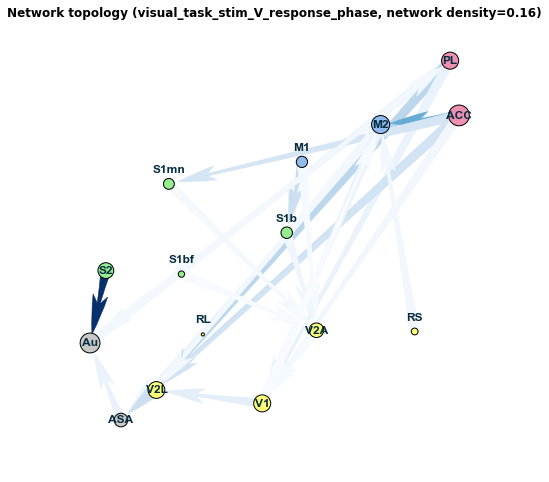

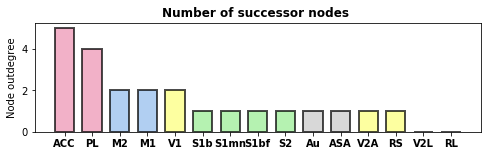

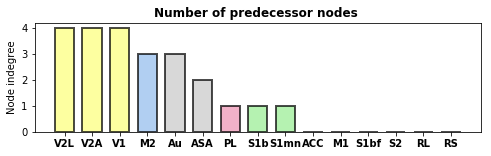

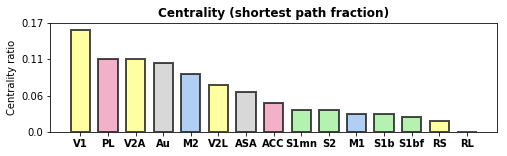

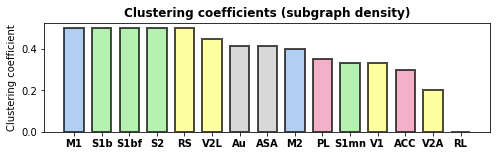

0/15 nodes were larger than max node size.
/Users/jannisborn/Desktop/HIFO/data/gc_results/1113rr/visual_task_stim_V_sensory_phase
0/15 nodes were larger than max node size.


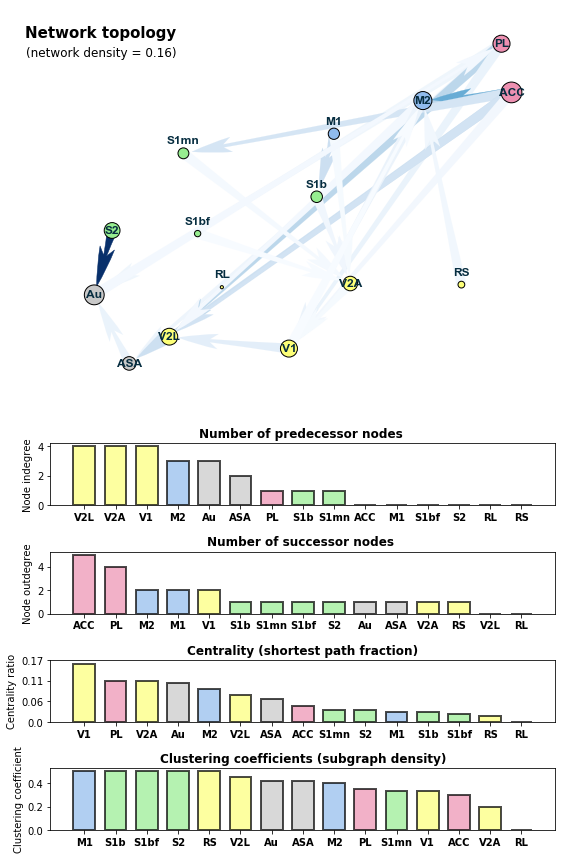

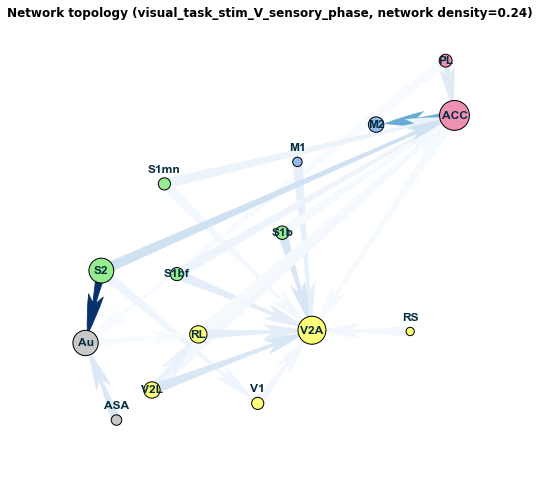

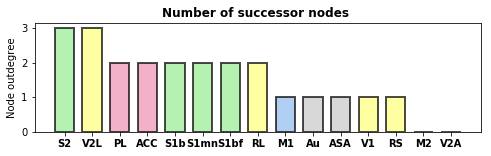

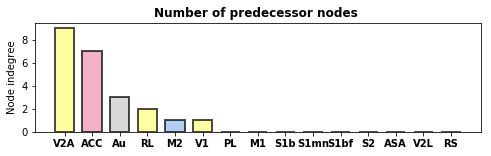

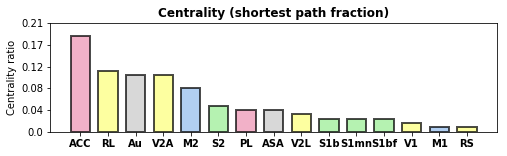

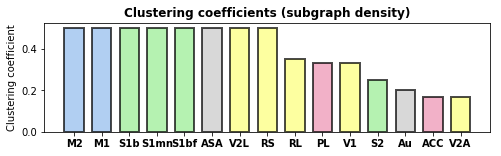

0/15 nodes were larger than max node size.
/Users/jannisborn/Desktop/HIFO/data/gc_results/1113rr/visual_task_stim_S_response_phase
0/15 nodes were larger than max node size.


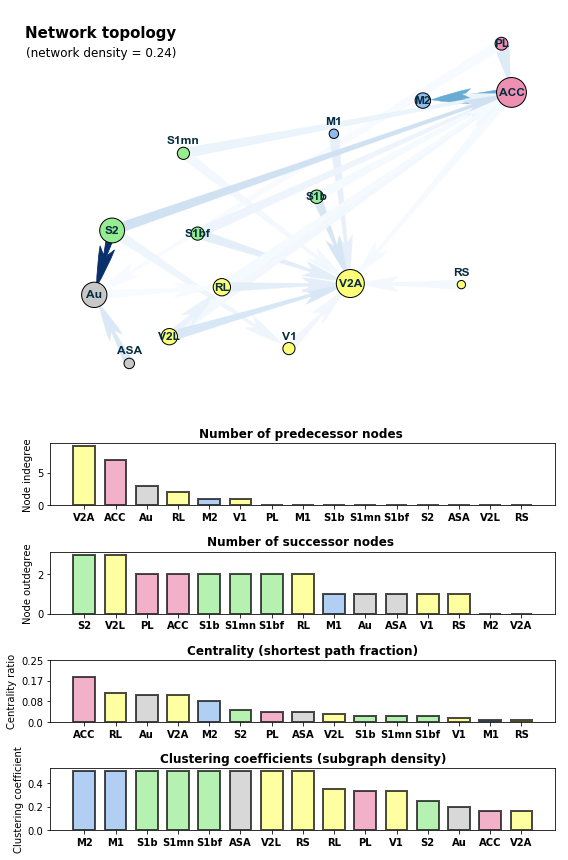

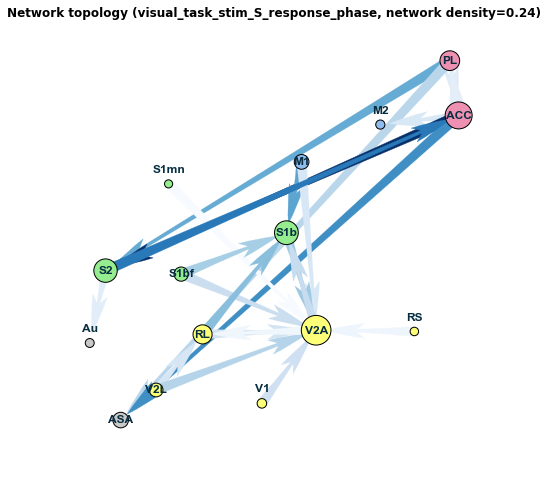

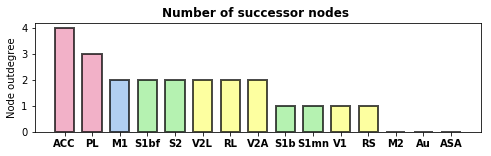

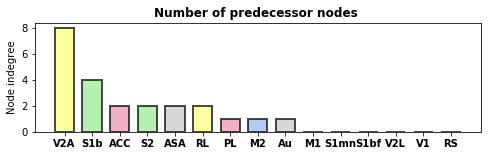

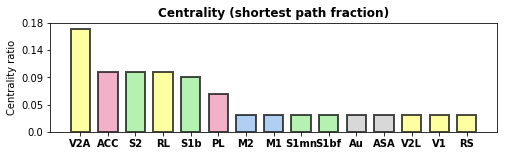

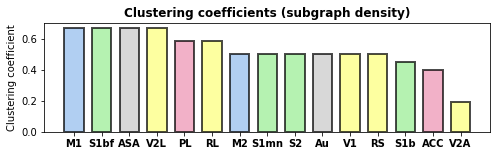

0/15 nodes were larger than max node size.
/Users/jannisborn/Desktop/HIFO/data/gc_results/1113rr/visual_task_stim_S_sensory_phase
0/15 nodes were larger than max node size.


KeyboardInterrupt: 

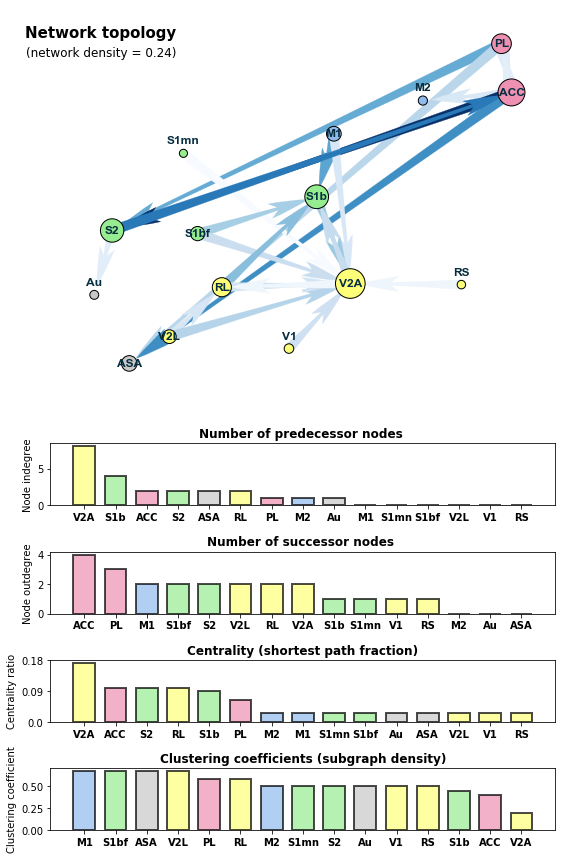

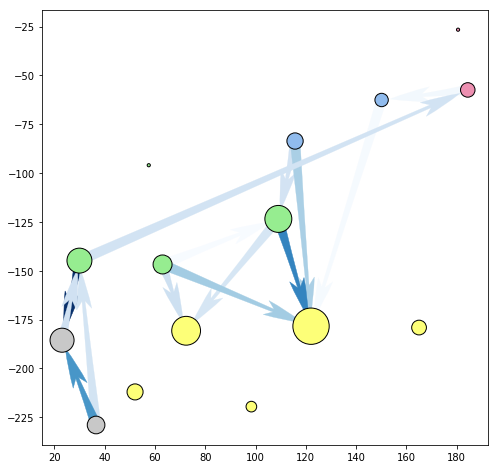

In [18]:
for mouse in mice:
    for task in tasks:
        
        for s in stim:
            for phase in phases:

                p  = root.format(mouse, task, "stim", s, phase)
                print(p)
                try:
                    data = scipy.io.loadmat(p+'/data.mat')
                except TypeError:
                    continue
                d = np.nan_to_num(data['results']['F'][0][0])
                theta = np.percentile(d,plot_params.get('node_percentile', 95))
                d[d<theta]=0

                plot_params.update({'save_path':p})


                G = (
                    nx.from_numpy_matrix(d, create_using=nx.DiGraph())
                    if directed else
                    nx.from_numpy_matrix(d, create_using=nx.Graph())
                )
                plot_network_topology(G, brain_reg, brain_pos, plot_params)
                plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params)
                plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params)
                plot_node_centrality(G, brain_reg, plot_p=plot_params)
                plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params)


                # PLOT ALL
                plot_params['save_plot']=False
                fig = plt.figure(figsize=(8, 12))

                ax0 = plt.subplot2grid((8, 1), (0, 0), rowspan=4)
                plot_network_topology(G, brain_reg, brain_pos, plot_params, ax=ax0)

                ax1 = plt.subplot2grid((8, 1), (4, 0))
                plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params, ax=ax1)

                ax2 = plt.subplot2grid((8, 1), (5, 0))
                plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params, ax=ax2)

                ax3 = plt.subplot2grid((8, 1), (6, 0))
                plot_node_centrality(G, brain_reg, plot_p=plot_params, ax=ax3)

                ax4 = plt.subplot2grid((8, 1), (7, 0))
                plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params,ax=ax4)
                fig.tight_layout()
                fig.savefig(plot_params['save_path']+'/overview.eps')

                plot_params['save_plot']=True
                
                
        for b in behs:
            for phase in phases:
                p  = root.format(mouse, task, "beh", b, phase)
                print(p)
                try:
                    data = scipy.io.loadmat(p+'/data.mat')
                except TypeError:
                    continue
                d = np.nan_to_num(data['results']['F'][0][0])
                theta = np.percentile(d,plot_params.get('node_percentile', 95))
                d[d<theta]=0

                plot_params.update({'save_path':p})


                G = (
                    nx.from_numpy_matrix(d, create_using=nx.DiGraph())
                    if directed else
                    nx.from_numpy_matrix(d, create_using=nx.Graph())
                )
                plot_network_topology(G, brain_reg, brain_pos, plot_params)
                plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params)
                plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params)
                plot_node_centrality(G, brain_reg, plot_p=plot_params)
                plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params)


                # PLOT ALL
                plot_params['save_plot']=False
                fig = plt.figure(figsize=(8, 12))

                ax0 = plt.subplot2grid((8, 1), (0, 0), rowspan=4)
                plot_network_topology(G, brain_reg, brain_pos, plot_params, ax=ax0)

                ax1 = plt.subplot2grid((8, 1), (4, 0))
                plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params, ax=ax1)

                ax2 = plt.subplot2grid((8, 1), (5, 0))
                plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params, ax=ax2)

                ax3 = plt.subplot2grid((8, 1), (6, 0))
                plot_node_centrality(G, brain_reg, plot_p=plot_params, ax=ax3)

                ax4 = plt.subplot2grid((8, 1), (7, 0))
                plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params,ax=ax4)
                fig.tight_layout()
                fig.savefig(plot_params['save_path']+'/overview.eps')

                plot_params['save_plot']=True




### The below plot is basically the same, but performs an average analysis (across all mice)

0/15 nodes were larger than max node size.
0.22183601870312986 [0.00643037 0.00598954 0.01849116 0.00995882 0.00669022 0.01434248
 0.00793828 0.0066833  0.00693055 0.01376012 0.0091807  0.01107504
 0.00638533 0.01148006 0.00829012 0.0068375  0.00761233 0.01285562
 0.01224133 0.00750153 0.00681117 0.01053486 0.01381559]


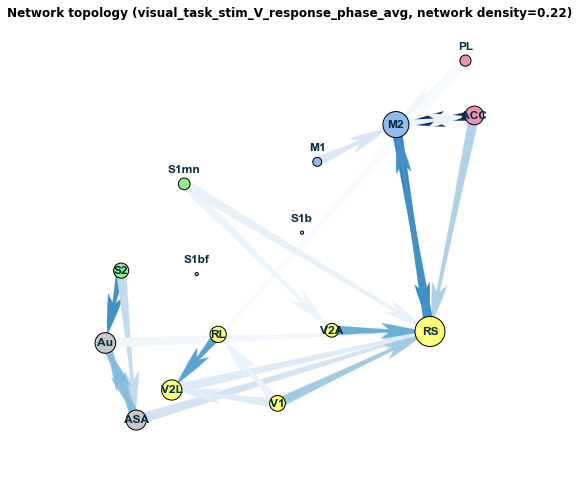

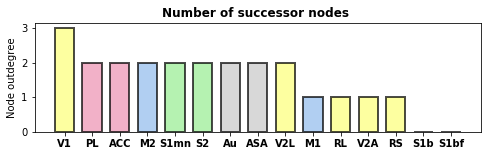

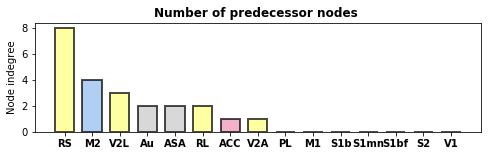

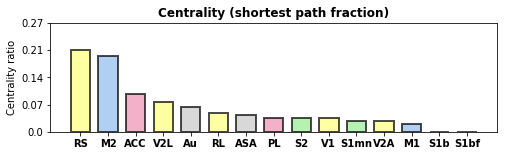

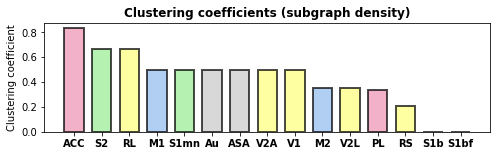

0/15 nodes were larger than max node size.
0.22183601870312986 [0.00643037 0.00598954 0.01849116 0.00995882 0.00669022 0.01434248
 0.00793828 0.0066833  0.00693055 0.01376012 0.0091807  0.01107504
 0.00638533 0.01148006 0.00829012 0.0068375  0.00761233 0.01285562
 0.01224133 0.00750153 0.00681117 0.01053486 0.01381559]
0/15 nodes were larger than max node size.
0.16549780595417785 [0.00509769 0.00588677 0.01830241 0.00647843 0.00562336 0.00778441
 0.00503925 0.00619775 0.00720269 0.00851632 0.00530748 0.00585471
 0.00507149 0.00541158 0.00531945 0.00627921 0.01172147 0.00569819
 0.00526454 0.01251205 0.00556252 0.00941793 0.0059481 ]


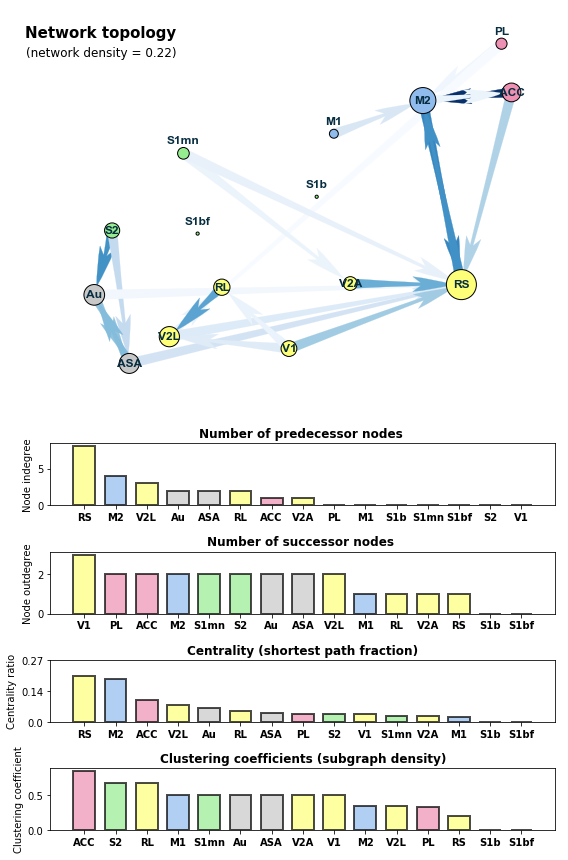

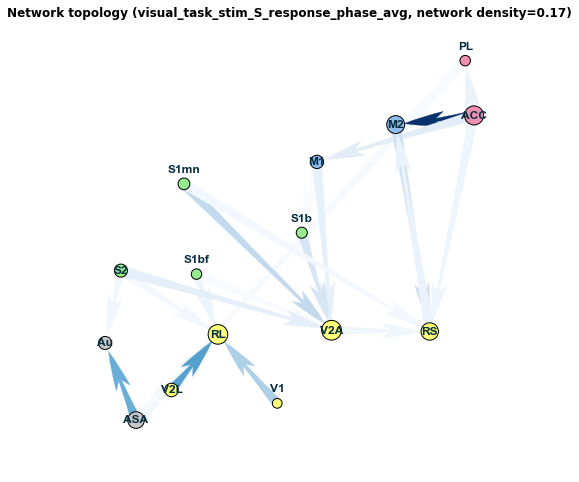

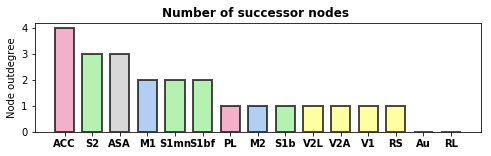

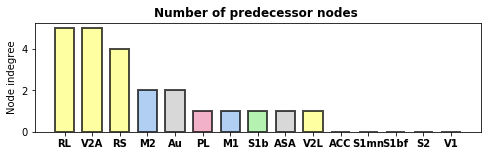

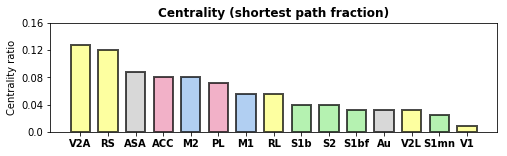

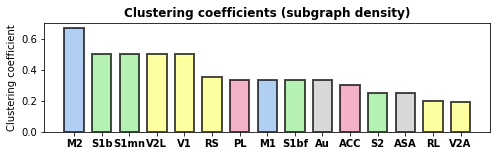

0/15 nodes were larger than max node size.
0.16549780595417785 [0.00509769 0.00588677 0.01830241 0.00647843 0.00562336 0.00778441
 0.00503925 0.00619775 0.00720269 0.00851632 0.00530748 0.00585471
 0.00507149 0.00541158 0.00531945 0.00627921 0.01172147 0.00569819
 0.00526454 0.01251205 0.00556252 0.00941793 0.0059481 ]
0/15 nodes were larger than max node size.
0.17188794422755116 [0.00888853 0.01285828 0.00650664 0.00730382 0.00506668 0.00839412
 0.00785742 0.00658737 0.00569587 0.01308743 0.00698083 0.00491339
 0.01923952 0.00439836 0.01043662 0.00498082 0.00447417 0.00473439
 0.00562385 0.00783683 0.00500833 0.00487187 0.00614278]


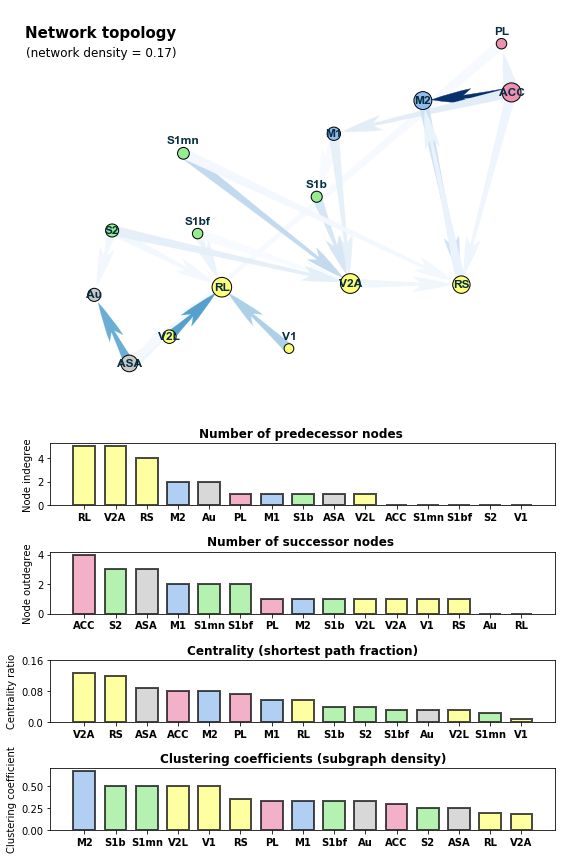

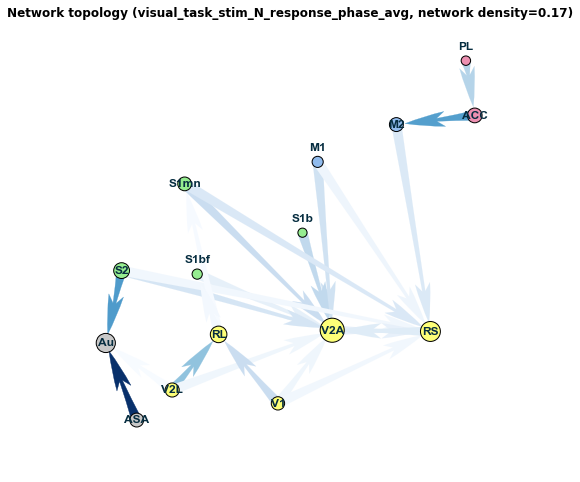

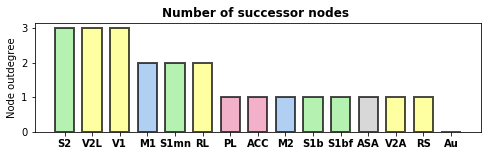

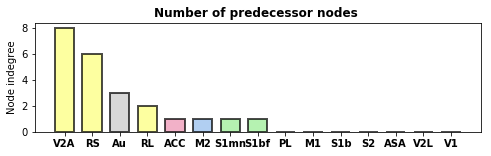

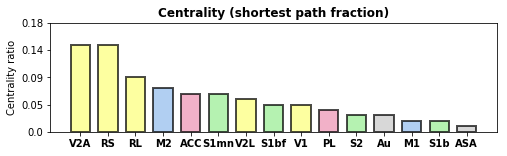

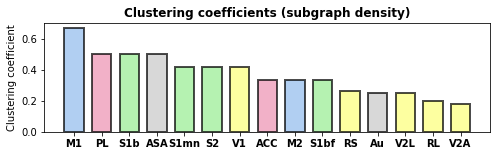

0/15 nodes were larger than max node size.
0.17188794422755116 [0.00888853 0.01285828 0.00650664 0.00730382 0.00506668 0.00839412
 0.00785742 0.00658737 0.00569587 0.01308743 0.00698083 0.00491339
 0.01923952 0.00439836 0.01043662 0.00498082 0.00447417 0.00473439
 0.00562385 0.00783683 0.00500833 0.00487187 0.00614278]
0/15 nodes were larger than max node size.
0.24606635207551575 [0.00719622 0.00748879 0.00932032 0.01876403 0.0075166  0.01013527
 0.00917473 0.01749517 0.00751203 0.00969945 0.00913672 0.00882201
 0.01113405 0.01005719 0.01135675 0.01070535 0.00902246 0.00813007
 0.00732077 0.01644566 0.01347336 0.00980849 0.01635088]


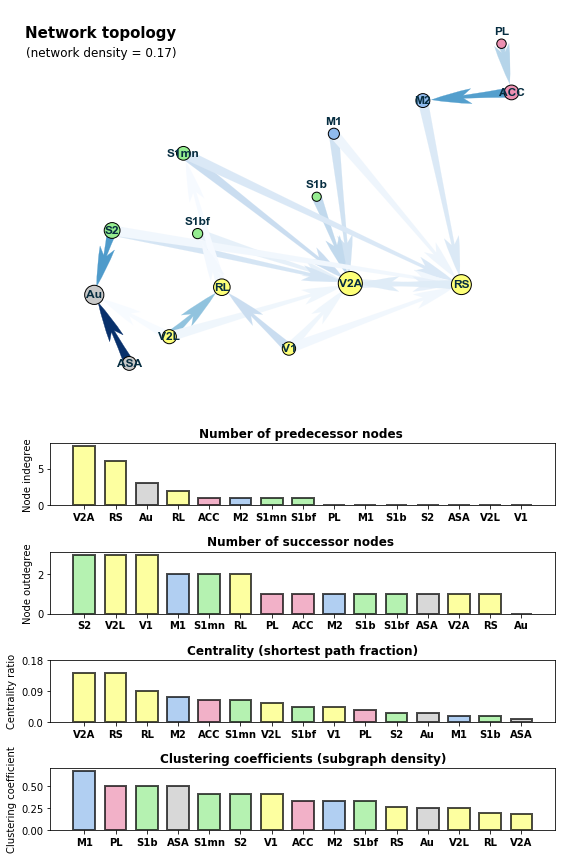

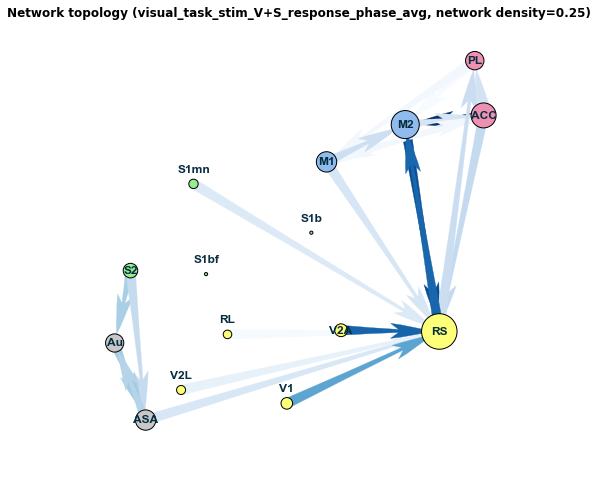

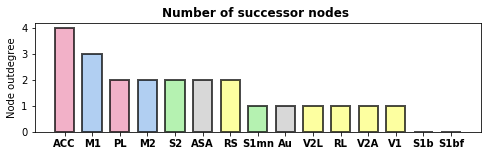

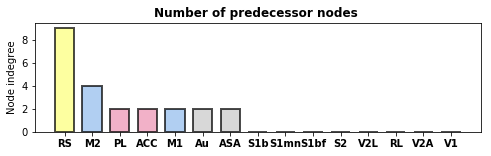

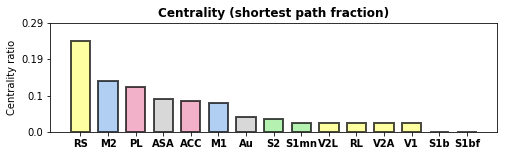

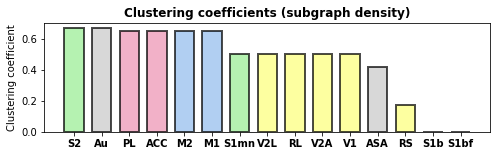

0/15 nodes were larger than max node size.
0.24606635207551575 [0.00719622 0.00748879 0.00932032 0.01876403 0.0075166  0.01013527
 0.00917473 0.01749517 0.00751203 0.00969945 0.00913672 0.00882201
 0.01113405 0.01005719 0.01135675 0.01070535 0.00902246 0.00813007
 0.00732077 0.01644566 0.01347336 0.00980849 0.01635088]
1/15 nodes were larger than max node size.
0.4532059947934508 [0.0138561  0.02955686 0.01751177 0.01967681 0.02928018 0.01814126
 0.01957946 0.01459074 0.0161774  0.01634804 0.01606247 0.01881998
 0.01744205 0.01441096 0.0159365  0.01543823 0.01623555 0.01844739
 0.03519336 0.0261915  0.01425757 0.01656493 0.03348689]


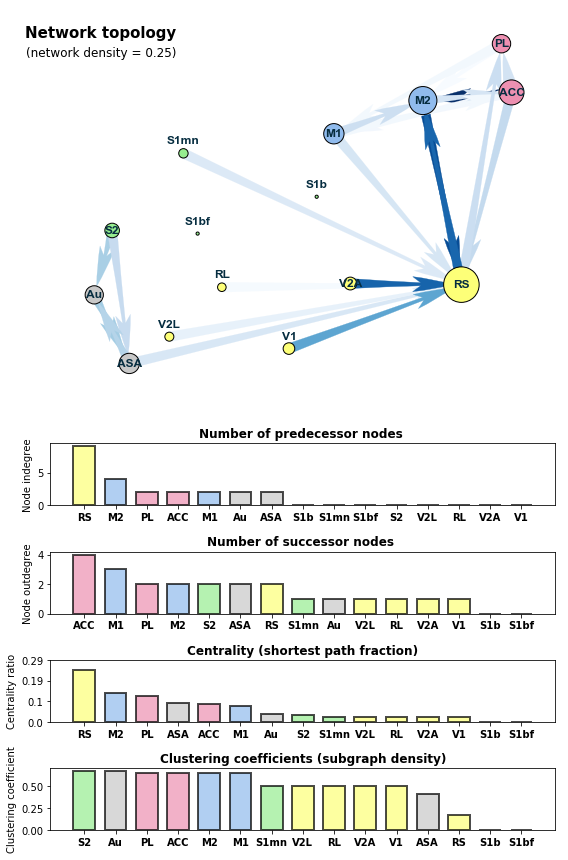

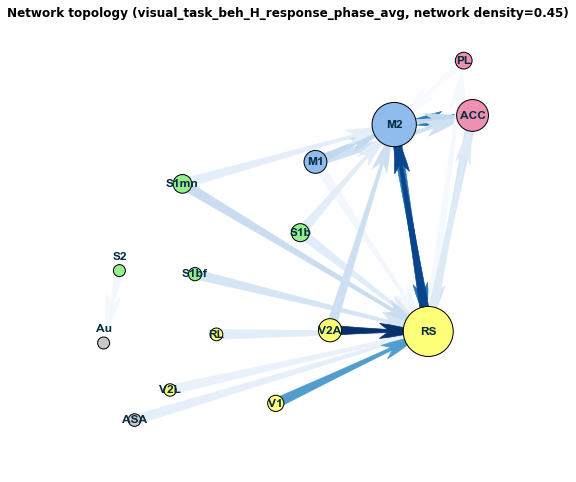

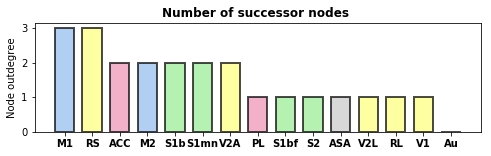

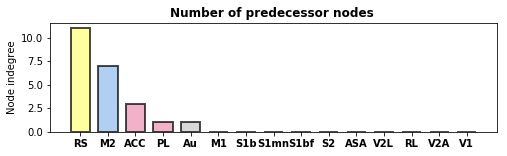

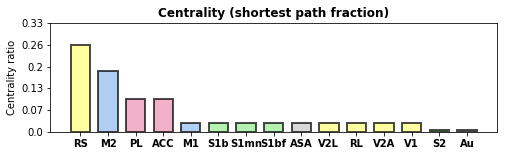

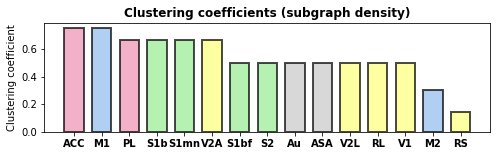

1/15 nodes were larger than max node size.
0.4532059947934508 [0.0138561  0.02955686 0.01751177 0.01967681 0.02928018 0.01814126
 0.01957946 0.01459074 0.0161774  0.01634804 0.01606247 0.01881998
 0.01744205 0.01441096 0.0159365  0.01543823 0.01623555 0.01844739
 0.03519336 0.0261915  0.01425757 0.01656493 0.03348689]
0/15 nodes were larger than max node size.
0.17957528656480148 [0.01754231 0.00814028 0.00788963 0.00594044 0.00589083 0.00588761
 0.00612734 0.00713803 0.00723806 0.00718741 0.00966142 0.00738515
 0.0078956  0.00687819 0.01032374 0.00640436 0.00628596 0.01194165
 0.00583578 0.00612376 0.00707616 0.00909891 0.00568267]


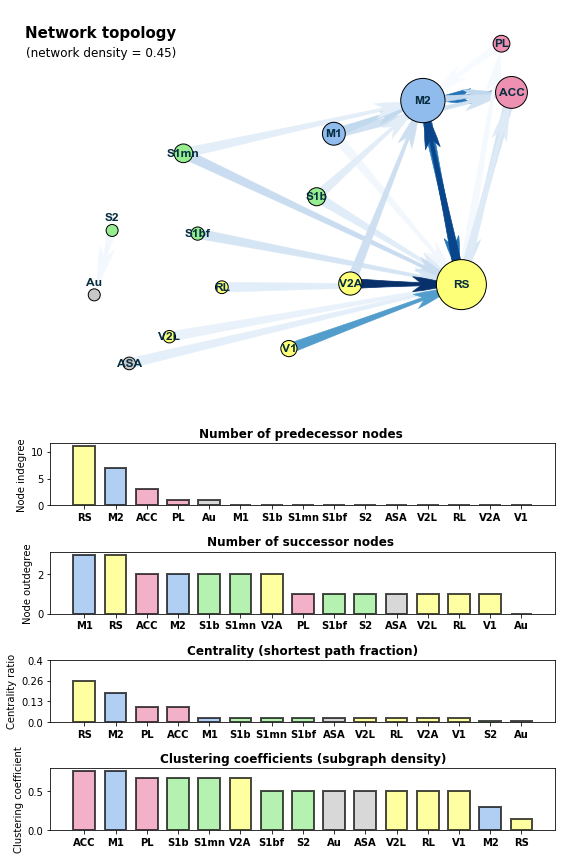

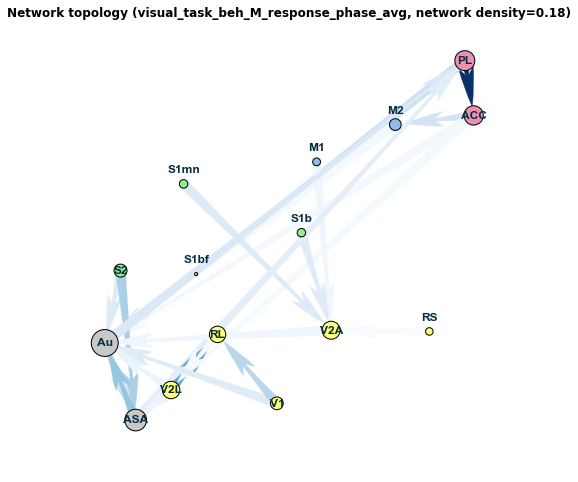

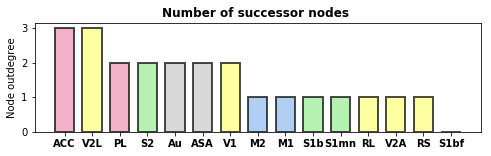

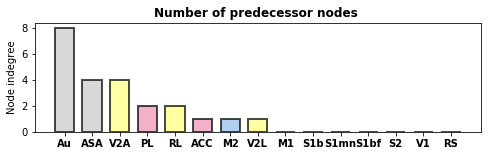

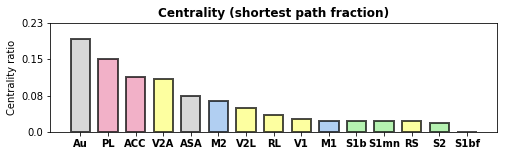

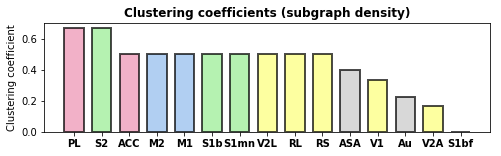

0/15 nodes were larger than max node size.
0.17957528656480148 [0.01754231 0.00814028 0.00788963 0.00594044 0.00589083 0.00588761
 0.00612734 0.00713803 0.00723806 0.00718741 0.00966142 0.00738515
 0.0078956  0.00687819 0.01032374 0.00640436 0.00628596 0.01194165
 0.00583578 0.00612376 0.00707616 0.00909891 0.00568267]
1/15 nodes were larger than max node size.
0.40862905200289124 [0.0179386  0.01253537 0.02981576 0.02312154 0.01239759 0.03525883
 0.01308347 0.01344487 0.01540985 0.0134497  0.01990002 0.01461029
 0.01269692 0.013647   0.01340811 0.01249713 0.01181741 0.01435426
 0.0137746  0.03075245 0.02245769 0.01606719 0.02619041]


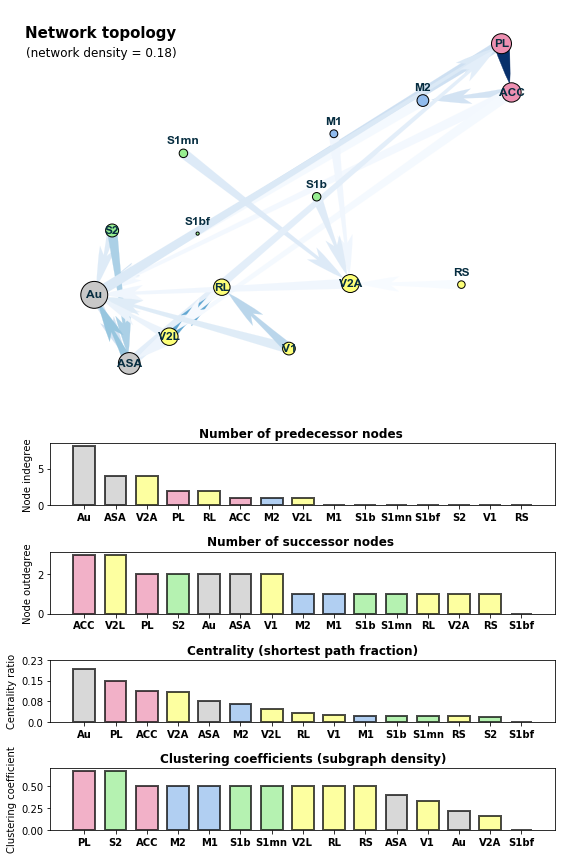

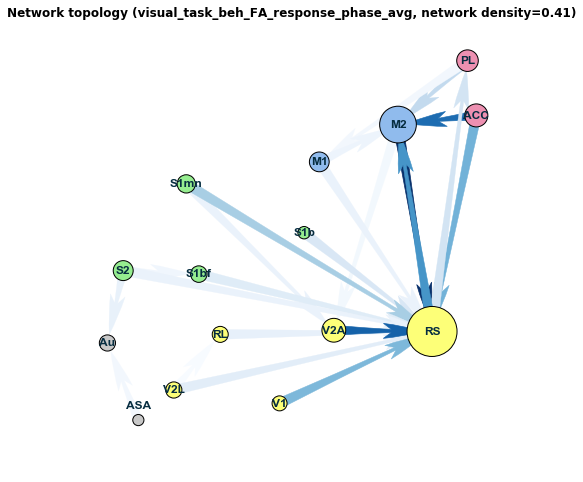

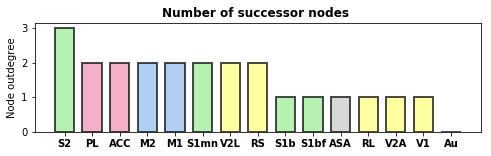

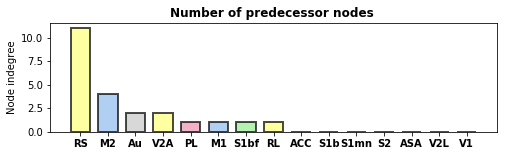

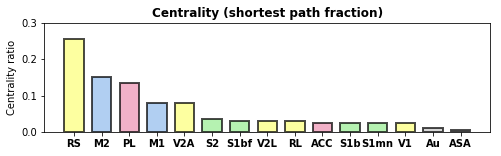

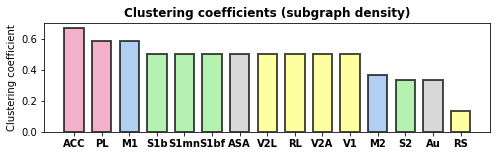

1/15 nodes were larger than max node size.
0.40862905200289124 [0.0179386  0.01253537 0.02981576 0.02312154 0.01239759 0.03525883
 0.01308347 0.01344487 0.01540985 0.0134497  0.01990002 0.01461029
 0.01269692 0.013647   0.01340811 0.01249713 0.01181741 0.01435426
 0.0137746  0.03075245 0.02245769 0.01606719 0.02619041]
0/15 nodes were larger than max node size.
0.18707246219468177 [0.02448183 0.00621952 0.00470899 0.00906886 0.00608221 0.00481085
 0.00754598 0.00532977 0.00874419 0.00478827 0.00750261 0.00668783
 0.008686   0.00640634 0.006516   0.00548061 0.01793544 0.00490765
 0.01208963 0.00532698 0.00881815 0.00649037 0.00844438]


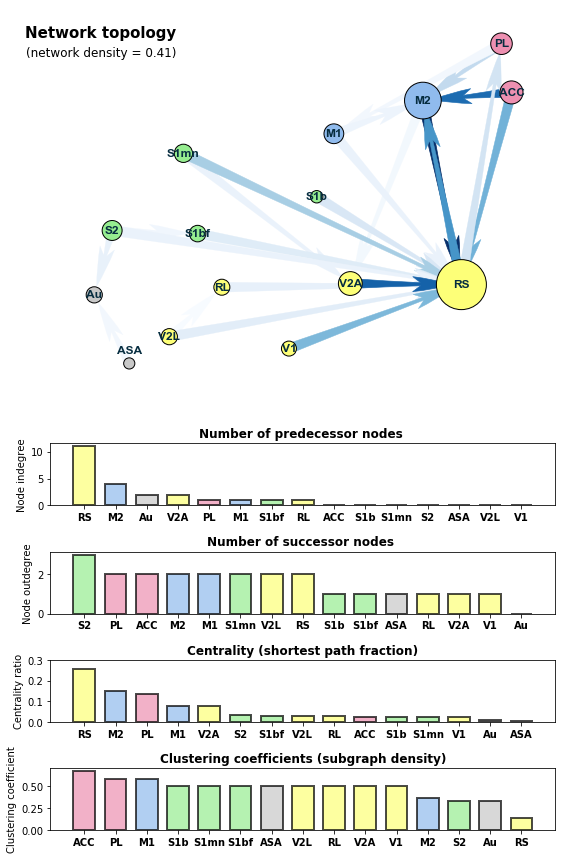

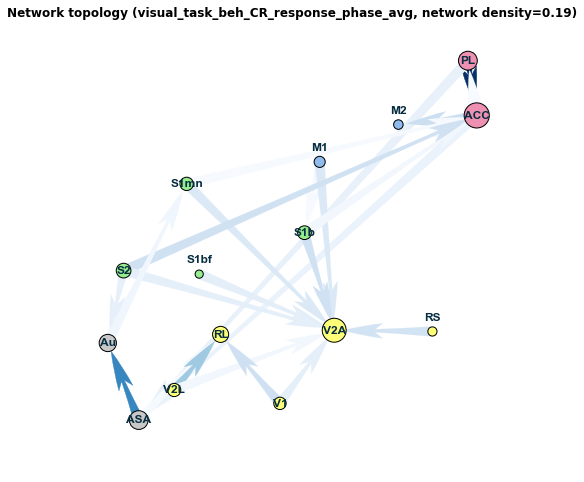

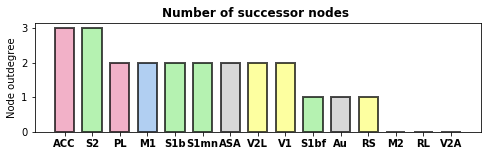

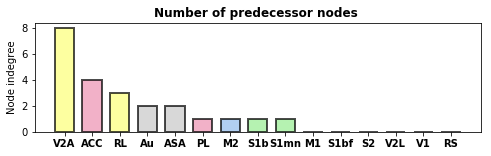

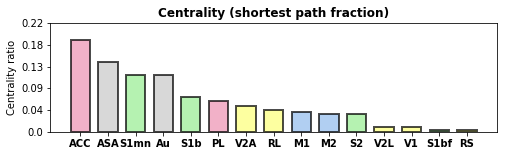

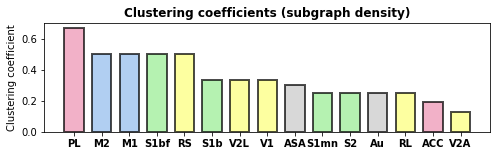

0/15 nodes were larger than max node size.
0.18707246219468177 [0.02448183 0.00621952 0.00470899 0.00906886 0.00608221 0.00481085
 0.00754598 0.00532977 0.00874419 0.00478827 0.00750261 0.00668783
 0.008686   0.00640634 0.006516   0.00548061 0.01793544 0.00490765
 0.01208963 0.00532698 0.00881815 0.00649037 0.00844438]
0/15 nodes were larger than max node size.
0.21893394137062927 [0.00886459 0.01386448 0.01066589 0.00912755 0.00748547 0.00781297
 0.00710911 0.01364067 0.00727971 0.0070513  0.01172571 0.01074375
 0.00793816 0.00817009 0.0069479  0.01061651 0.00930398 0.00793334
 0.00778124 0.01375878 0.00789105 0.01370607 0.00951559]


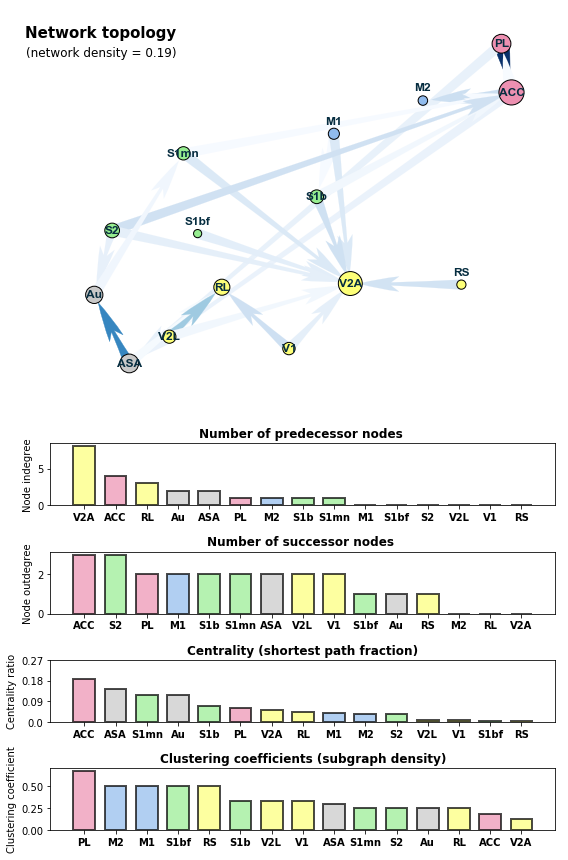

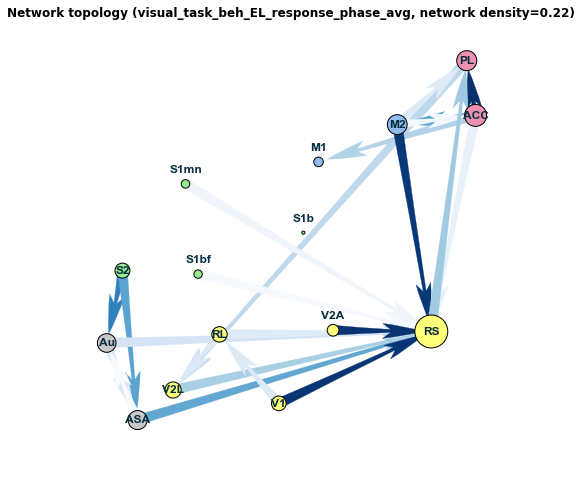

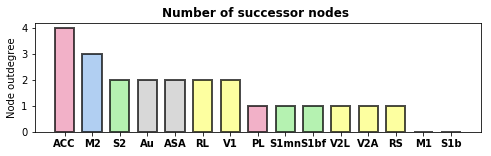

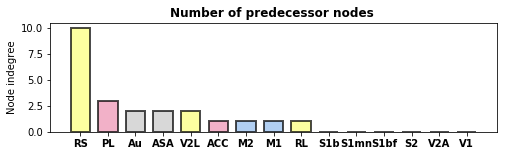

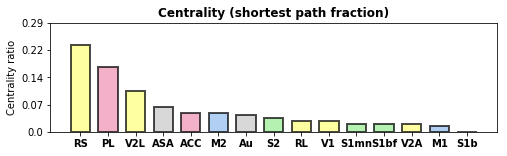

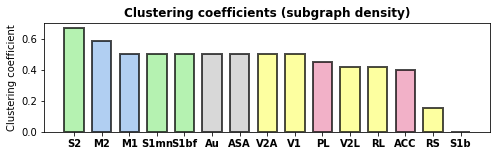

0/15 nodes were larger than max node size.
0.21893394137062927 [0.00886459 0.01386448 0.01066589 0.00912755 0.00748547 0.00781297
 0.00710911 0.01364067 0.00727971 0.0070513  0.01172571 0.01074375
 0.00793816 0.00817009 0.0069479  0.01061651 0.00930398 0.00793334
 0.00778124 0.01375878 0.00789105 0.01370607 0.00951559]
0/15 nodes were larger than max node size.
0.2474382565550548 [0.01824273 0.01438663 0.00879794 0.00806839 0.01091366 0.00830933
 0.01125416 0.0090611  0.0084639  0.01084101 0.01598824 0.01005978
 0.009544   0.01302041 0.00797598 0.01282989 0.01214918 0.00963406
 0.01020031 0.00825831 0.01306494 0.00844825 0.00792608]


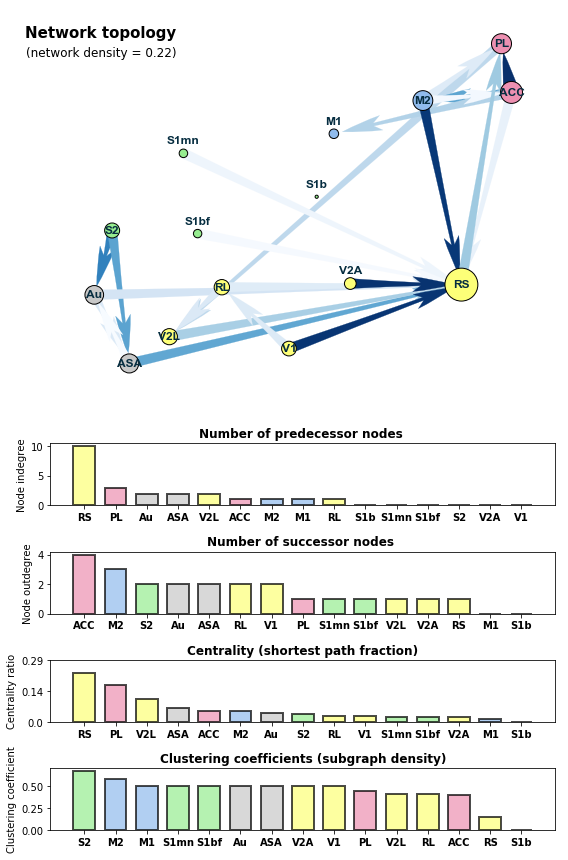

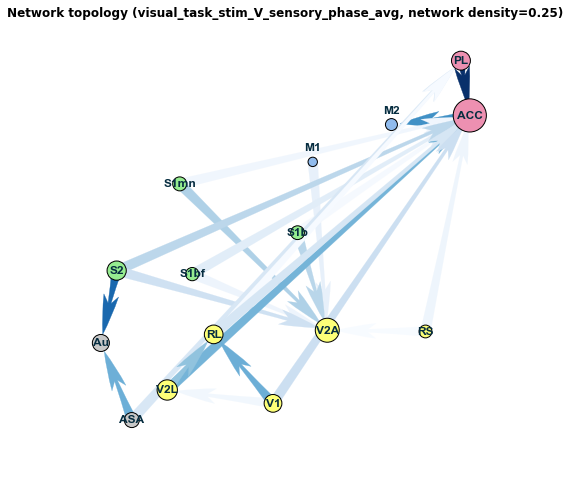

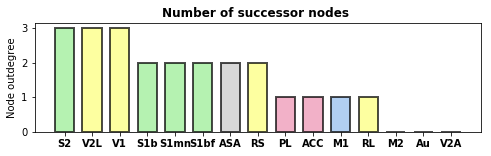

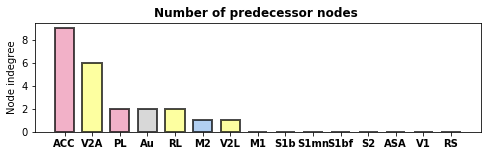

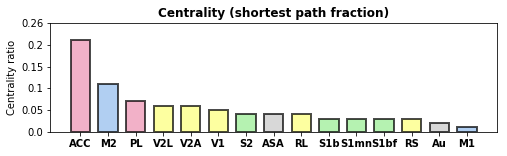

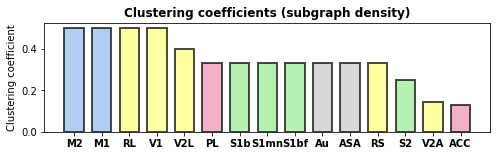

0/15 nodes were larger than max node size.
0.2474382565550548 [0.01824273 0.01438663 0.00879794 0.00806839 0.01091366 0.00830933
 0.01125416 0.0090611  0.0084639  0.01084101 0.01598824 0.01005978
 0.009544   0.01302041 0.00797598 0.01282989 0.01214918 0.00963406
 0.01020031 0.00825831 0.01306494 0.00844825 0.00792608]
0/15 nodes were larger than max node size.
0.2583936172033474 [0.01591493 0.00727501 0.01308706 0.0169143  0.01627516 0.01459455
 0.00715239 0.0067504  0.01020867 0.01597622 0.00790925 0.0071141
 0.01256794 0.0067781  0.00687452 0.01778187 0.01131807 0.01437671
 0.00649621 0.01040313 0.0088217  0.01316917 0.01063414]


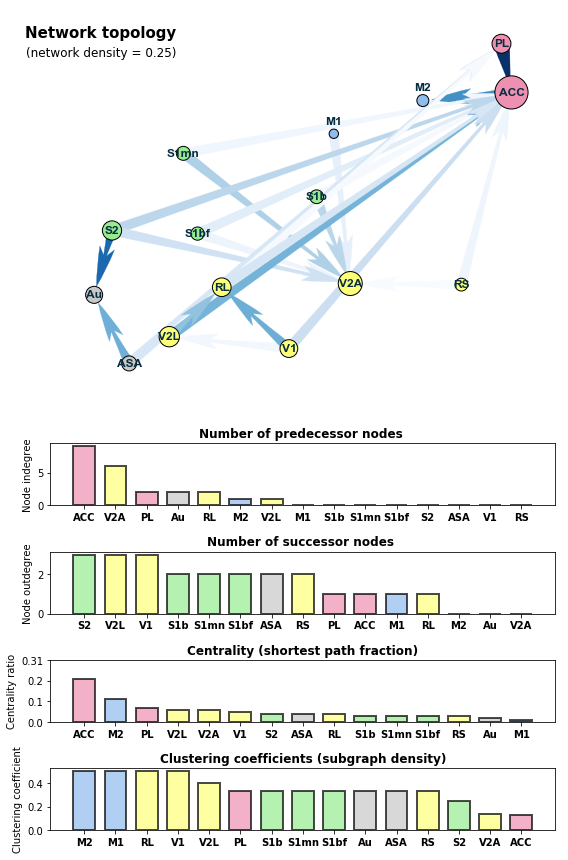

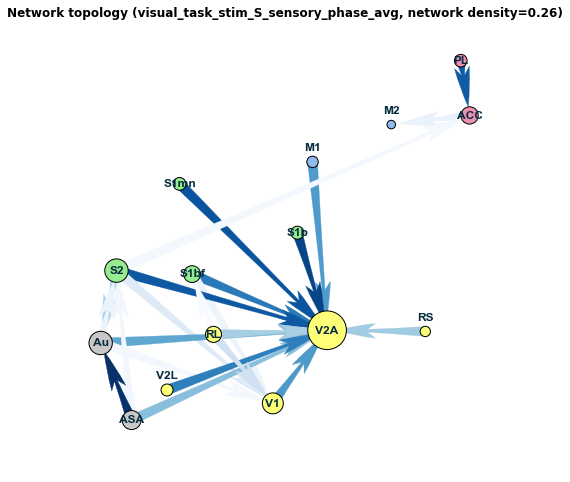

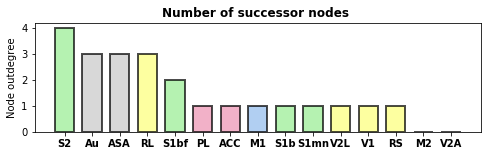

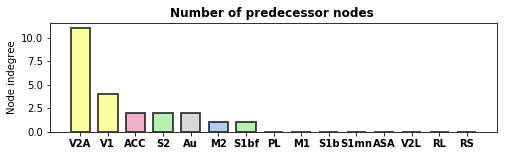

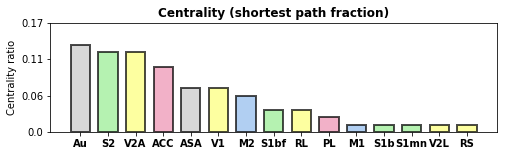

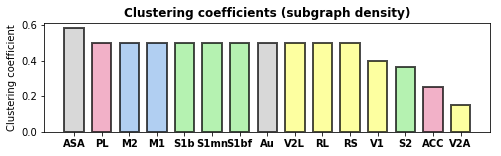

0/15 nodes were larger than max node size.
0.2583936172033474 [0.01591493 0.00727501 0.01308706 0.0169143  0.01627516 0.01459455
 0.00715239 0.0067504  0.01020867 0.01597622 0.00790925 0.0071141
 0.01256794 0.0067781  0.00687452 0.01778187 0.01131807 0.01437671
 0.00649621 0.01040313 0.0088217  0.01316917 0.01063414]
0/15 nodes were larger than max node size.
0.23525069877427418 [0.02751935 0.01339353 0.00728578 0.00898058 0.00914105 0.01152036
 0.00848175 0.01051392 0.00913315 0.00869709 0.00859713 0.01122945
 0.01016971 0.0187021  0.00722061 0.00869629 0.00971359 0.00742939
 0.00826452 0.00744015 0.00795492 0.0075773  0.00758899]


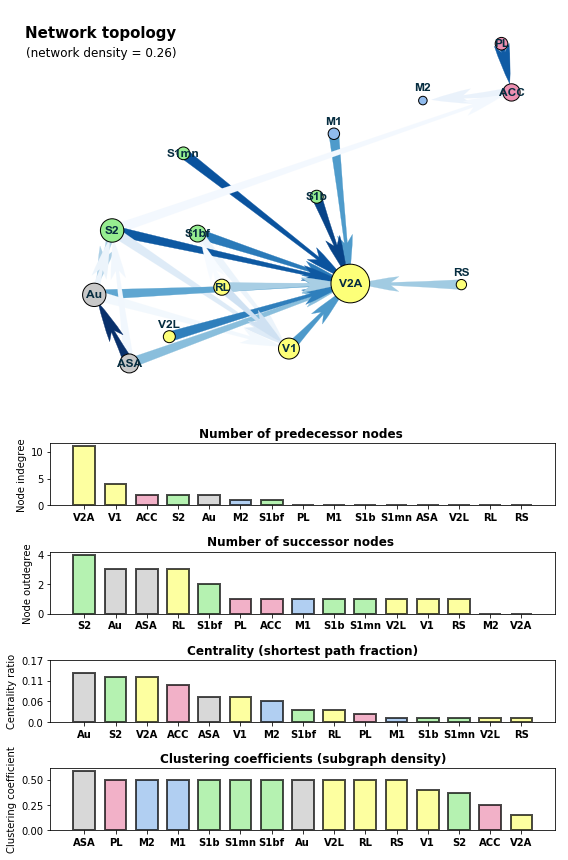

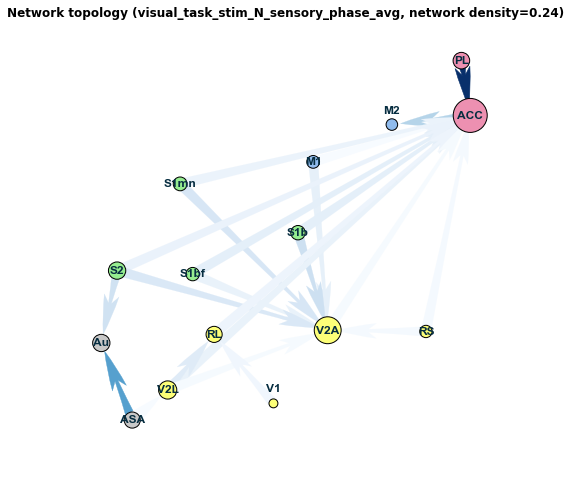

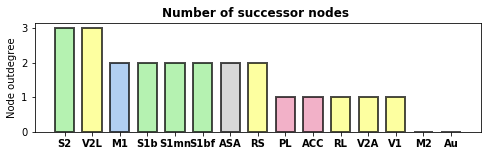

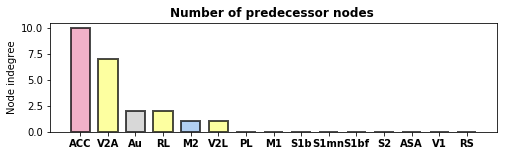

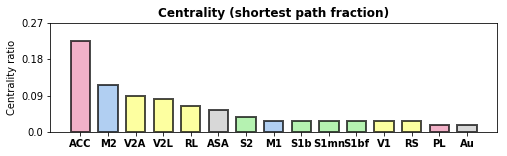

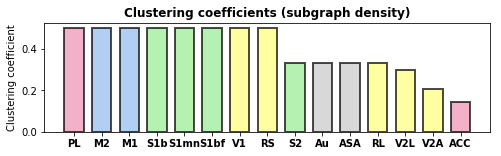

0/15 nodes were larger than max node size.
0.23525069877427418 [0.02751935 0.01339353 0.00728578 0.00898058 0.00914105 0.01152036
 0.00848175 0.01051392 0.00913315 0.00869709 0.00859713 0.01122945
 0.01016971 0.0187021  0.00722061 0.00869629 0.00971359 0.00742939
 0.00826452 0.00744015 0.00795492 0.0075773  0.00758899]
0/15 nodes were larger than max node size.
0.2677291003134563 [0.01758868 0.01035807 0.01363735 0.00918455 0.01656244 0.00953658
 0.01663401 0.00932901 0.01401171 0.01164131 0.01477772 0.01227225
 0.010994   0.01240927 0.00782033 0.01370348 0.01007082 0.00899879
 0.00874014 0.01090353 0.01064949 0.00918841 0.00871713]


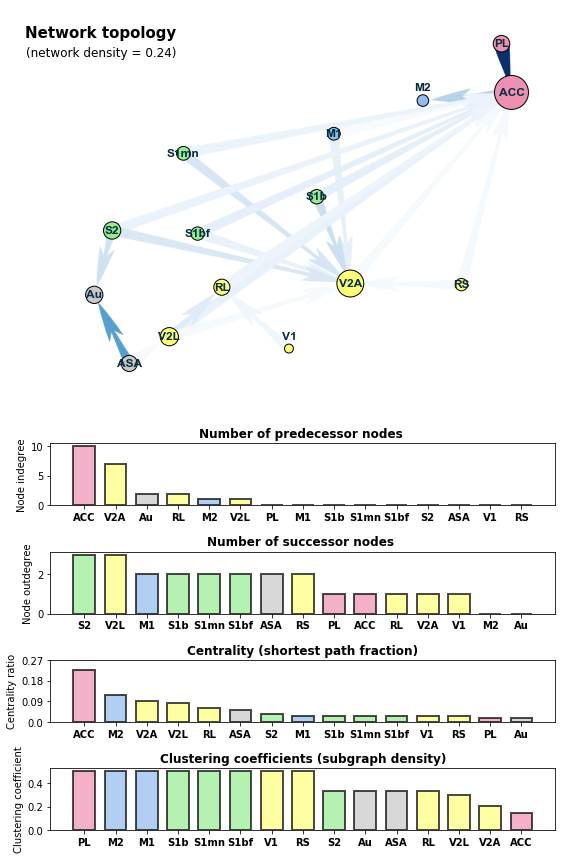

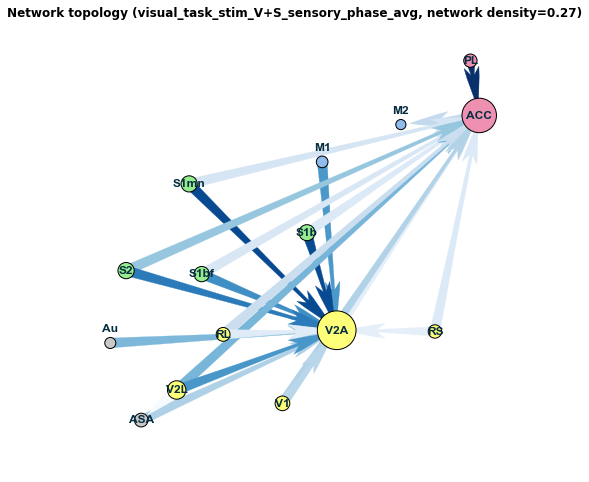

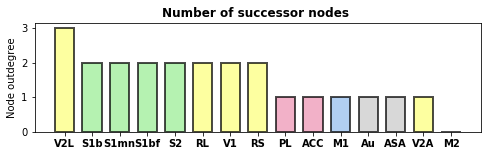

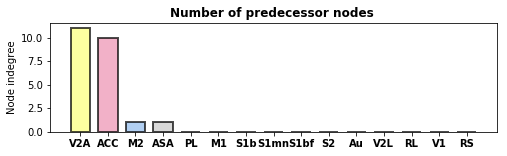

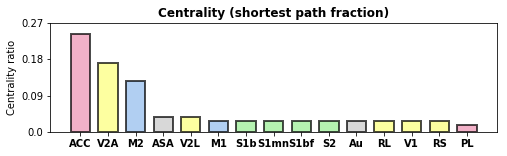

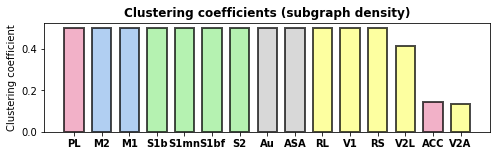

0/15 nodes were larger than max node size.
0.2677291003134563 [0.01758868 0.01035807 0.01363735 0.00918455 0.01656244 0.00953658
 0.01663401 0.00932901 0.01401171 0.01164131 0.01477772 0.01227225
 0.010994   0.01240927 0.00782033 0.01370348 0.01007082 0.00899879
 0.00874014 0.01090353 0.01064949 0.00918841 0.00871713]
0/15 nodes were larger than max node size.
0.3060573091751384 [0.0344966  0.01329769 0.01156984 0.01522263 0.0095319  0.0146839
 0.01179203 0.0131516  0.0142452  0.01113157 0.01247423 0.00987568
 0.01092785 0.01048066 0.01148598 0.01651805 0.01100952 0.01265583
 0.01063369 0.0146314  0.01225068 0.0103869  0.01360385]


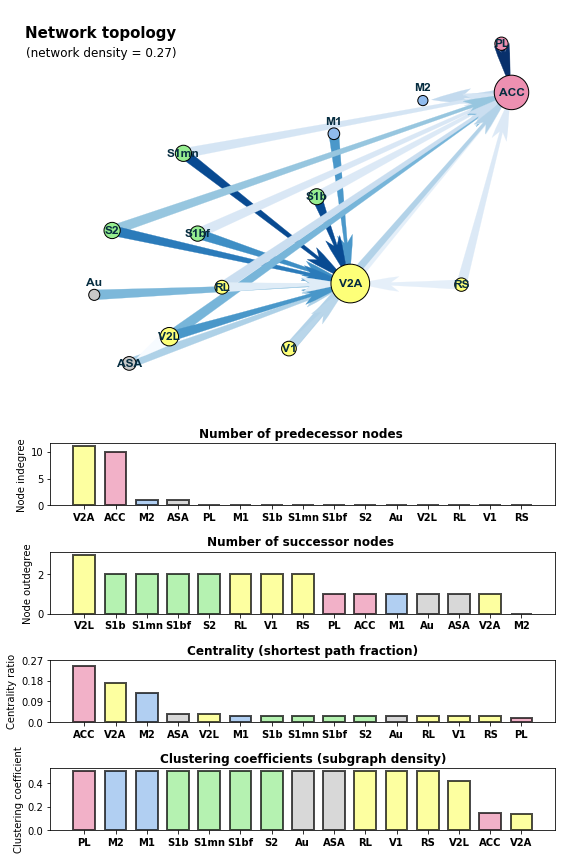

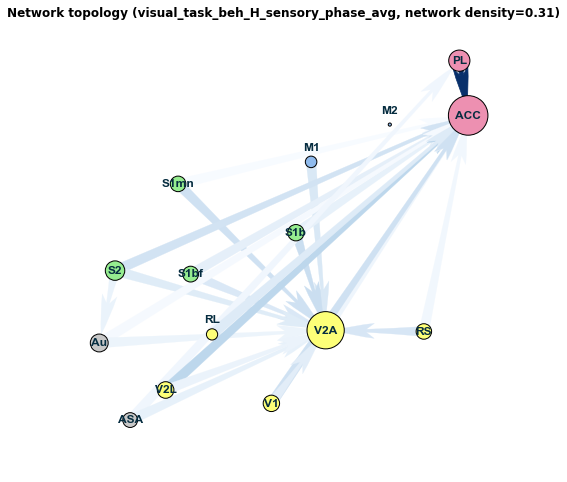

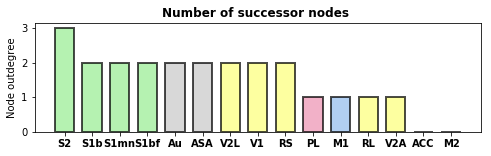

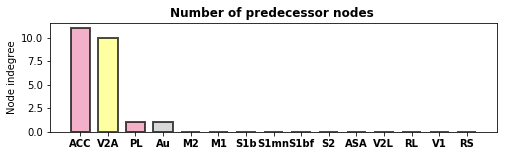

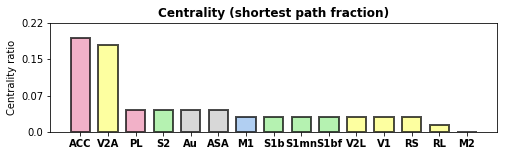

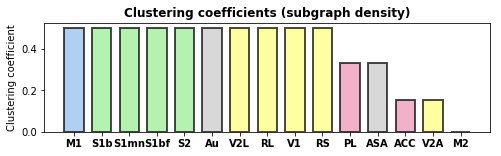

0/15 nodes were larger than max node size.
0.3060573091751384 [0.0344966  0.01329769 0.01156984 0.01522263 0.0095319  0.0146839
 0.01179203 0.0131516  0.0142452  0.01113157 0.01247423 0.00987568
 0.01092785 0.01048066 0.01148598 0.01651805 0.01100952 0.01265583
 0.01063369 0.0146314  0.01225068 0.0103869  0.01360385]
0/15 nodes were larger than max node size.
0.2789608567978674 [0.02531728 0.01025643 0.01127121 0.0135333  0.01265725 0.0105013
 0.01208119 0.01273539 0.01225855 0.00928907 0.01267134 0.01004016
 0.012533   0.01310382 0.01213578 0.01156245 0.01064681 0.00975866
 0.01180349 0.01045771 0.01163237 0.01091649 0.01179779]


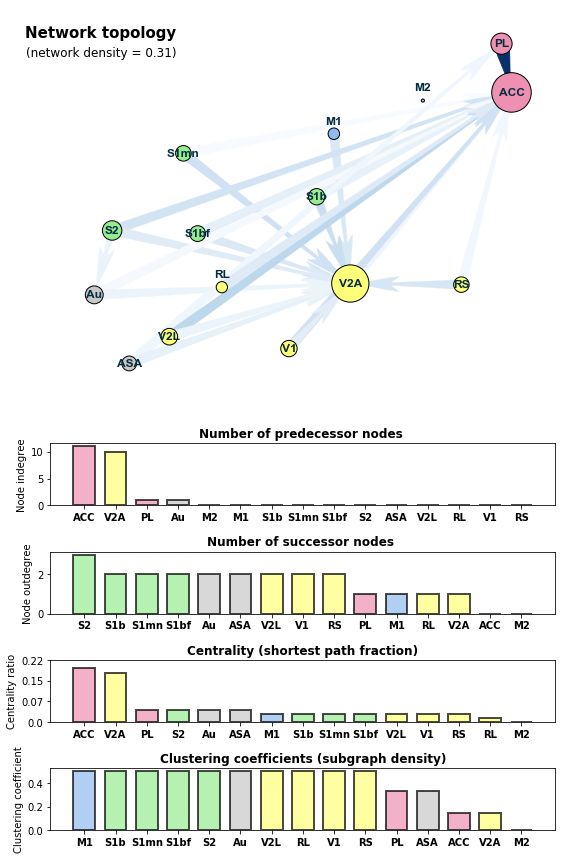

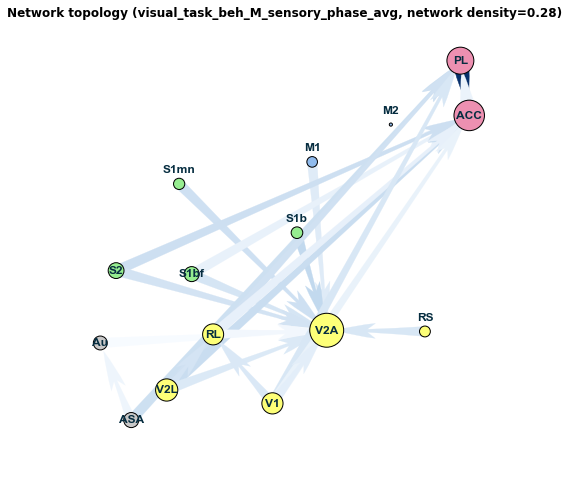

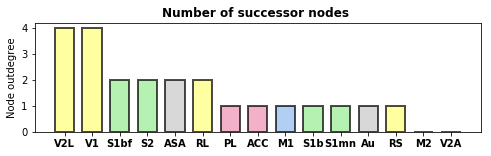

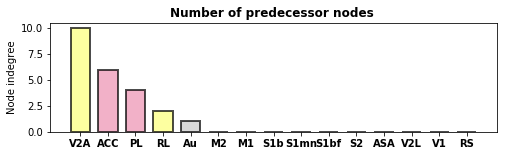

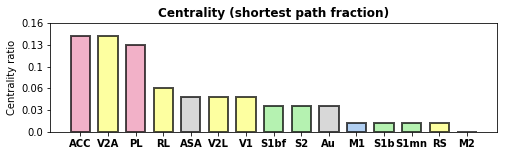

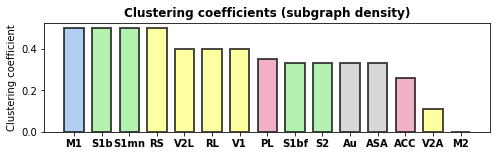

0/15 nodes were larger than max node size.
0.2789608567978674 [0.02531728 0.01025643 0.01127121 0.0135333  0.01265725 0.0105013
 0.01208119 0.01273539 0.01225855 0.00928907 0.01267134 0.01004016
 0.012533   0.01310382 0.01213578 0.01156245 0.01064681 0.00975866
 0.01180349 0.01045771 0.01163237 0.01091649 0.01179779]
0/15 nodes were larger than max node size.
0.2822051461045416 [0.0334992  0.01075103 0.00972476 0.00868865 0.01974426 0.03860798
 0.00844371 0.0108473  0.00910271 0.01140632 0.00983037 0.01020159
 0.00856596 0.01010105 0.00951524 0.00800989 0.00811942 0.01406367
 0.00928589 0.00884516 0.00882617 0.00846571 0.0075591 ]


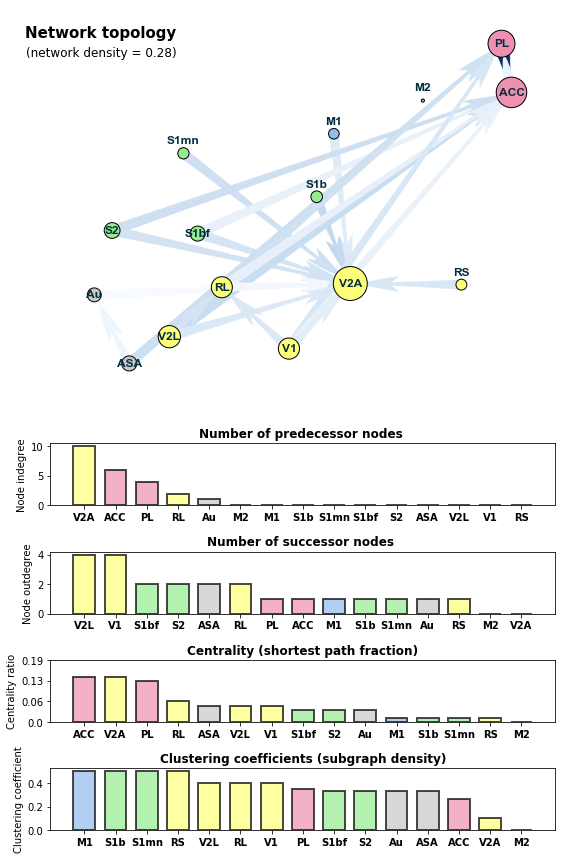

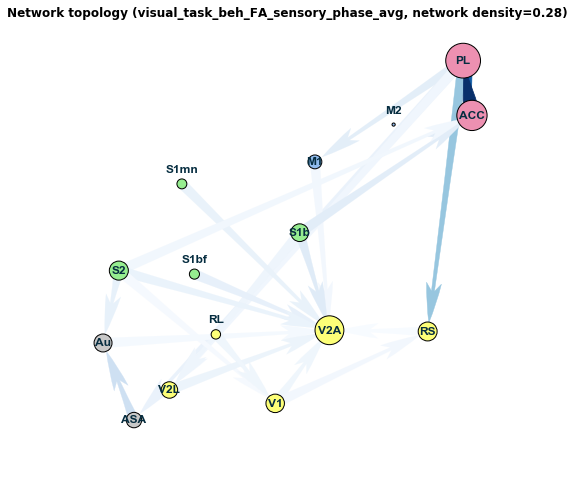

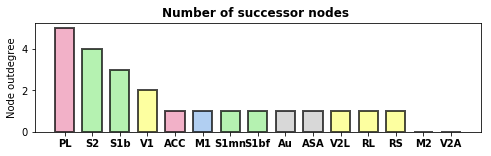

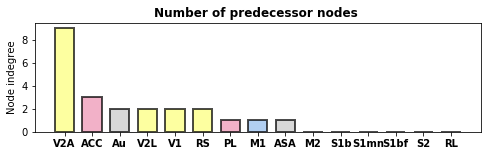

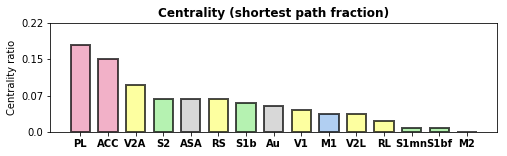

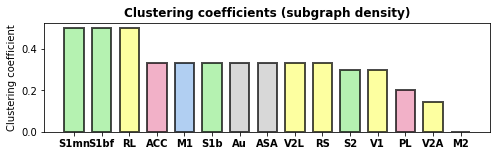

0/15 nodes were larger than max node size.
0.2822051461045416 [0.0334992  0.01075103 0.00972476 0.00868865 0.01974426 0.03860798
 0.00844371 0.0108473  0.00910271 0.01140632 0.00983037 0.01020159
 0.00856596 0.01010105 0.00951524 0.00800989 0.00811942 0.01406367
 0.00928589 0.00884516 0.00882617 0.00846571 0.0075591 ]
0/15 nodes were larger than max node size.
0.2396177092200591 [0.02626762 0.00639377 0.01072785 0.00690371 0.01338807 0.01276477
 0.00644078 0.01246878 0.00757103 0.01108825 0.01351329 0.00601882
 0.01152016 0.02087626 0.00782869 0.00705546 0.00676535 0.01005537
 0.00640861 0.00821846 0.00659855 0.01001865 0.01072543]


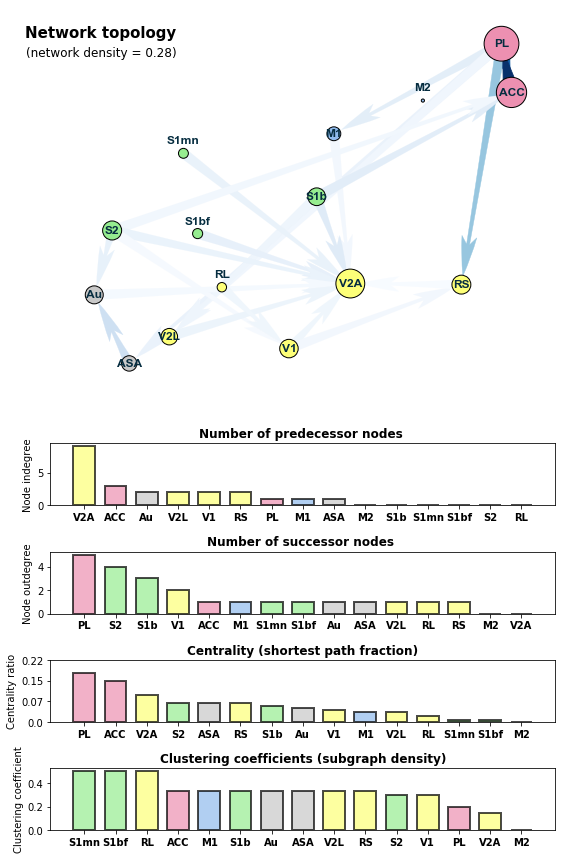

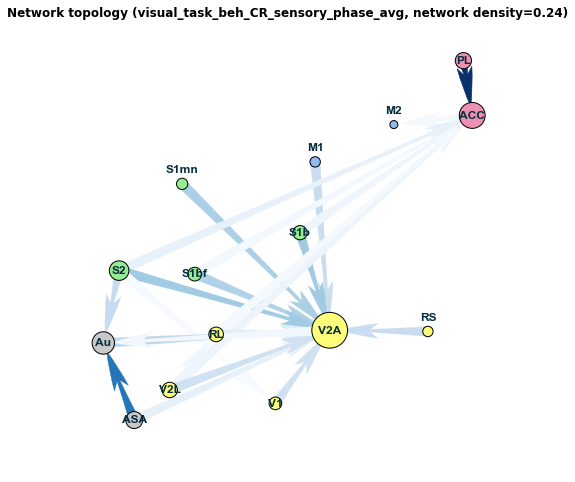

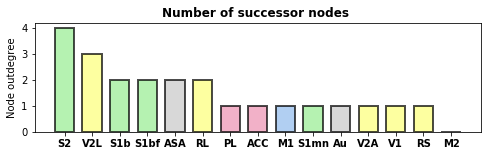

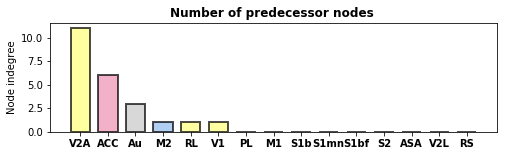

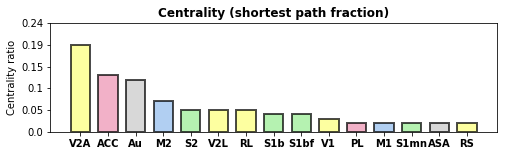

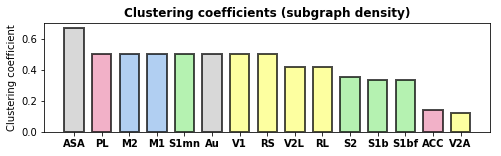

0/15 nodes were larger than max node size.
0.2396177092200591 [0.02626762 0.00639377 0.01072785 0.00690371 0.01338807 0.01276477
 0.00644078 0.01246878 0.00757103 0.01108825 0.01351329 0.00601882
 0.01152016 0.02087626 0.00782869 0.00705546 0.00676535 0.01005537
 0.00640861 0.00821846 0.00659855 0.01001865 0.01072543]
0/15 nodes were larger than max node size.
0.2226619902199678 [0.03109516 0.01080838 0.00687135 0.00715762 0.007522   0.00813661
 0.0084019  0.00833893 0.0108596  0.00711761 0.01249658 0.00908696
 0.01295569 0.00994447 0.00706177 0.0101914  0.00783773 0.00806097
 0.00763796 0.0080621  0.0068509  0.00734415 0.00882215]


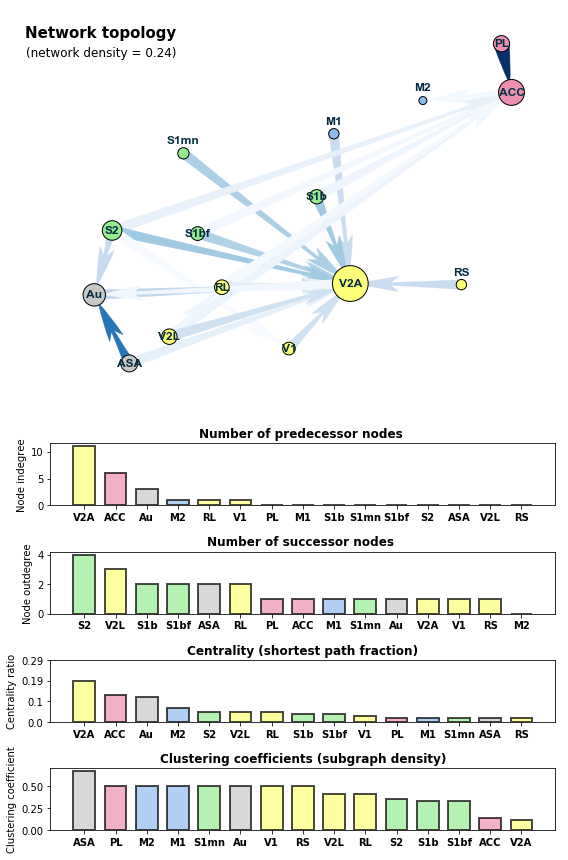

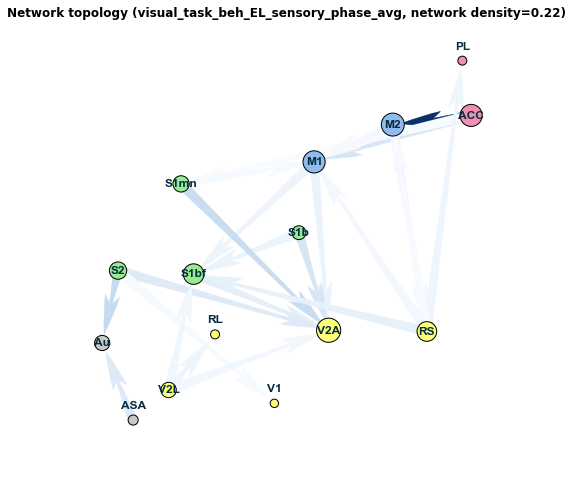

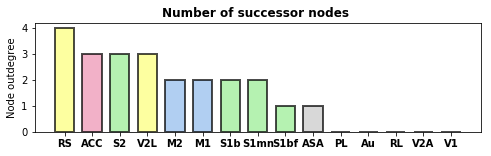

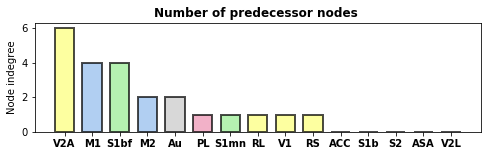

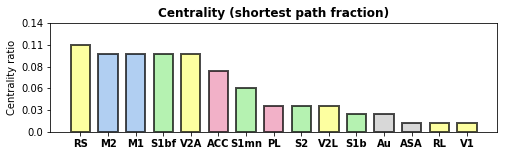

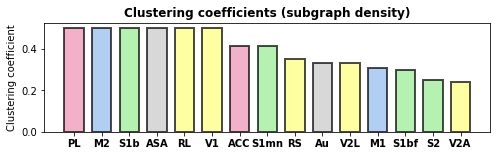

0/15 nodes were larger than max node size.
0.2226619902199678 [0.03109516 0.01080838 0.00687135 0.00715762 0.007522   0.00813661
 0.0084019  0.00833893 0.0108596  0.00711761 0.01249658 0.00908696
 0.01295569 0.00994447 0.00706177 0.0101914  0.00783773 0.00806097
 0.00763796 0.0080621  0.0068509  0.00734415 0.00882215]
2/15 nodes were larger than max node size.
0.5245243863587334 [0.0111698  0.01060238 0.01519132 0.01312319 0.0095137  0.01207088
 0.01137072 0.00895552 0.01380143 0.01572058 0.03456065 0.02318737
 0.07221239 0.14893428 0.01182366 0.02577788 0.02184694 0.00988829
 0.00886401 0.01100217 0.00885403 0.01050574 0.01554746]


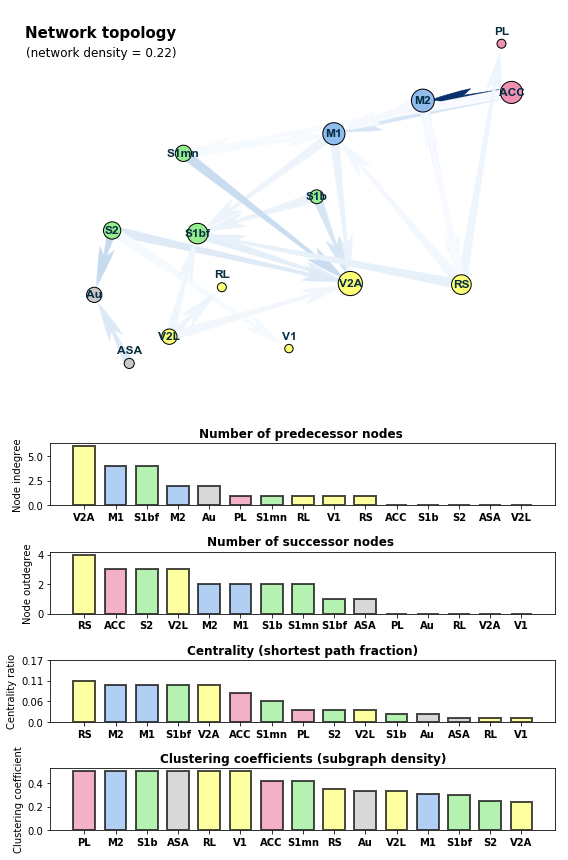

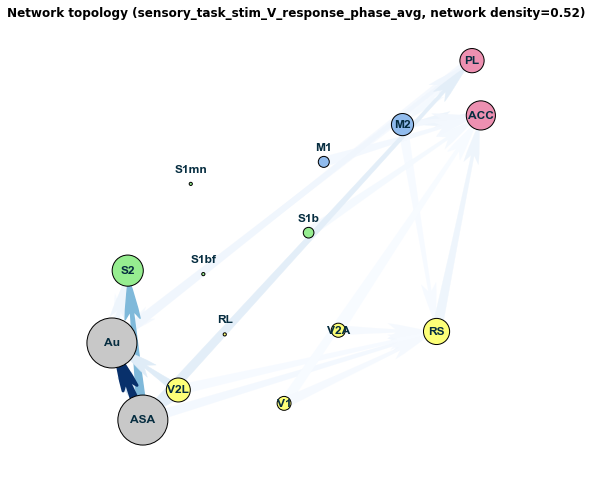

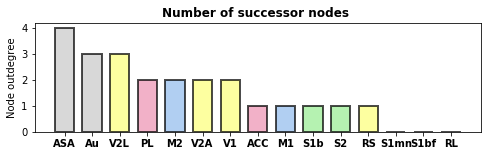

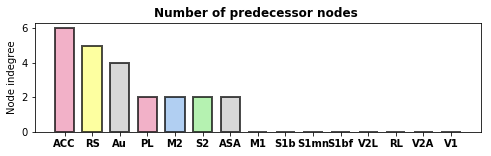

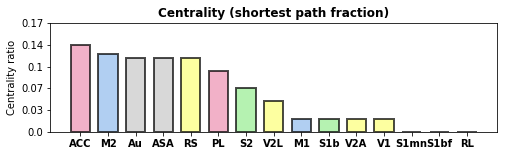

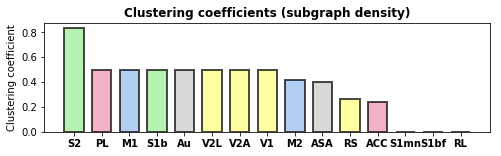

2/15 nodes were larger than max node size.
0.5245243863587334 [0.0111698  0.01060238 0.01519132 0.01312319 0.0095137  0.01207088
 0.01137072 0.00895552 0.01380143 0.01572058 0.03456065 0.02318737
 0.07221239 0.14893428 0.01182366 0.02577788 0.02184694 0.00988829
 0.00886401 0.01100217 0.00885403 0.01050574 0.01554746]
1/15 nodes were larger than max node size.
0.4285104676247564 [0.01106373 0.00977783 0.01153267 0.01149624 0.01141283 0.01000125
 0.02390059 0.02259356 0.02386995 0.02512348 0.01904473 0.01917488
 0.01078638 0.01837871 0.02662334 0.00955789 0.02731771 0.01911932
 0.04546369 0.00942456 0.04059414 0.00993223 0.01232074]


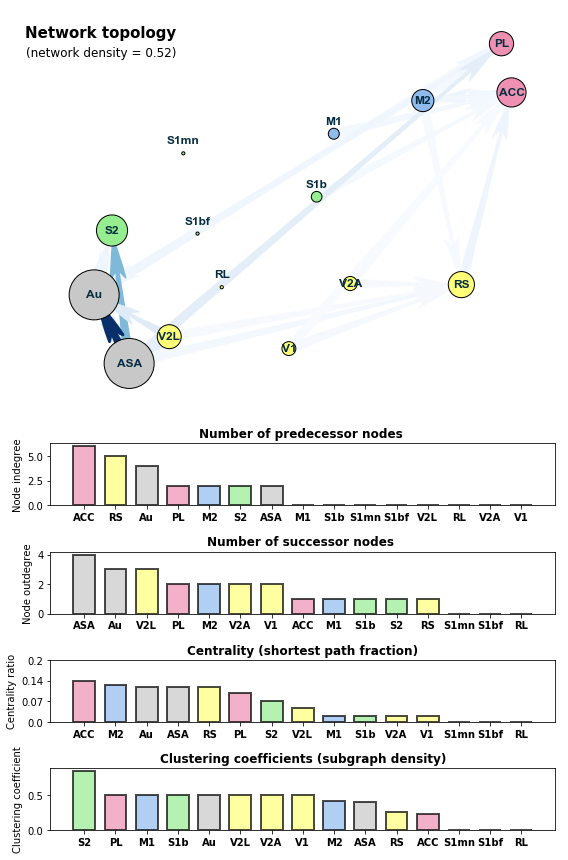

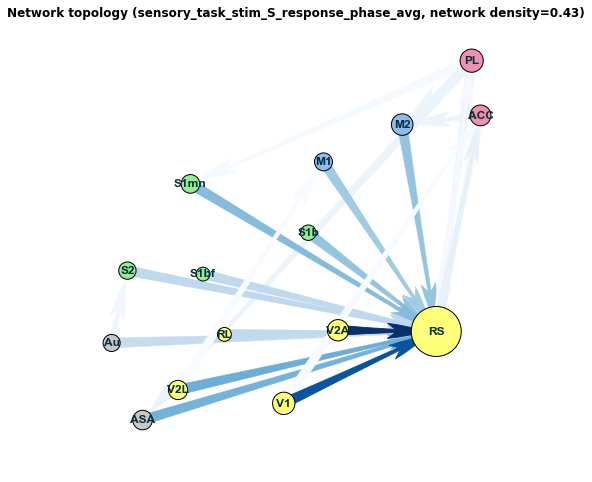

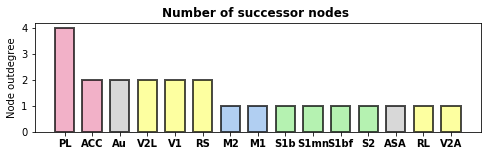

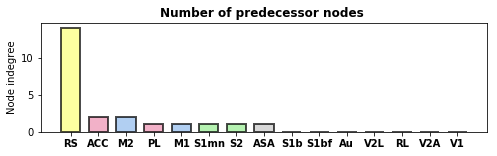

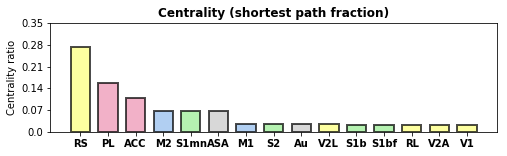

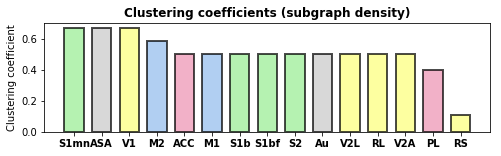

1/15 nodes were larger than max node size.
0.4285104676247564 [0.01106373 0.00977783 0.01153267 0.01149624 0.01141283 0.01000125
 0.02390059 0.02259356 0.02386995 0.02512348 0.01904473 0.01917488
 0.01078638 0.01837871 0.02662334 0.00955789 0.02731771 0.01911932
 0.04546369 0.00942456 0.04059414 0.00993223 0.01232074]
0/15 nodes were larger than max node size.
0.24348992747211362 [0.01462255 0.00740204 0.00774451 0.00963184 0.00913175 0.0074529
 0.00717145 0.00765371 0.00703364 0.00701119 0.00785925 0.00603749
 0.01601519 0.0143797  0.00717905 0.01231198 0.0498047  0.00615049
 0.00850437 0.0063888  0.00658541 0.01116246 0.00625544]


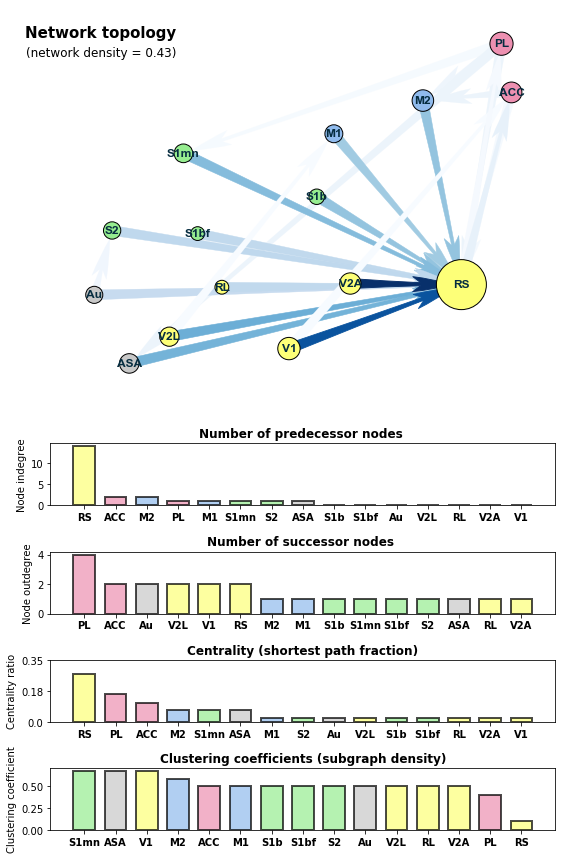

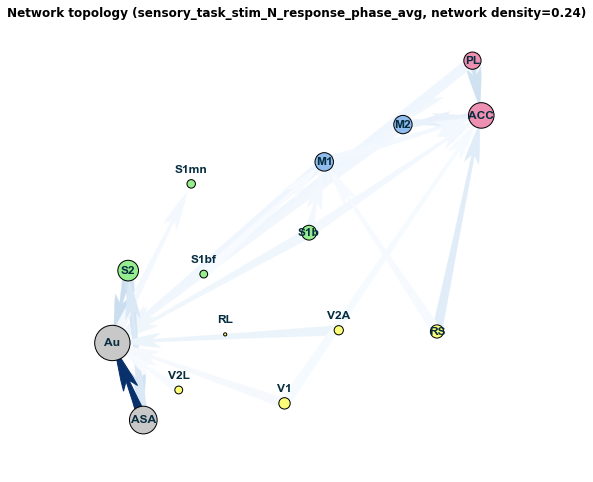

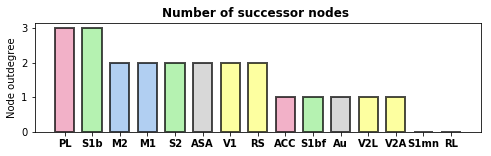

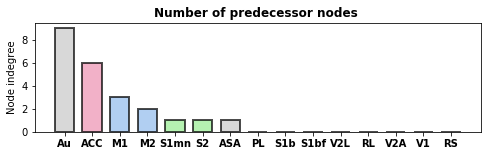

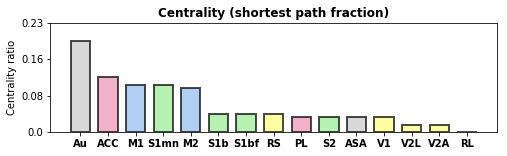

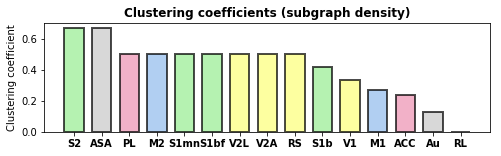

0/15 nodes were larger than max node size.
0.24348992747211362 [0.01462255 0.00740204 0.00774451 0.00963184 0.00913175 0.0074529
 0.00717145 0.00765371 0.00703364 0.00701119 0.00785925 0.00603749
 0.01601519 0.0143797  0.00717905 0.01231198 0.0498047  0.00615049
 0.00850437 0.0063888  0.00658541 0.01116246 0.00625544]
1/15 nodes were larger than max node size.
0.6012774228120343 [0.01231357 0.01610394 0.01106843 0.01282558 0.02542313 0.02511481
 0.02690248 0.0262557  0.0228949  0.0208914  0.01236488 0.01630187
 0.02276653 0.02381989 0.04303996 0.06855476 0.03108882 0.01376831
 0.03155525 0.02548711 0.05396109 0.01170287 0.04707216]


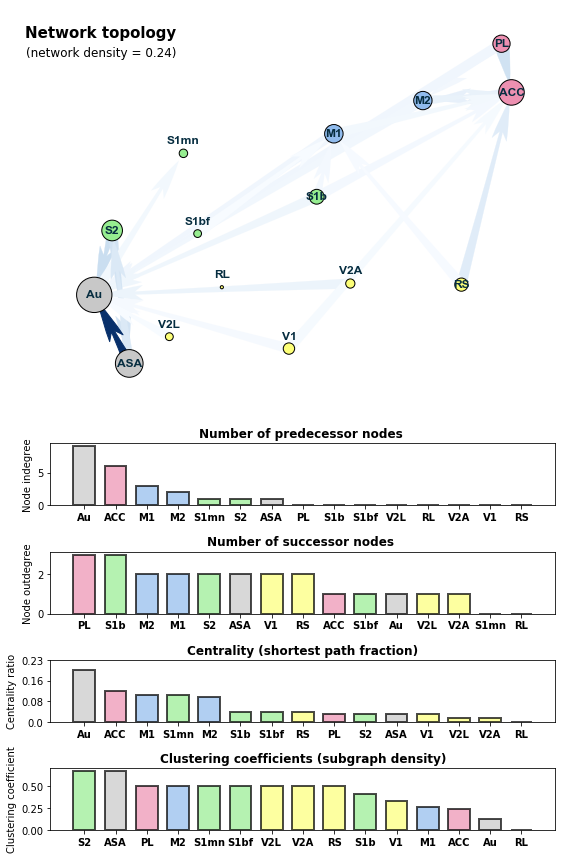

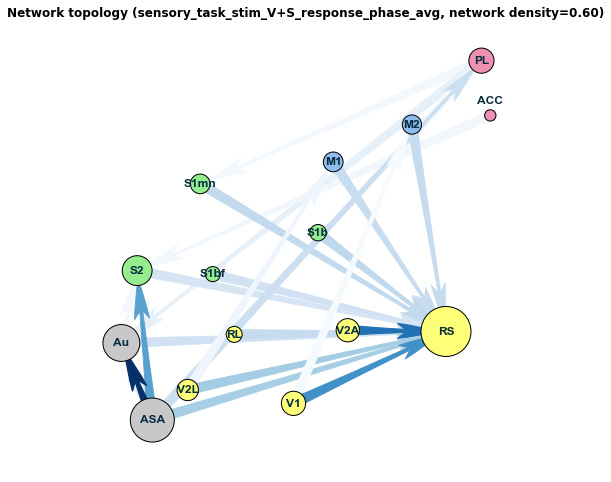

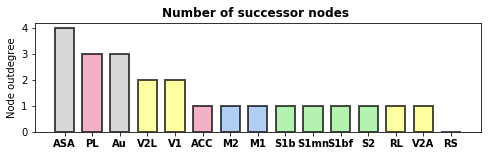

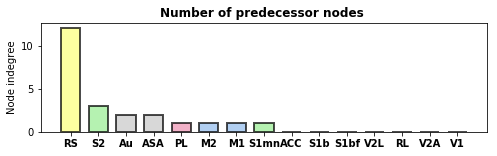

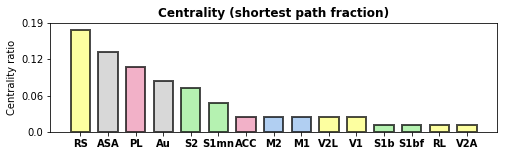

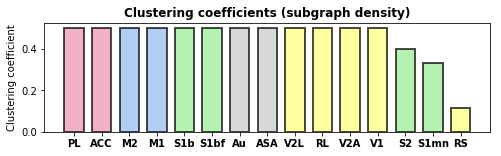

1/15 nodes were larger than max node size.
0.6012774228120343 [0.01231357 0.01610394 0.01106843 0.01282558 0.02542313 0.02511481
 0.02690248 0.0262557  0.0228949  0.0208914  0.01236488 0.01630187
 0.02276653 0.02381989 0.04303996 0.06855476 0.03108882 0.01376831
 0.03155525 0.02548711 0.05396109 0.01170287 0.04707216]
1/15 nodes were larger than max node size.
0.8226078404889936 [0.01674433 0.02415217 0.02264603 0.04200527 0.03786315 0.04626309
 0.04521422 0.01686684 0.0440258  0.03550128 0.03432336 0.01671494
 0.0215     0.02548207 0.04877674 0.01903779 0.05357561 0.04821377
 0.01914207 0.08683646 0.02051171 0.017455   0.07975612]


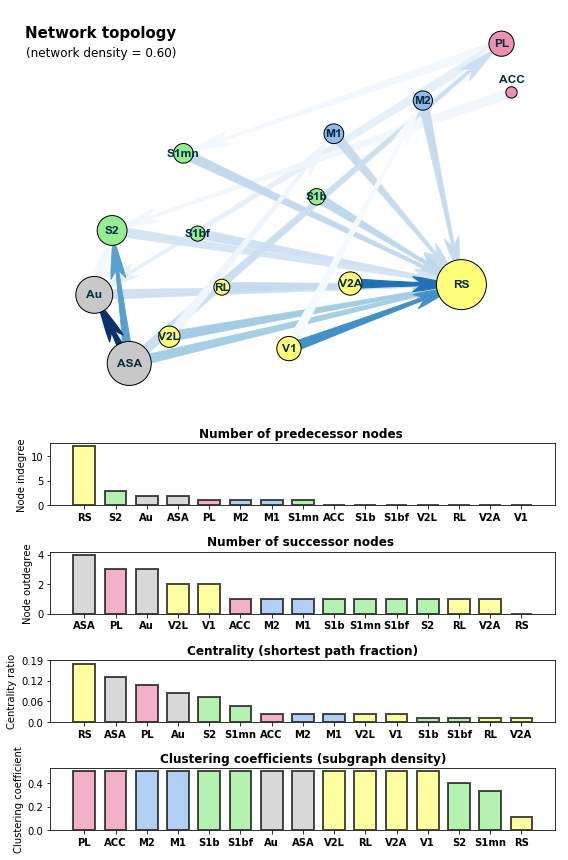

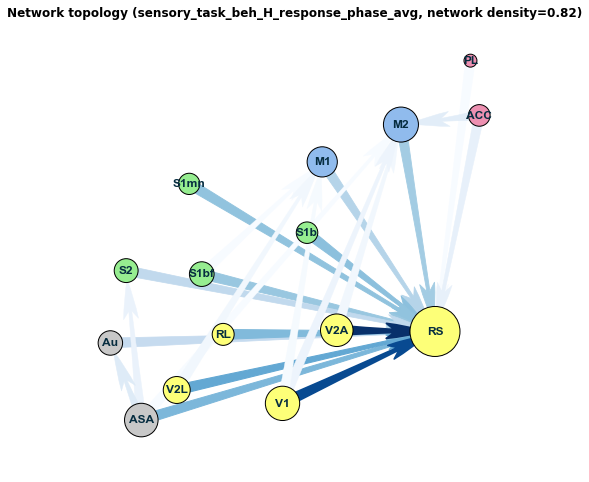

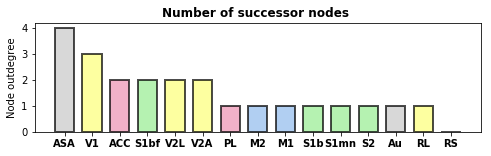

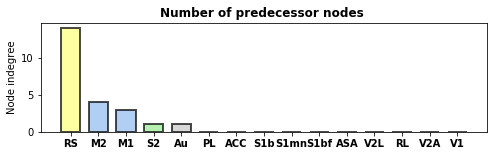

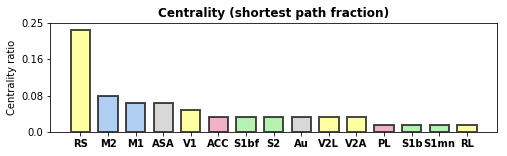

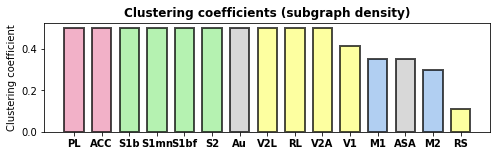

1/15 nodes were larger than max node size.
0.8226078404889936 [0.01674433 0.02415217 0.02264603 0.04200527 0.03786315 0.04626309
 0.04521422 0.01686684 0.0440258  0.03550128 0.03432336 0.01671494
 0.0215     0.02548207 0.04877674 0.01903779 0.05357561 0.04821377
 0.01914207 0.08683646 0.02051171 0.017455   0.07975612]
0/15 nodes were larger than max node size.
0.3398560985929633 [0.00964769 0.01295859 0.00884667 0.0101775  0.00954155 0.0095382
 0.01030308 0.01050892 0.01070637 0.00866503 0.01006952 0.01844433
 0.01163757 0.02782717 0.0897868  0.01009568 0.01093819 0.01172811
 0.00925187 0.00982567 0.01095631 0.00889925 0.00950205]


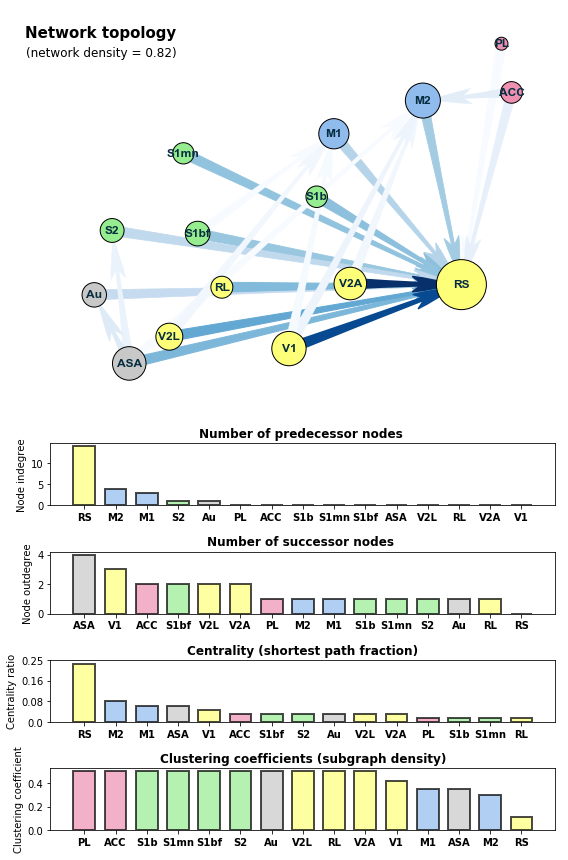

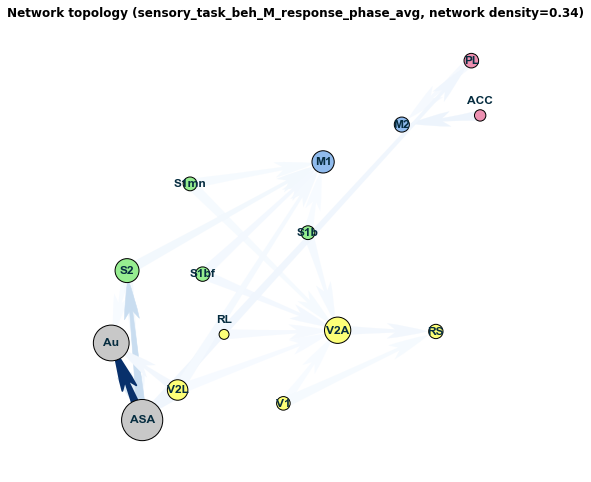

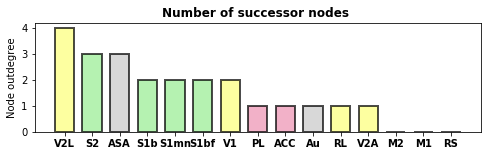

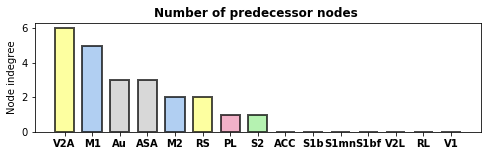

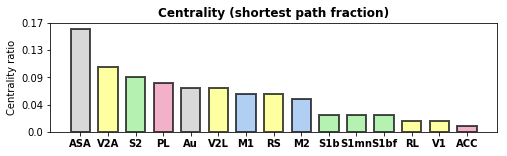

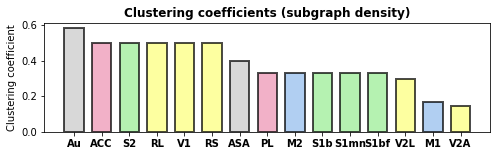

0/15 nodes were larger than max node size.
0.3398560985929633 [0.00964769 0.01295859 0.00884667 0.0101775  0.00954155 0.0095382
 0.01030308 0.01050892 0.01070637 0.00866503 0.01006952 0.01844433
 0.01163757 0.02782717 0.0897868  0.01009568 0.01093819 0.01172811
 0.00925187 0.00982567 0.01095631 0.00889925 0.00950205]
3/15 nodes were larger than max node size.
0.8431337729147526 [0.02101797 0.02172291 0.03059861 0.02395663 0.03218901 0.02045964
 0.02798383 0.02422757 0.03313935 0.02262697 0.05171886 0.06693151
 0.16250835 0.03006168 0.0280179  0.02333655 0.02629622 0.02405179
 0.04793349 0.02213921 0.04155912 0.02902421 0.03163238]


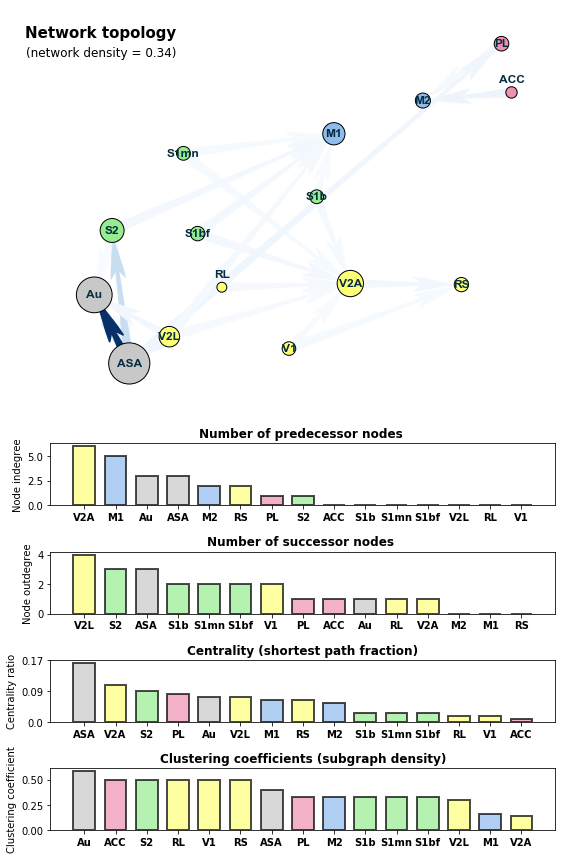

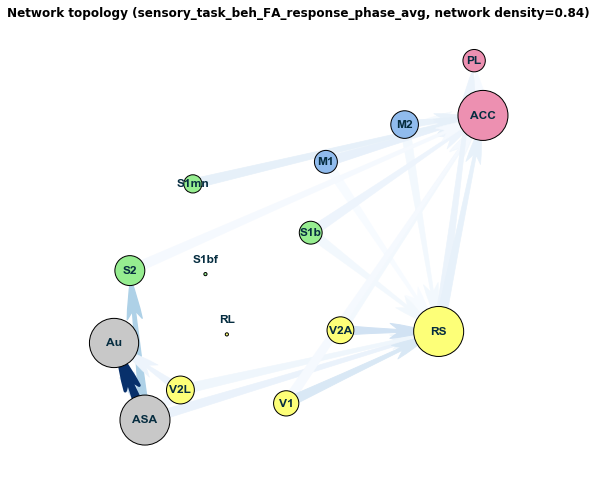

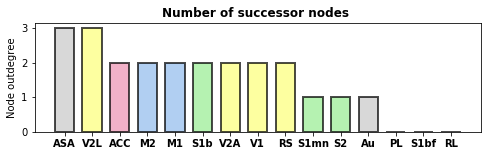

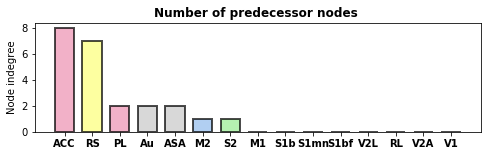

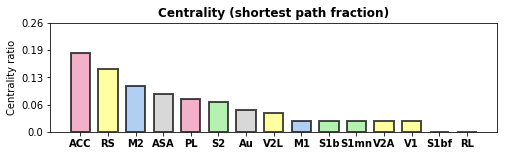

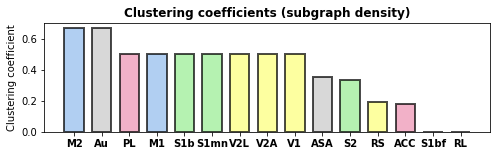

3/15 nodes were larger than max node size.
0.8431337729147526 [0.02101797 0.02172291 0.03059861 0.02395663 0.03218901 0.02045964
 0.02798383 0.02422757 0.03313935 0.02262697 0.05171886 0.06693151
 0.16250835 0.03006168 0.0280179  0.02333655 0.02629622 0.02405179
 0.04793349 0.02213921 0.04155912 0.02902421 0.03163238]
0/15 nodes were larger than max node size.
0.3724927618471341 [0.00880322 0.01221619 0.00887929 0.01318999 0.00861776 0.00691841
 0.00698061 0.00663729 0.00612022 0.00618201 0.0065245  0.01107424
 0.00912168 0.00853828 0.01703894 0.01480296 0.04808441 0.12145339
 0.00599251 0.01478446 0.01300291 0.00633408 0.01119542]


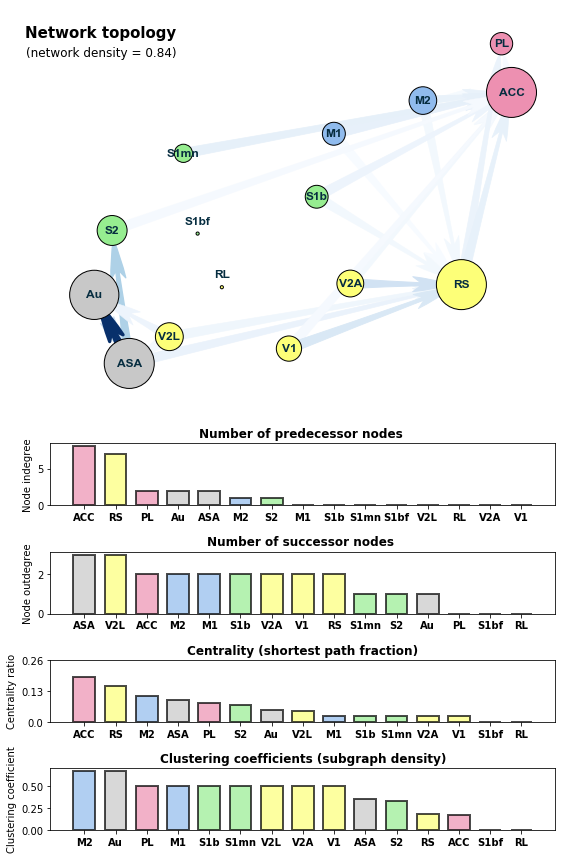

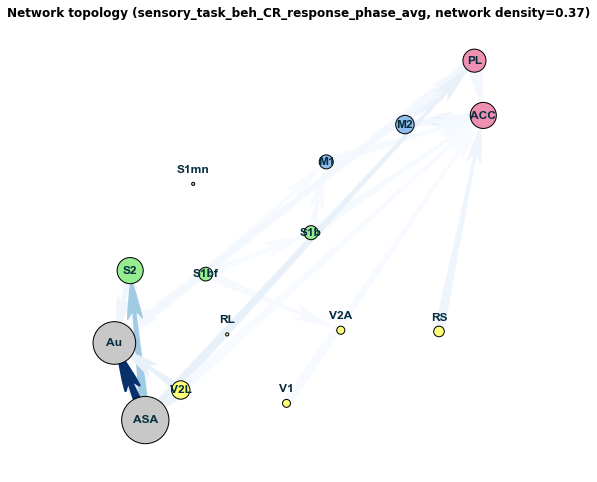

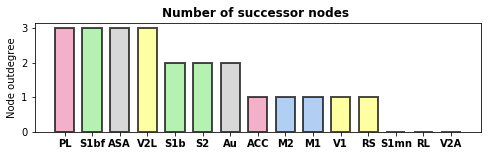

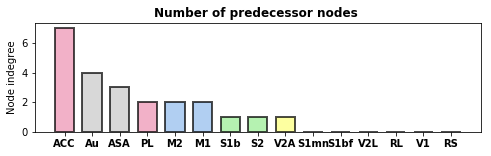

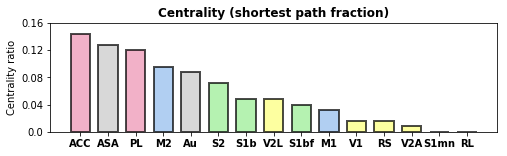

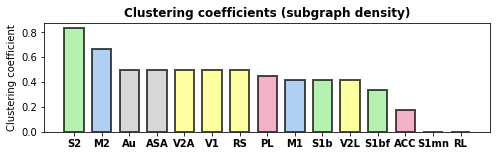

0/15 nodes were larger than max node size.
0.3724927618471341 [0.00880322 0.01221619 0.00887929 0.01318999 0.00861776 0.00691841
 0.00698061 0.00663729 0.00612022 0.00618201 0.0065245  0.01107424
 0.00912168 0.00853828 0.01703894 0.01480296 0.04808441 0.12145339
 0.00599251 0.01478446 0.01300291 0.00633408 0.01119542]
1/15 nodes were larger than max node size.
0.5736743790775445 [0.02643003 0.02817092 0.01586353 0.0313879  0.0146142  0.02693278
 0.02374594 0.02161649 0.02198999 0.01540761 0.02375129 0.03546514
 0.03098886 0.01580987 0.01883261 0.03180429 0.02547849 0.01690942
 0.05168381 0.01655651 0.01636024 0.04772663 0.01614784]


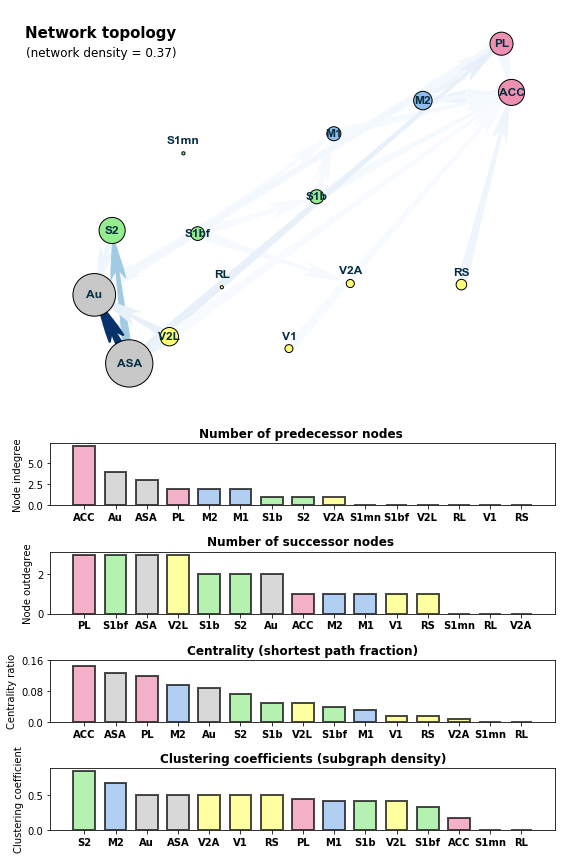

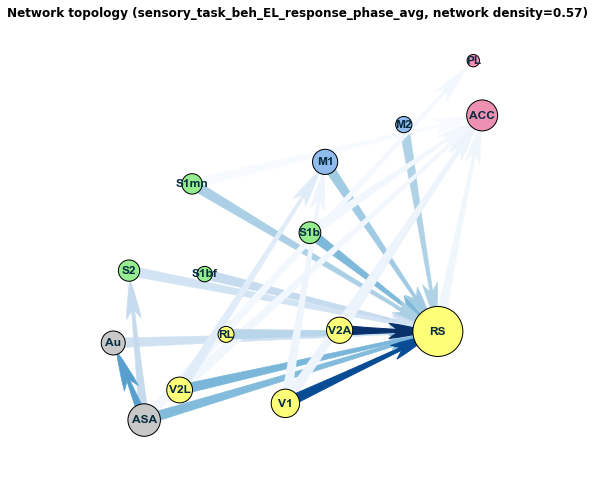

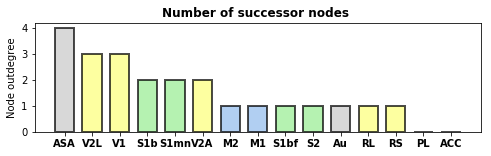

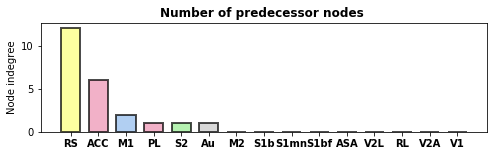

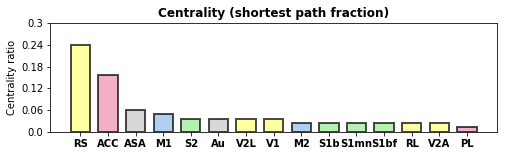

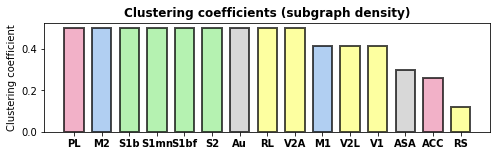

1/15 nodes were larger than max node size.
0.5736743790775445 [0.02643003 0.02817092 0.01586353 0.0313879  0.0146142  0.02693278
 0.02374594 0.02161649 0.02198999 0.01540761 0.02375129 0.03546514
 0.03098886 0.01580987 0.01883261 0.03180429 0.02547849 0.01690942
 0.05168381 0.01655651 0.01636024 0.04772663 0.01614784]
0/15 nodes were larger than max node size.
0.33726340965488655 [0.01221535 0.00946748 0.01246289 0.00765388 0.01231812 0.00944176
 0.00776849 0.01108992 0.00769247 0.01184932 0.01055049 0.00811552
 0.01328964 0.007385   0.01672213 0.02927653 0.07930025 0.01549325
 0.01327276 0.01050398 0.01187311 0.00985448 0.00966659]


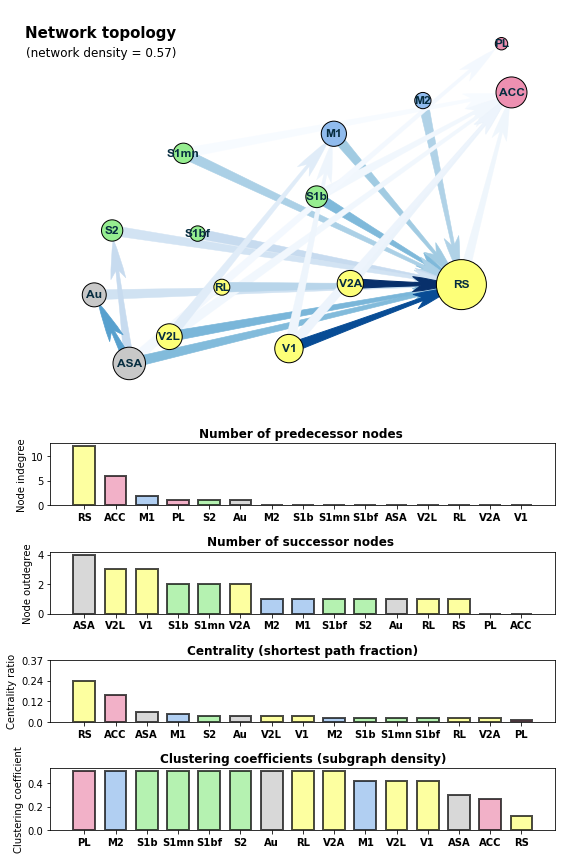

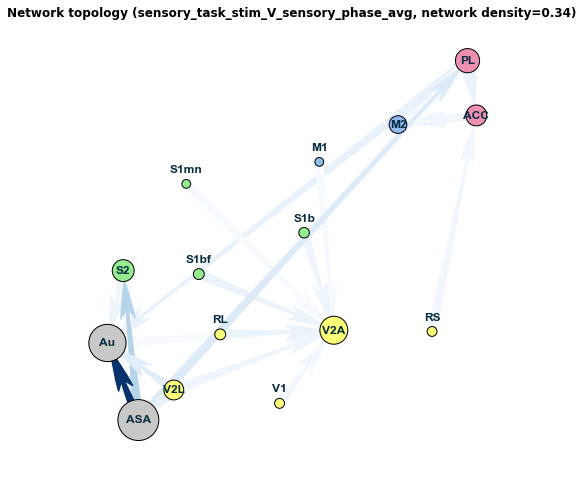

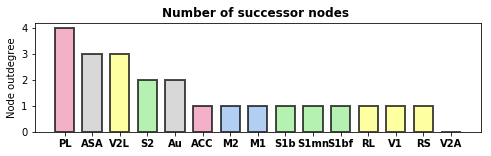

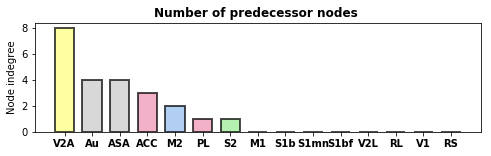

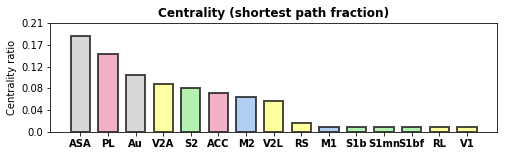

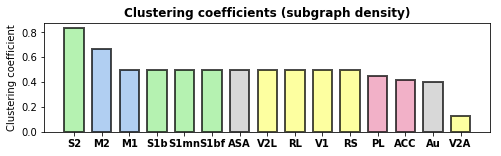

0/15 nodes were larger than max node size.
0.33726340965488655 [0.01221535 0.00946748 0.01246289 0.00765388 0.01231812 0.00944176
 0.00776849 0.01108992 0.00769247 0.01184932 0.01055049 0.00811552
 0.01328964 0.007385   0.01672213 0.02927653 0.07930025 0.01549325
 0.01327276 0.01050398 0.01187311 0.00985448 0.00966659]
0/15 nodes were larger than max node size.
0.34584001522847574 [0.01295911 0.01424635 0.01383252 0.01419917 0.01479667 0.01247321
 0.01572937 0.01223547 0.02179206 0.01217549 0.01740915 0.01328881
 0.02090293 0.01174377 0.01309355 0.01941242 0.01912544 0.01161436
 0.01241083 0.012832   0.01300346 0.02042873 0.01613514]


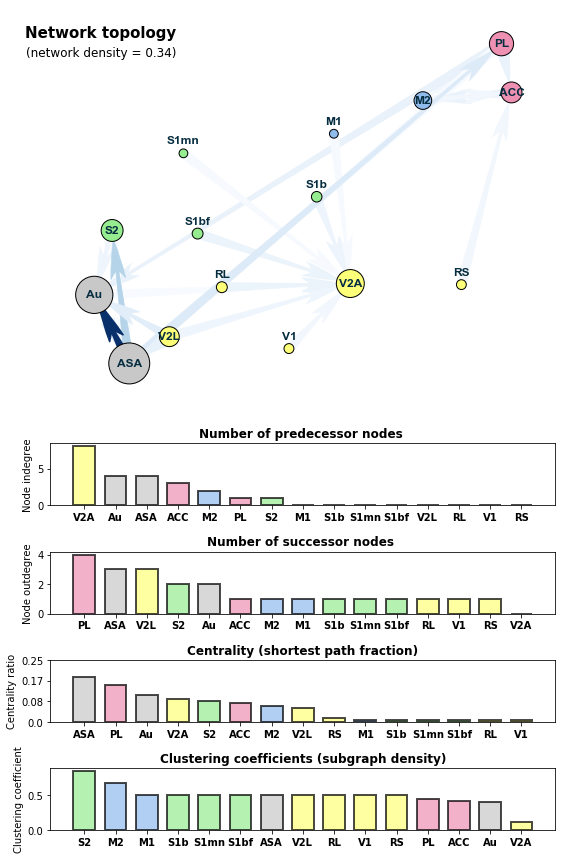

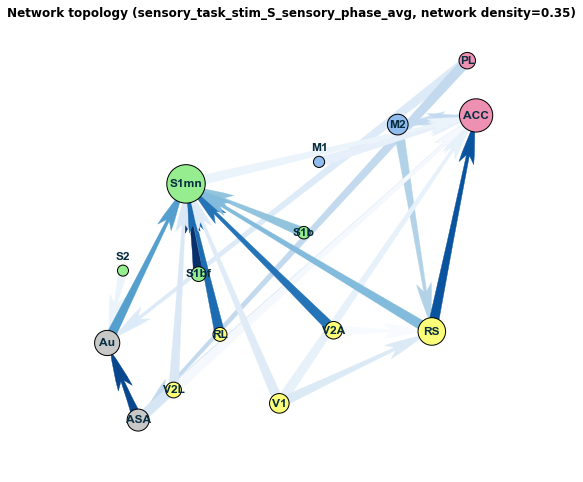

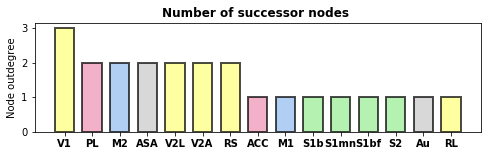

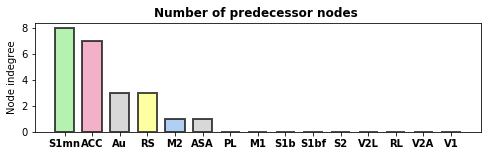

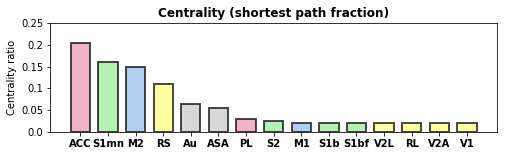

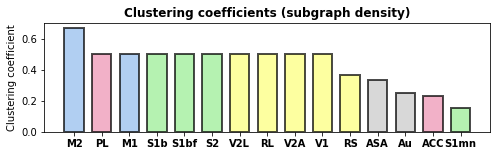

0/15 nodes were larger than max node size.
0.34584001522847574 [0.01295911 0.01424635 0.01383252 0.01419917 0.01479667 0.01247321
 0.01572937 0.01223547 0.02179206 0.01217549 0.01740915 0.01328881
 0.02090293 0.01174377 0.01309355 0.01941242 0.01912544 0.01161436
 0.01241083 0.012832   0.01300346 0.02042873 0.01613514]
0/15 nodes were larger than max node size.
0.30231864795443597 [0.02244589 0.0131397  0.01358711 0.01015352 0.01087491 0.00924856
 0.01368276 0.00901392 0.00935316 0.01286432 0.0084632  0.01069892
 0.00891835 0.01017404 0.00886824 0.01169203 0.05319279 0.0096594
 0.01173611 0.00821191 0.00963488 0.00980815 0.01689679]


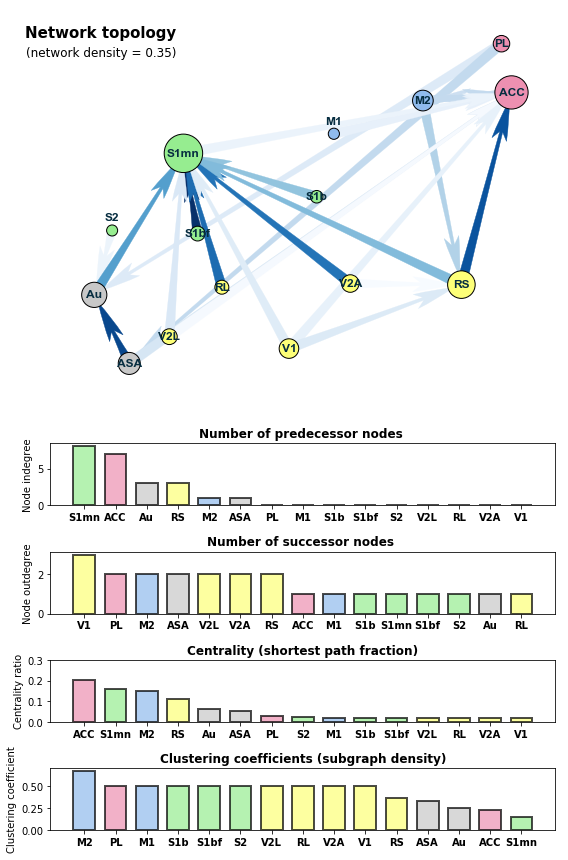

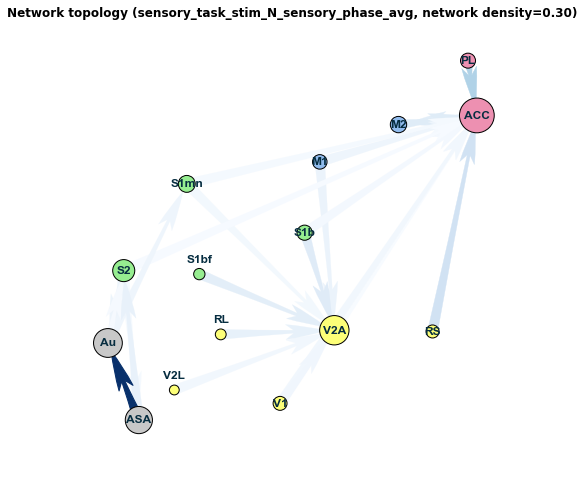

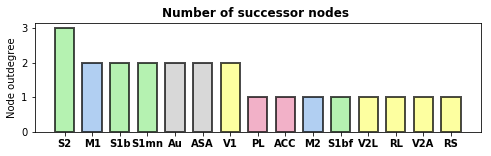

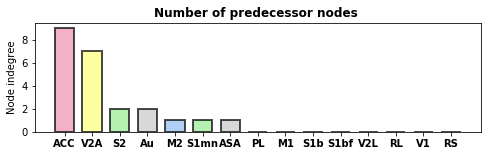

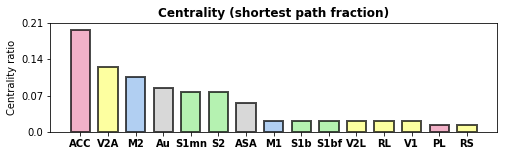

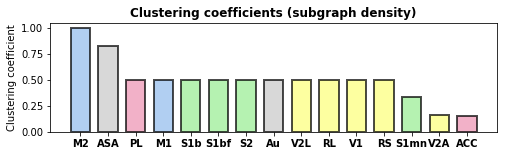

0/15 nodes were larger than max node size.
0.30231864795443597 [0.02244589 0.0131397  0.01358711 0.01015352 0.01087491 0.00924856
 0.01368276 0.00901392 0.00935316 0.01286432 0.0084632  0.01069892
 0.00891835 0.01017404 0.00886824 0.01169203 0.05319279 0.0096594
 0.01173611 0.00821191 0.00963488 0.00980815 0.01689679]
0/15 nodes were larger than max node size.
0.37267739791446486 [0.01142218 0.02525286 0.02076524 0.01458769 0.0159623  0.01140827
 0.01052681 0.01367754 0.01178988 0.01750593 0.01066188 0.02533983
 0.0121749  0.04096714 0.01394788 0.01071758 0.01604091 0.0186431
 0.01173481 0.01309522 0.01222131 0.01813989 0.01609427]


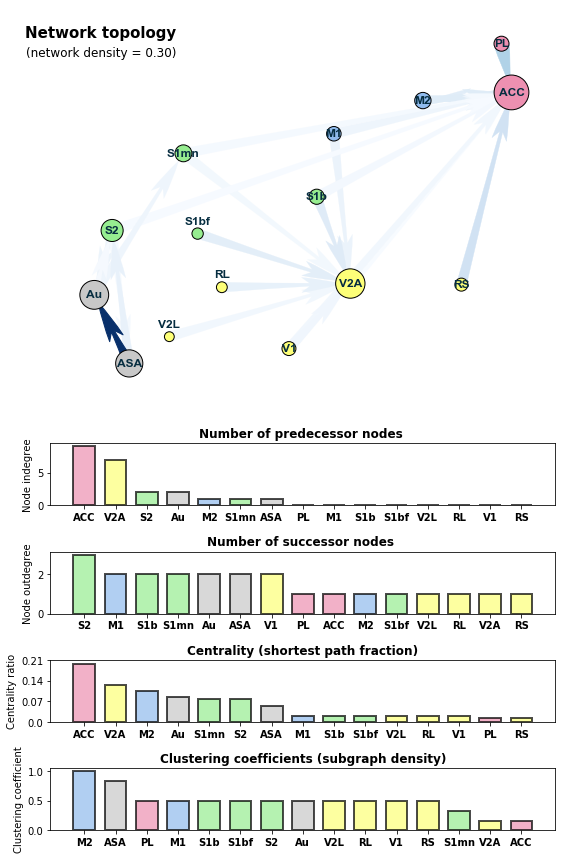

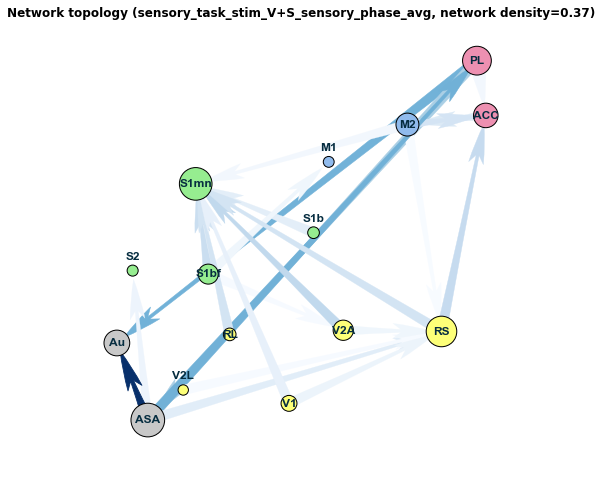

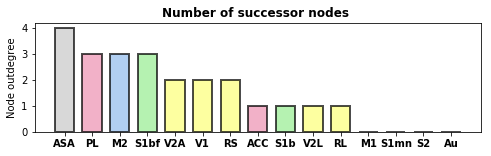

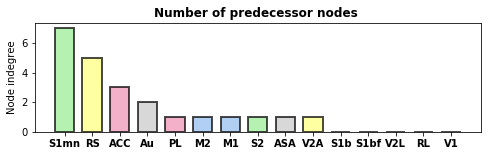

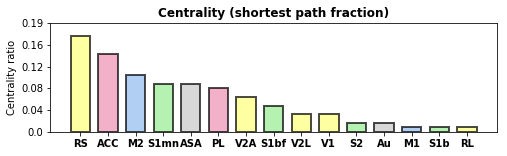

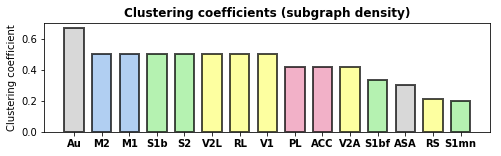

0/15 nodes were larger than max node size.
0.37267739791446486 [0.01142218 0.02525286 0.02076524 0.01458769 0.0159623  0.01140827
 0.01052681 0.01367754 0.01178988 0.01750593 0.01066188 0.02533983
 0.0121749  0.04096714 0.01394788 0.01071758 0.01604091 0.0186431
 0.01173481 0.01309522 0.01222131 0.01813989 0.01609427]
0/15 nodes were larger than max node size.
0.3381191325539379 [0.01523895 0.0166264  0.01261791 0.01235099 0.01186792 0.01597765
 0.01445355 0.01286956 0.01467643 0.01665568 0.01146832 0.01192333
 0.01651388 0.03814603 0.01394025 0.0123841  0.01161643 0.01416113
 0.01473357 0.01350221 0.0114488  0.01314917 0.0117969 ]


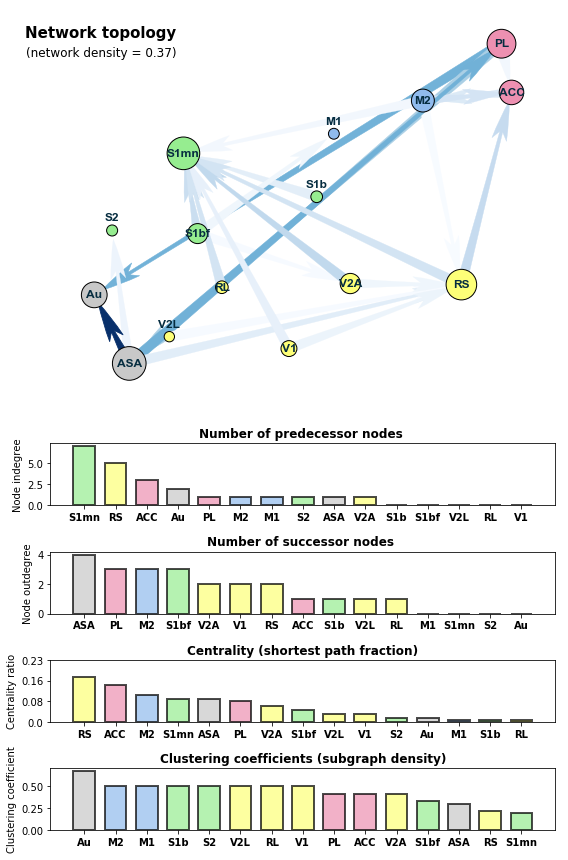

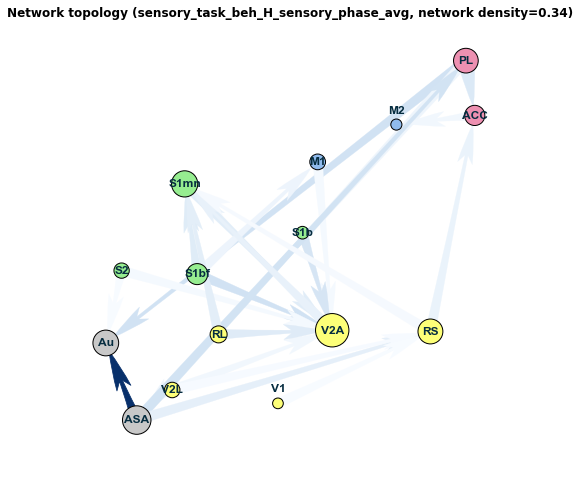

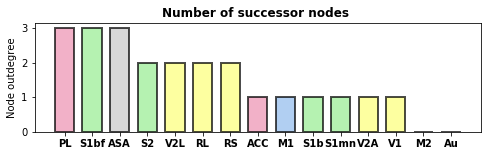

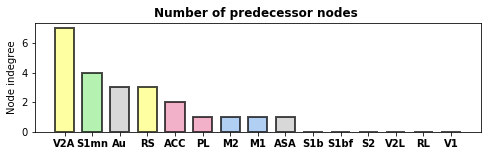

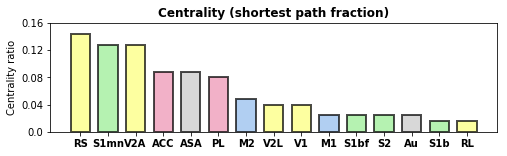

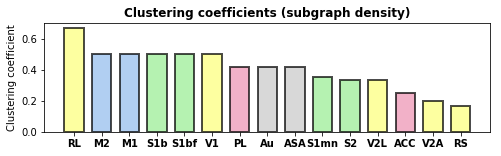

0/15 nodes were larger than max node size.
0.3381191325539379 [0.01523895 0.0166264  0.01261791 0.01235099 0.01186792 0.01597765
 0.01445355 0.01286956 0.01467643 0.01665568 0.01146832 0.01192333
 0.01651388 0.03814603 0.01394025 0.0123841  0.01161643 0.01416113
 0.01473357 0.01350221 0.0114488  0.01314917 0.0117969 ]
0/15 nodes were larger than max node size.
0.31477758489376395 [0.01277138 0.00993037 0.01151842 0.00949351 0.01246552 0.00982509
 0.01071455 0.0096354  0.01241525 0.01177271 0.01027143 0.0113912
 0.01016385 0.00965864 0.02187565 0.0659377  0.01013917 0.01074816
 0.00937428 0.01117694 0.01095298 0.00991422 0.01263115]


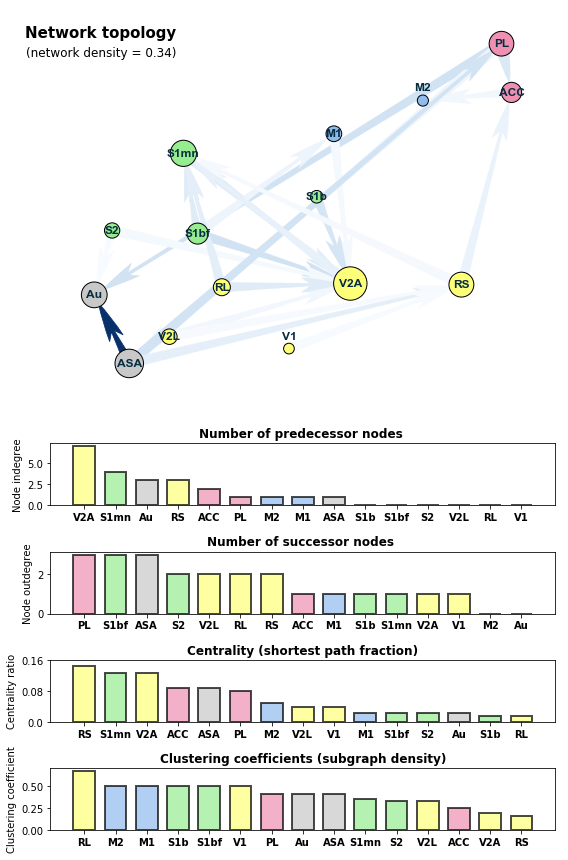

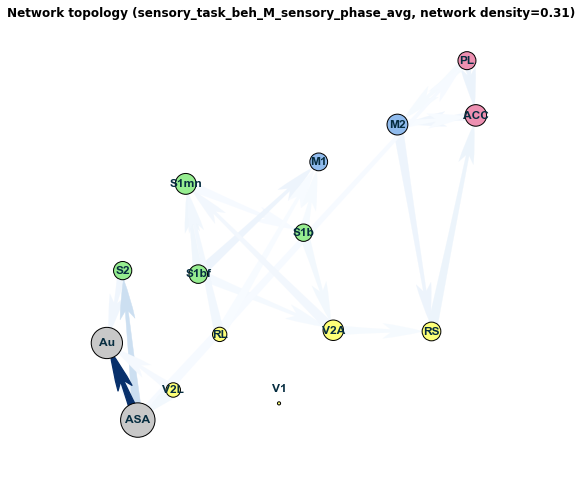

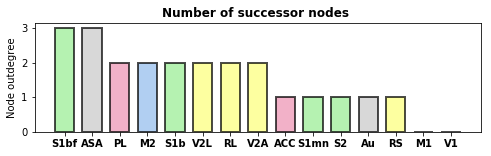

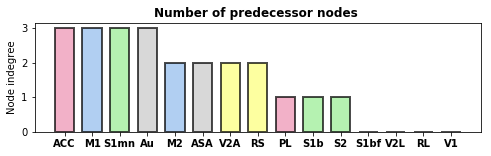

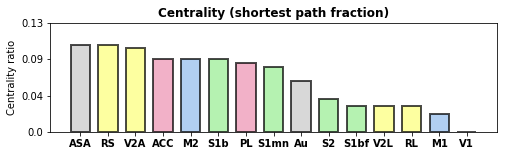

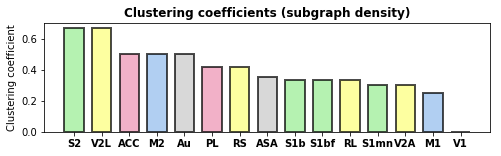

0/15 nodes were larger than max node size.
0.31477758489376395 [0.01277138 0.00993037 0.01151842 0.00949351 0.01246552 0.00982509
 0.01071455 0.0096354  0.01241525 0.01177271 0.01027143 0.0113912
 0.01016385 0.00965864 0.02187565 0.0659377  0.01013917 0.01074816
 0.00937428 0.01117694 0.01095298 0.00991422 0.01263115]
0/15 nodes were larger than max node size.
0.6860108195493564 [0.03069727 0.04810676 0.02046507 0.03707132 0.03892581 0.01813313
 0.02866648 0.01833006 0.0187504  0.01852259 0.0175516  0.02069509
 0.03144691 0.02471355 0.04621233 0.03872782 0.12700749 0.01578034
 0.01856405 0.01556086 0.01558269 0.02094082 0.01555838]


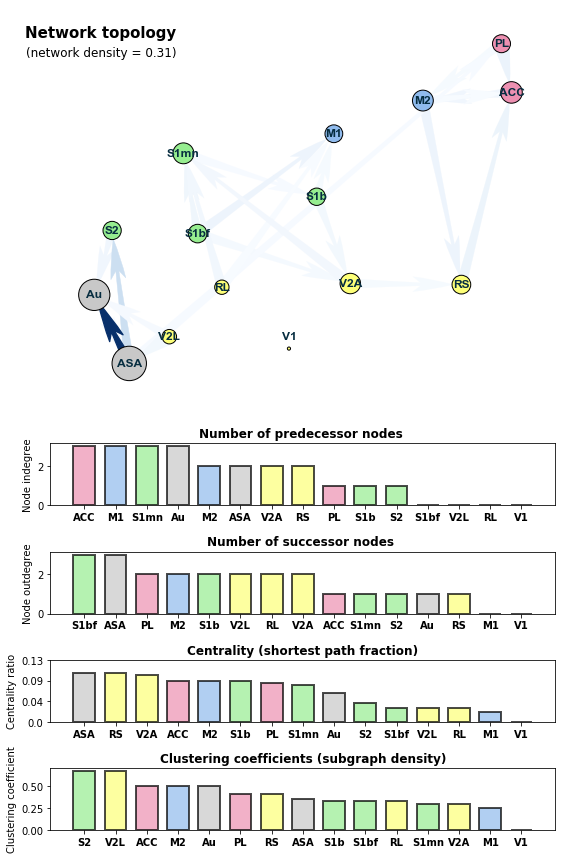

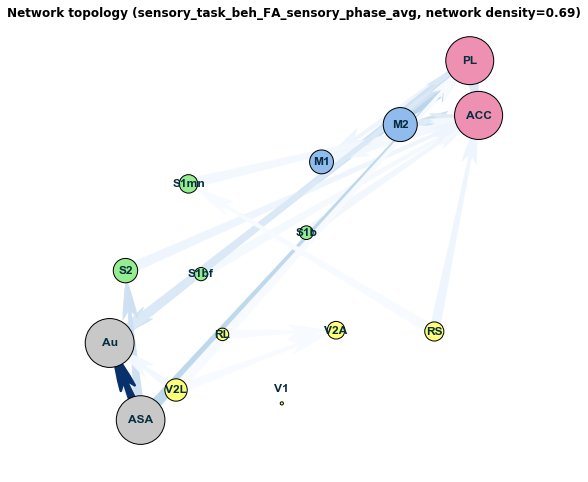

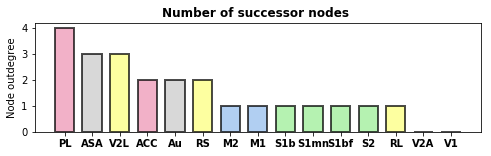

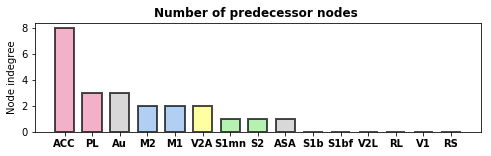

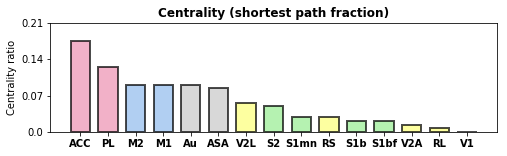

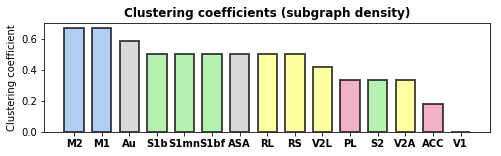

0/15 nodes were larger than max node size.
0.6860108195493564 [0.03069727 0.04810676 0.02046507 0.03707132 0.03892581 0.01813313
 0.02866648 0.01833006 0.0187504  0.01852259 0.0175516  0.02069509
 0.03144691 0.02471355 0.04621233 0.03872782 0.12700749 0.01578034
 0.01856405 0.01556086 0.01558269 0.02094082 0.01555838]
0/15 nodes were larger than max node size.
0.31353674157513334 [0.01519659 0.01165384 0.0089291  0.01271527 0.00828446 0.01063441
 0.01375762 0.00941015 0.01316316 0.01078967 0.0089248  0.00766115
 0.00746007 0.01062409 0.023591   0.07103071 0.00908371 0.00793754
 0.01112009 0.01293436 0.01183194 0.00928963 0.00751338]


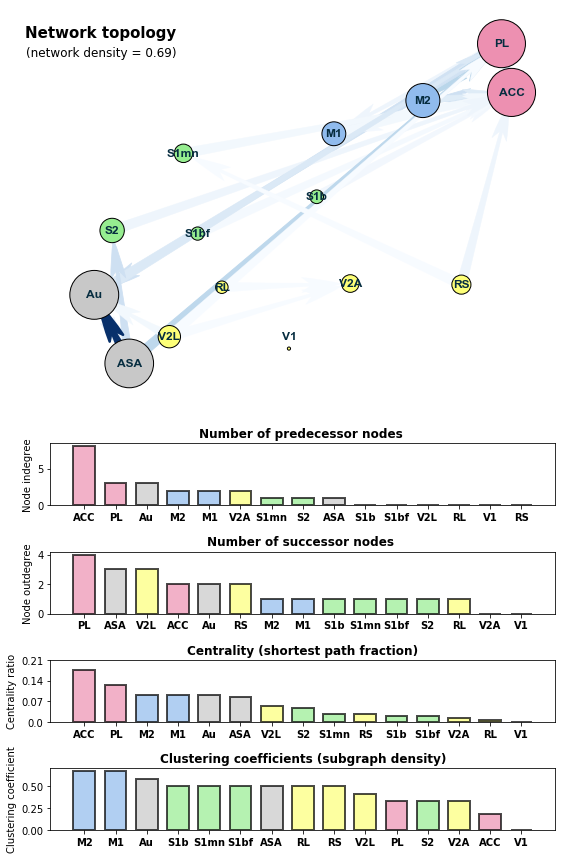

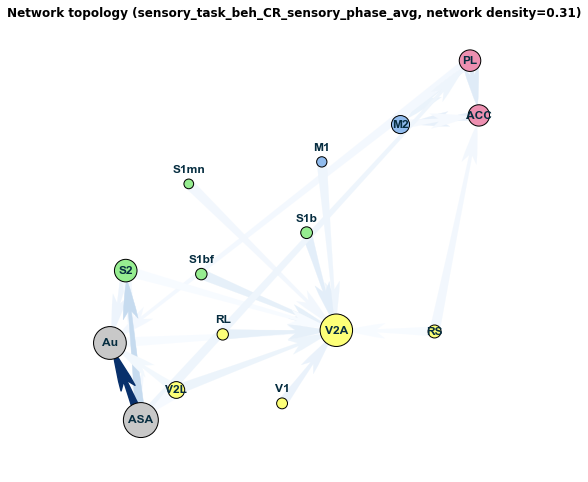

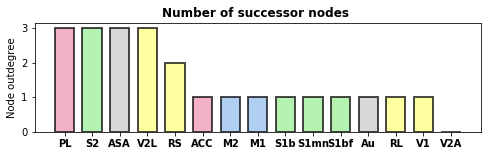

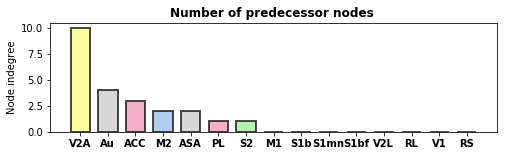

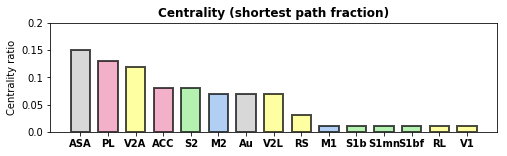

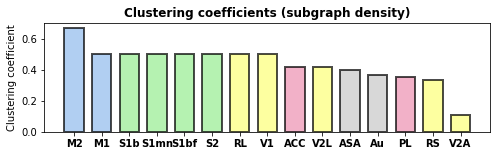

0/15 nodes were larger than max node size.
0.31353674157513334 [0.01519659 0.01165384 0.0089291  0.01271527 0.00828446 0.01063441
 0.01375762 0.00941015 0.01316316 0.01078967 0.0089248  0.00766115
 0.00746007 0.01062409 0.023591   0.07103071 0.00908371 0.00793754
 0.01112009 0.01293436 0.01183194 0.00928963 0.00751338]
0/15 nodes were larger than max node size.
0.4809899904413606 [0.01970514 0.01610362 0.01558632 0.01998811 0.02027677 0.01816711
 0.02693715 0.01862314 0.01637171 0.02084847 0.02740588 0.01517074
 0.0184182  0.01768371 0.01553576 0.02118124 0.02268951 0.02678691
 0.02656182 0.0185495  0.0283659  0.02580941 0.02422388]


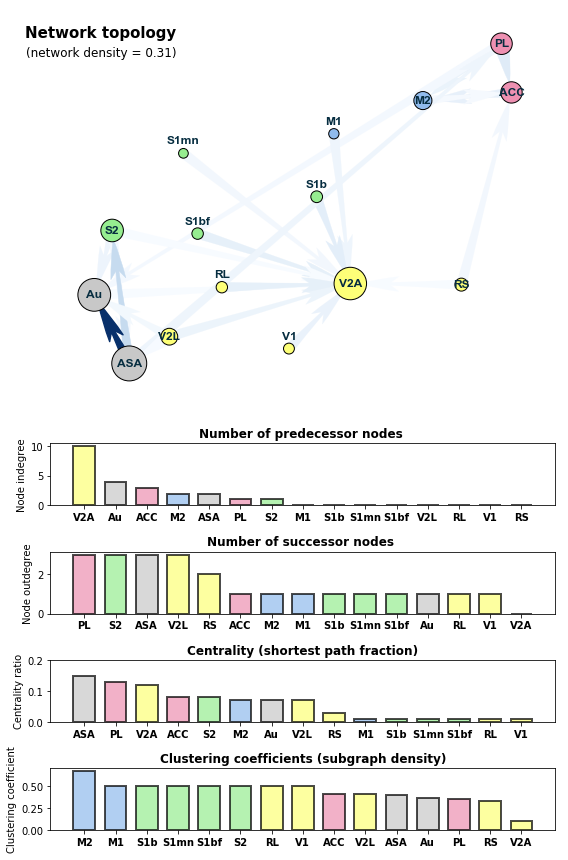

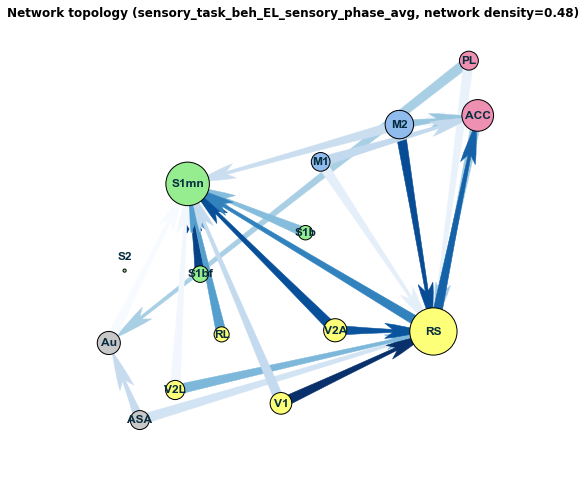

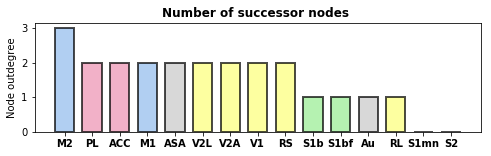

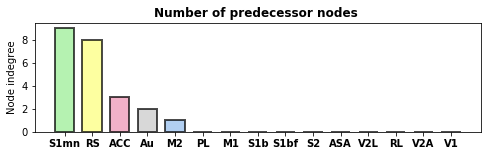

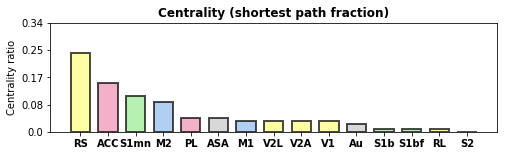

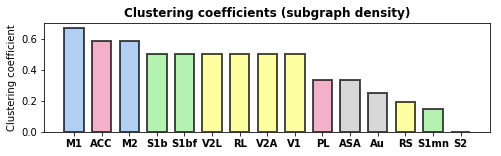

0/15 nodes were larger than max node size.
0.4809899904413606 [0.01970514 0.01610362 0.01558632 0.01998811 0.02027677 0.01816711
 0.02693715 0.01862314 0.01637171 0.02084847 0.02740588 0.01517074
 0.0184182  0.01768371 0.01553576 0.02118124 0.02268951 0.02678691
 0.02656182 0.0185495  0.0283659  0.02580941 0.02422388]


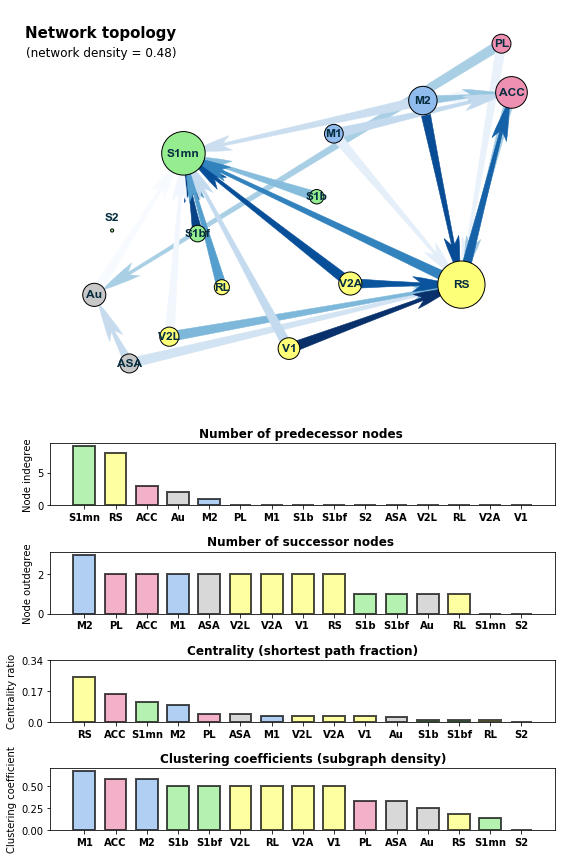

In [13]:
# Again specify parameter

plot_params = {
    'figsize': (8,8),
    'bar_figsize': (8, 2),
    'edge_scaler' : 20,
    'default_edge_width' : 5.0,
    'default_node_size' : 50000,
    'min_node_size' : 10,
    'max_node_size': 2500,
    'thresh_to_move_node_label' : 150,
    'move_node_label' : -8,
    'node_percentile': 90,
    'node_color': 'red',
    'edge_color': 'black',
    'label_font_size': 12,
    'label_font_color':'#062D40',
    'label_font_type': 'arial',
    'label_font_weight':'bold',
    'x_label_font_weight': 'bold',
    'y_label_font_weight': 'normal',
    'title_font_weight': 'bold',
    'title_font_size': 15,
    'cmap': cmap,
    'network_arrow_style': ArrowStyle.Fancy(head_length=4, head_width=1.5, tail_width=1),
    'edge_color_map': plt.cm.Blues,
    'theta': 2e-4
}

root = '/Users/jannisborn/Desktop/HIFO/gc_results/{}/{}_{}_{}_{}'
root_sp = '/Users/jannisborn/Desktop/HIFO/gc_results/averages/{}_{}_{}_{}_{}'
directed = True


# All these mice here are used for averaging. 
# Make sure the mouse specific analysis was done beforehand!
mice = ["1113rr", "1110r", "5212r", "5627rr"]
tasks = ["visual_task", "sensory_task"]
stim = ["V", "S", "N", "V+S"]
behs = ["H", "M", "FA", "CR", "EL"]
phases = ["response_phase", "sensory_phase"]
modes = ['avg']


for task in tasks:
    for phase in phases:

        # Stim data first 
        for s in stim:
            for mode in modes:
                
                if mode == 'avg':
                    avg_data = []
                    for mouse in mice:
                        p  = root.format(mouse, task, "stim", s, phase)
                        try:
                            data = scipy.io.loadmat(p+'/data.mat')
                        except TypeError:
                            continue
                        d = np.nan_to_num(data['results']['F'][0][0])
                        theta = plot_params.get('theta', 2e-4)
                        d[d<theta]=0
                        avg_data.append(d)
                    avg_data = np.mean(np.stack(avg_data, axis=2), axis=2)
                    theta_all = np.percentile(avg_data,plot_params.get('node_percentile', 95))
                    avg_data[avg_data<theta_all] = 0


                # deprecated
                """
                elif mode == 'union':
                    avg_data, mask = [], np.ones((15,15))
                    for mouse in mice:
                        p  = root.format(mouse, task, "stim", s, phase)
                        try:
                            data = scipy.io.loadmat(p+'/data.mat')
                        except TypeError:
                            continue
                        d = np.nan_to_num(data['results']['F'][0][0])
                        theta = plot_params.get('theta', 2e-4)
                        m = d>theta
                        mask *= m 
                        avg_data.append(d)
                    avg_data = np.mean(np.stack(avg_data, axis=2), axis=2)
                    avg_data = avg_data*mask
                """    




                sp = root_sp.format(task, "stim", s, phase, mode)
                os.makedirs(sp, exist_ok=True)  
                np.save(sp+'/data.npy', avg_data)
                
                plot_params.update({'save_path':sp})


                G = (
                    nx.from_numpy_matrix(avg_data, create_using=nx.DiGraph())
                    if directed else
                    nx.from_numpy_matrix(avg_data, create_using=nx.Graph())
                )
                plot_network_topology(G, brain_reg, brain_pos, plot_params)
                plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params)
                plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params)
                plot_node_centrality(G, brain_reg, plot_p=plot_params)
                plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params)


                # PLOT ALL
                plot_params['save_plot']=False
                fig = plt.figure(figsize=(8, 12))

                ax0 = plt.subplot2grid((8, 1), (0, 0), rowspan=4)
                plot_network_topology(G, brain_reg, brain_pos, plot_params, ax=ax0)

                ax1 = plt.subplot2grid((8, 1), (4, 0))
                plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params, ax=ax1)

                ax2 = plt.subplot2grid((8, 1), (5, 0))
                plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params, ax=ax2)

                ax3 = plt.subplot2grid((8, 1), (6, 0))
                plot_node_centrality(G, brain_reg, plot_p=plot_params, ax=ax3)

                ax4 = plt.subplot2grid((8, 1), (7, 0))
                plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params,ax=ax4)
                fig.tight_layout()
                fig.savefig(plot_params['save_path']+'/overview.eps')

                plot_params['save_plot']=True

     
    
    
        # Beh data second 
        for b in behs:
            for mode in modes:

                if mode == 'avg':
                    avg_data = []
                    for mouse in mice:
                        p  = root.format(mouse, task, "beh", b, phase)
                        try:
                            data = scipy.io.loadmat(p+'/data.mat')
                        except TypeError:
                            continue
                        d = np.nan_to_num(data['results']['F'][0][0])
                        theta = plot_params.get('theta', 2e-4)
                        d[d<theta]=0
                        avg_data.append(d)
                    avg_data = np.mean(np.stack(avg_data, axis=2), axis=2)
                    theta_all = np.percentile(avg_data,plot_params.get('node_percentile', 95))
                    avg_data[avg_data<theta_all] = 0
                
                # deprecatad
                """
                elif mode == 'union':
                    avg_data, mask = [], np.ones((15,15))
                    for mouse in mice:
                        p  = root.format(mouse, task, "beh", b, phase)
                        try:
                            data = scipy.io.loadmat(p+'/data.mat')
                        except TypeError:
                            continue
                        d = np.nan_to_num(data['results']['F'][0][0])
                        theta = plot_params.get('theta', 2e-4)
                        m = d>theta
                        mask *= m 
                        avg_data.append(d)
                    avg_data = np.mean(np.stack(avg_data, axis=2), axis=2)
                    avg_data = avg_data*mask
                """

                sp = root_sp.format(task, "beh", b, phase, mode)
                os.makedirs(sp, exist_ok=True) 
                np.save(sp+'/data.npy', avg_data)
                plot_params.update({'save_path':sp})


                G = (
                    nx.from_numpy_matrix(avg_data, create_using=nx.DiGraph())
                    if directed else
                    nx.from_numpy_matrix(avg_data, create_using=nx.Graph())
                )
                plot_network_topology(G, brain_reg, brain_pos, plot_params)
                plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params)
                plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params)
                plot_node_centrality(G, brain_reg, plot_p=plot_params)
                plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params)


                # PLOT ALL
                plot_params['save_plot']=False
                fig = plt.figure(figsize=(8, 12))

                ax0 = plt.subplot2grid((8, 1), (0, 0), rowspan=4)
                plot_network_topology(G, brain_reg, brain_pos, plot_params, ax=ax0)

                ax1 = plt.subplot2grid((8, 1), (4, 0))
                plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params, ax=ax1)

                ax2 = plt.subplot2grid((8, 1), (5, 0))
                plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params, ax=ax2)

                ax3 = plt.subplot2grid((8, 1), (6, 0))
                plot_node_centrality(G, brain_reg, plot_p=plot_params, ax=ax3)

                ax4 = plt.subplot2grid((8, 1), (7, 0))
                plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params,ax=ax4)
                fig.tight_layout()
                fig.savefig(plot_params['save_path']+'/overview.eps')

                plot_params['save_plot']=True




                
                
                
                
                
                
                
                
                
                
            

0/15 nodes were larger than max node size.
0.37911524946765196 [0.01072291 0.01155498 0.00868458 0.01054644 0.01615381 0.00898189
 0.01488733 0.00966699 0.01382235 0.01557702 0.01074646 0.0109168
 0.0105557  0.0190034  0.02834843 0.0561768  0.0180773  0.01745446
 0.01130259 0.02762756 0.00949187 0.02584653 0.01296907]


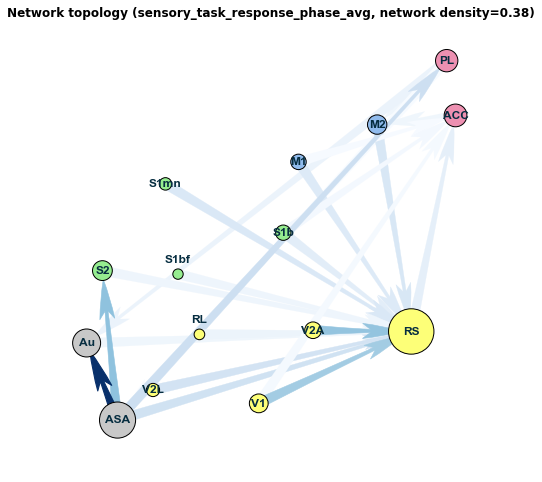

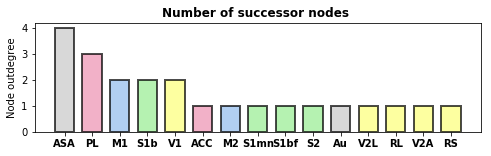

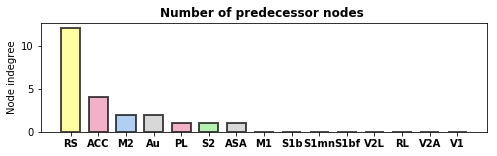

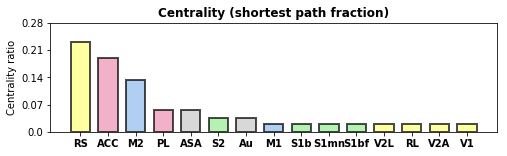

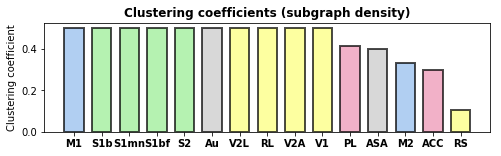

0/15 nodes were larger than max node size.
0.37911524946765196 [0.01072291 0.01155498 0.00868458 0.01054644 0.01615381 0.00898189
 0.01488733 0.00966699 0.01382235 0.01557702 0.01074646 0.0109168
 0.0105557  0.0190034  0.02834843 0.0561768  0.0180773  0.01745446
 0.01130259 0.02762756 0.00949187 0.02584653 0.01296907]
0/15 nodes were larger than max node size.
0.22599724074670924 [0.00854415 0.0078576  0.01155498 0.00868458 0.00669301 0.00521105
 0.00368268 0.00234171 0.01615381 0.00290168 0.00966699 0.00283453
 0.00503951 0.00241779 0.00816651 0.00338289 0.00623623 0.00321969
 0.00618808 0.00427826 0.00695278 0.00484786 0.00396423 0.02834843
 0.0180773  0.00373178 0.00435676 0.00287616 0.00543356 0.00949187
 0.00421561 0.00556895 0.00307622]


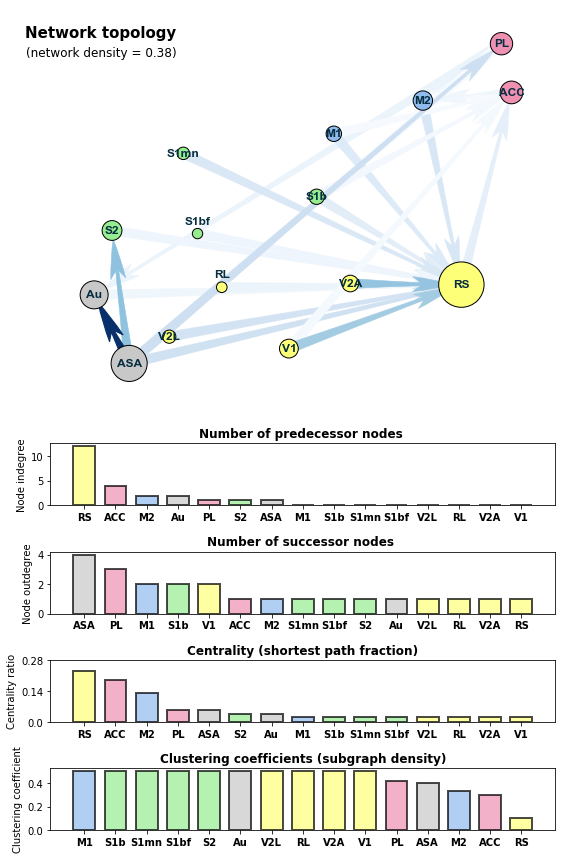

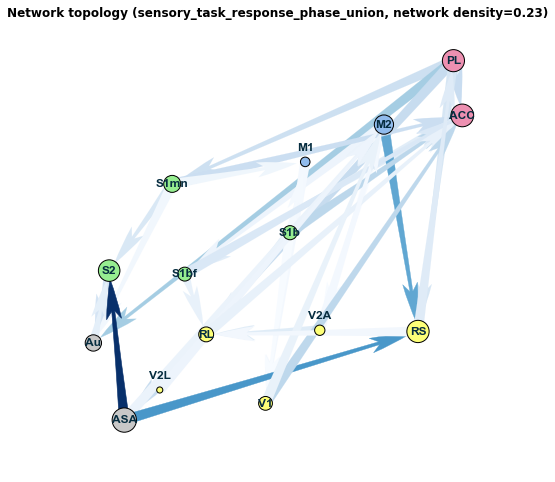

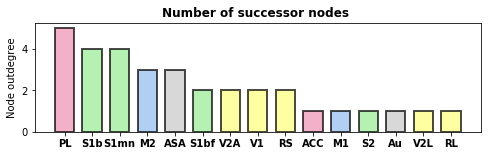

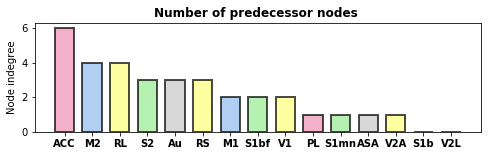

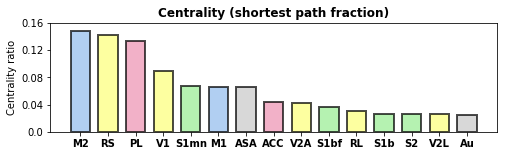

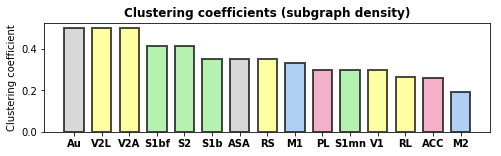

0/15 nodes were larger than max node size.
0.22599724074670924 [0.00854415 0.0078576  0.01155498 0.00868458 0.00669301 0.00521105
 0.00368268 0.00234171 0.01615381 0.00290168 0.00966699 0.00283453
 0.00503951 0.00241779 0.00816651 0.00338289 0.00623623 0.00321969
 0.00618808 0.00427826 0.00695278 0.00484786 0.00396423 0.02834843
 0.0180773  0.00373178 0.00435676 0.00287616 0.00543356 0.00949187
 0.00421561 0.00556895 0.00307622]
0/15 nodes were larger than max node size.
0.29491922724212083 [0.01080749 0.00874132 0.01606567 0.01470174 0.01327957 0.01347707
 0.00884979 0.00890984 0.00930987 0.01111545 0.01005003 0.00886187
 0.01327902 0.01081548 0.01435836 0.01061114 0.035622   0.01268389
 0.00935188 0.01387564 0.00964824 0.01716635 0.0133375 ]


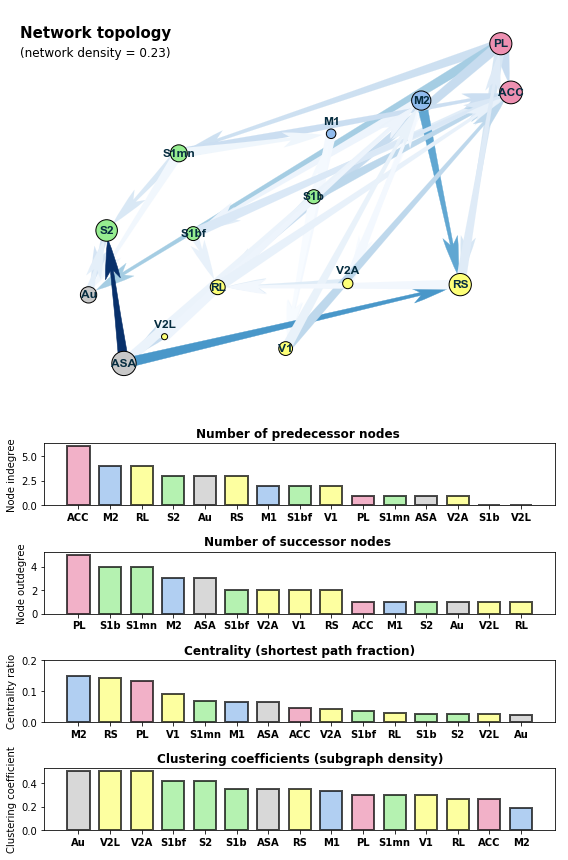

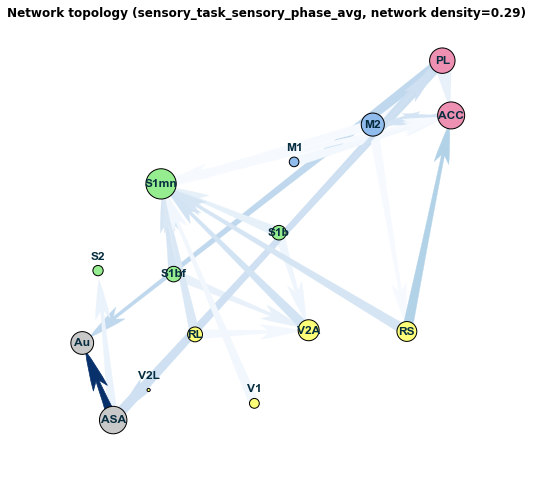

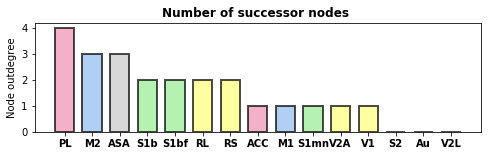

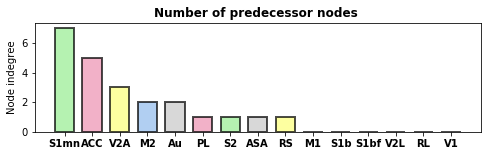

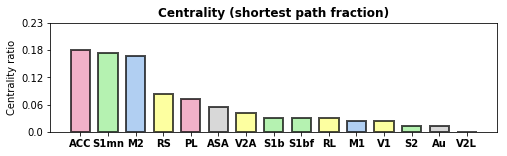

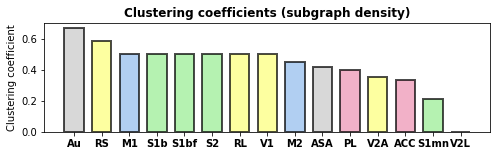

0/15 nodes were larger than max node size.
0.29491922724212083 [0.01080749 0.00874132 0.01606567 0.01470174 0.01327957 0.01347707
 0.00884979 0.00890984 0.00930987 0.01111545 0.01005003 0.00886187
 0.01327902 0.01081548 0.01435836 0.01061114 0.035622   0.01268389
 0.00935188 0.01387564 0.00964824 0.01716635 0.0133375 ]
0/15 nodes were larger than max node size.
0.17547705884907838 [0.01470174 0.0033033  0.00481466 0.00884979 0.00493487 0.00470152
 0.00669507 0.00305282 0.00424298 0.00493037 0.00735574 0.00811328
 0.01081548 0.00326719 0.00623816 0.00751228 0.00805372 0.00837943
 0.00775018 0.00674343 0.00771136 0.00564975 0.00935188 0.00497057
 0.0133375 ]


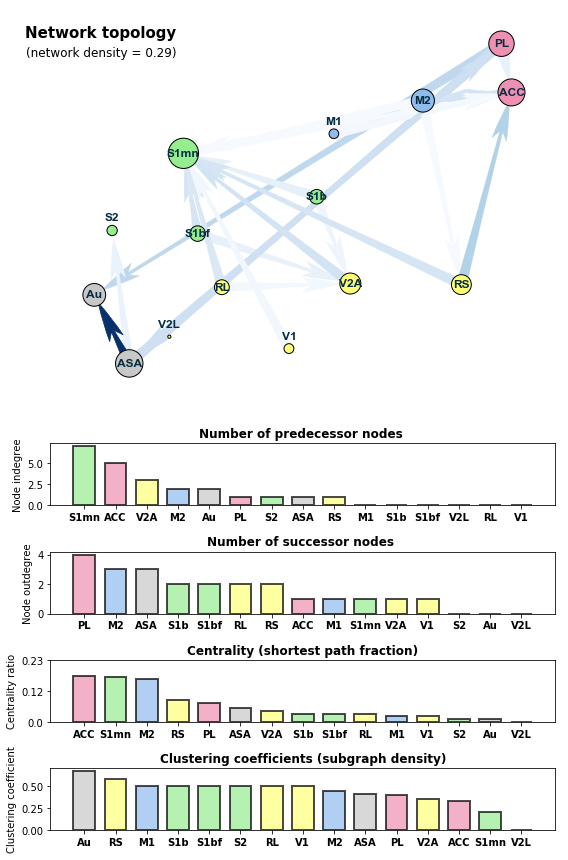

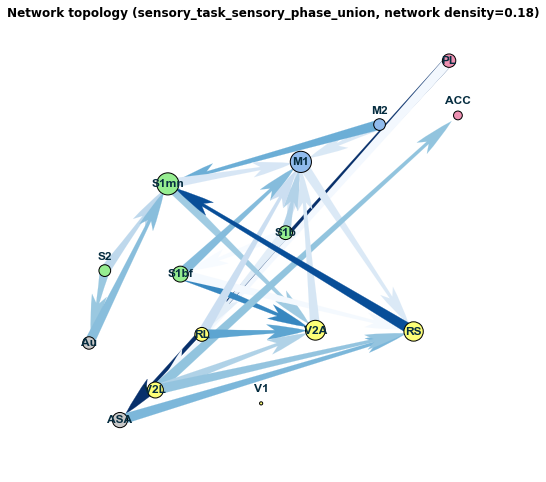

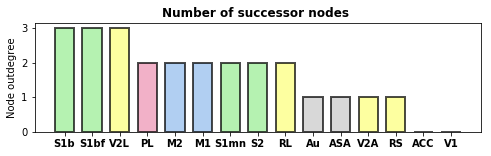

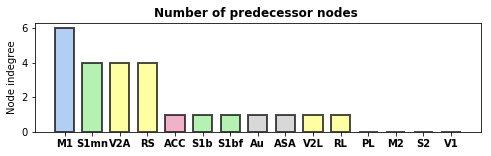

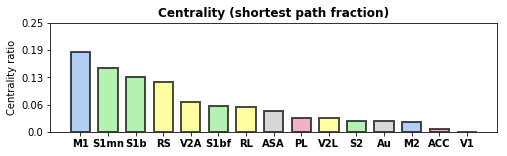

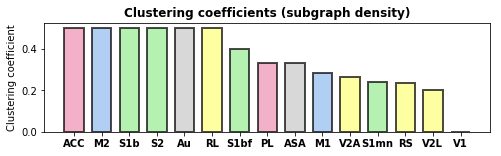

0/15 nodes were larger than max node size.
0.17547705884907838 [0.01470174 0.0033033  0.00481466 0.00884979 0.00493487 0.00470152
 0.00669507 0.00305282 0.00424298 0.00493037 0.00735574 0.00811328
 0.01081548 0.00326719 0.00623816 0.00751228 0.00805372 0.00837943
 0.00775018 0.00674343 0.00771136 0.00564975 0.00935188 0.00497057
 0.0133375 ]
4/15 nodes were larger than max node size.
1.564513583197762 [0.05213448 0.03180385 0.02884641 0.01413082 0.01341371 0.09797289
 0.12941765 0.01496418 0.02613401 0.05523105 0.27659902 0.04472944
 0.01778094 0.01342599 0.01891461 0.02442455 0.03130698 0.42057898
 0.06321015 0.02992965 0.06669976 0.07715507 0.01570941]


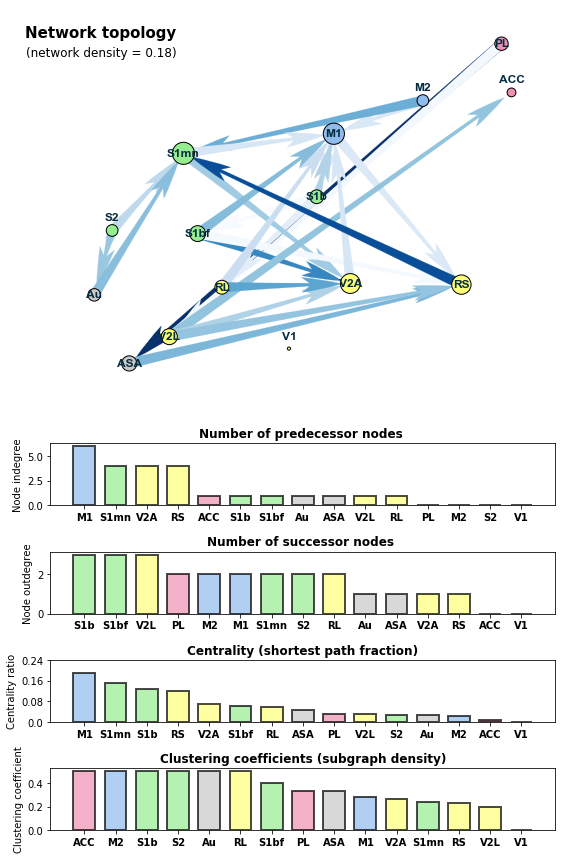

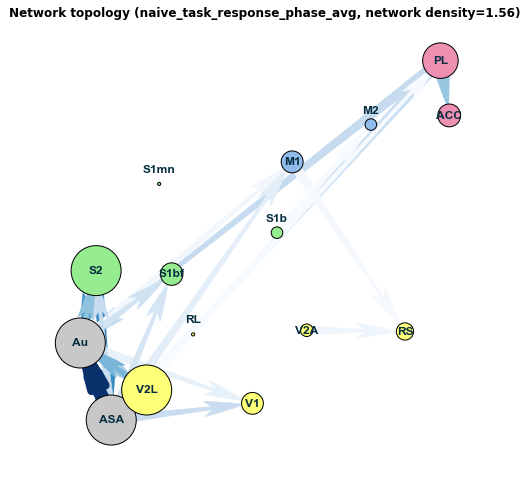

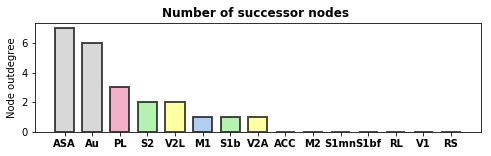

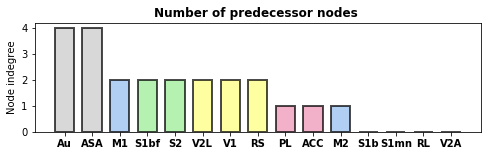

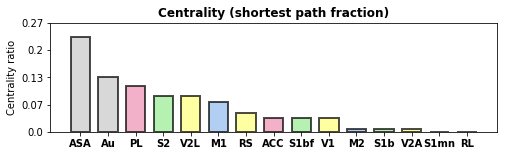

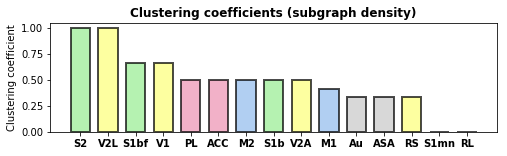

4/15 nodes were larger than max node size.
1.564513583197762 [0.05213448 0.03180385 0.02884641 0.01413082 0.01341371 0.09797289
 0.12941765 0.01496418 0.02613401 0.05523105 0.27659902 0.04472944
 0.01778094 0.01342599 0.01891461 0.02442455 0.03130698 0.42057898
 0.06321015 0.02992965 0.06669976 0.07715507 0.01570941]
0/15 nodes were larger than max node size.
0.46531306213575485 [0.05213448 0.00811704 0.0095374  0.00972716 0.00954478 0.00383256
 0.00736779 0.00965584 0.00556315 0.00332761 0.00655509 0.00196543
 0.0063606  0.00676976 0.00611585 0.09797289 0.01336963 0.00407751
 0.01778094 0.0128403  0.02442455 0.03130698 0.0069271  0.00784553
 0.01324032 0.00727199 0.0063304  0.00387727 0.01026226 0.00701599
 0.00577255 0.0025483  0.00778706 0.00363391 0.00666593 0.01192953
 0.00800428 0.00623441 0.00161891]


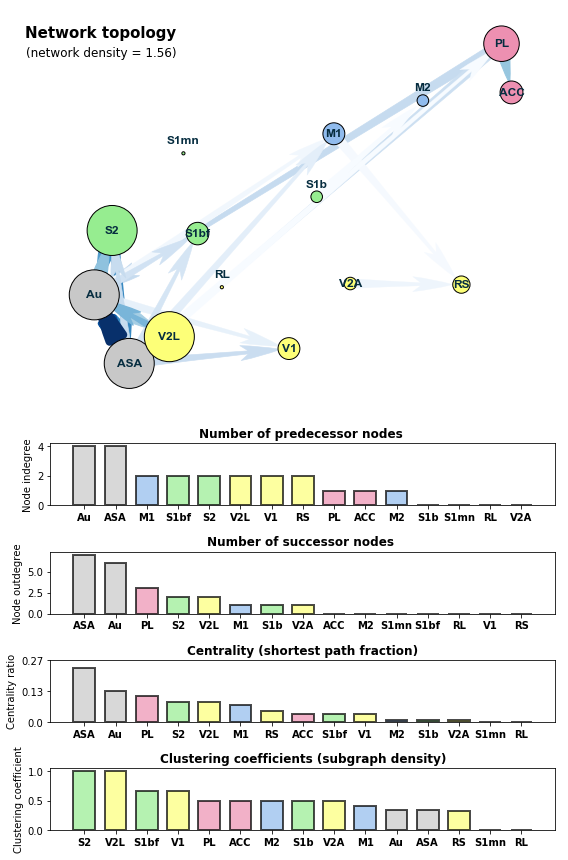

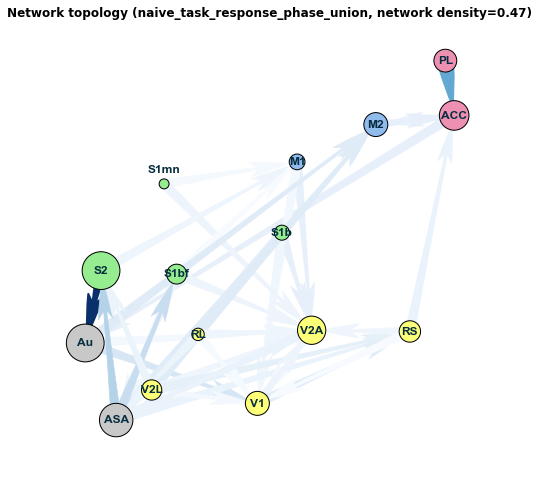

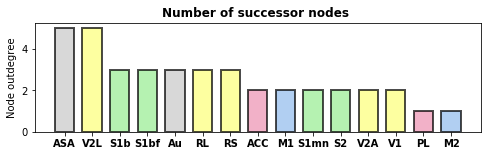

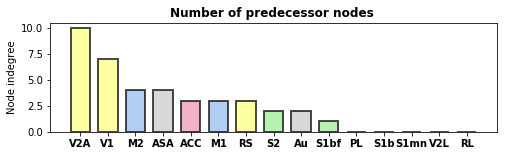

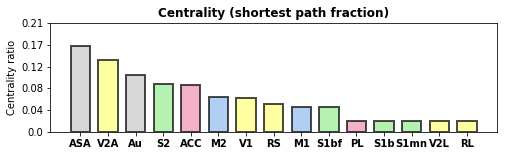

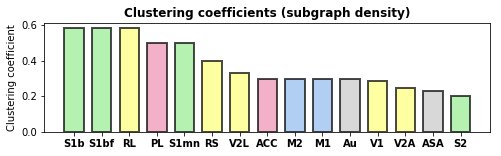

0/15 nodes were larger than max node size.
0.46531306213575485 [0.05213448 0.00811704 0.0095374  0.00972716 0.00954478 0.00383256
 0.00736779 0.00965584 0.00556315 0.00332761 0.00655509 0.00196543
 0.0063606  0.00676976 0.00611585 0.09797289 0.01336963 0.00407751
 0.01778094 0.0128403  0.02442455 0.03130698 0.0069271  0.00784553
 0.01324032 0.00727199 0.0063304  0.00387727 0.01026226 0.00701599
 0.00577255 0.0025483  0.00778706 0.00363391 0.00666593 0.01192953
 0.00800428 0.00623441 0.00161891]
2/15 nodes were larger than max node size.
1.048795063675807 [0.05643782 0.02192636 0.01869038 0.01477769 0.01402993 0.06272733
 0.0887799  0.01827104 0.0308217  0.15177074 0.02767196 0.01692464
 0.02322308 0.01595295 0.25534466 0.04941975 0.02663854 0.01482633
 0.01342313 0.03628367 0.04950222 0.02257782 0.0187734 ]


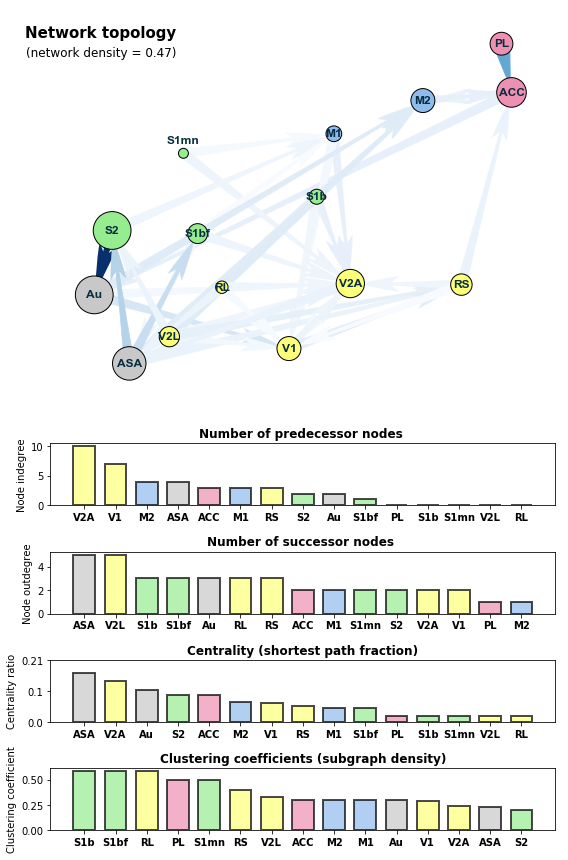

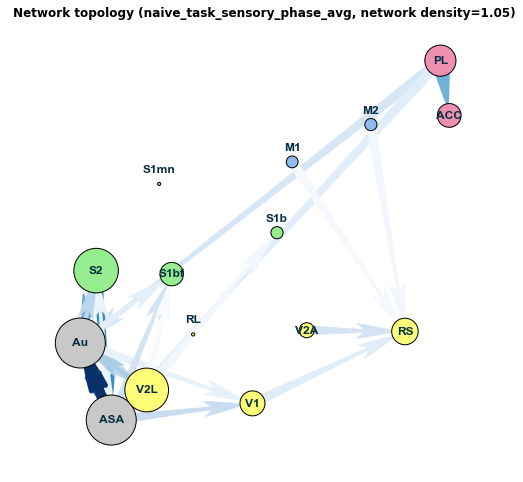

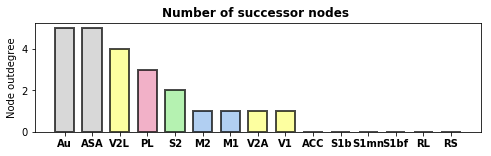

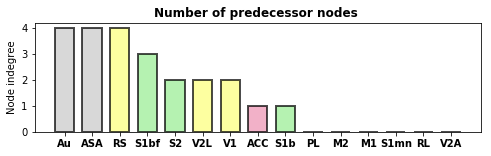

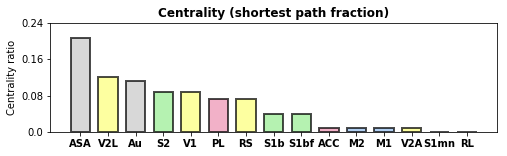

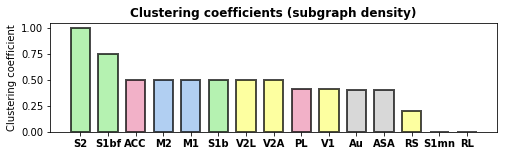

2/15 nodes were larger than max node size.
1.048795063675807 [0.05643782 0.02192636 0.01869038 0.01477769 0.01402993 0.06272733
 0.0887799  0.01827104 0.0308217  0.15177074 0.02767196 0.01692464
 0.02322308 0.01595295 0.25534466 0.04941975 0.02663854 0.01482633
 0.01342313 0.03628367 0.04950222 0.02257782 0.0187734 ]
0/15 nodes were larger than max node size.
0.5556723534408525 [0.05643782 0.00506185 0.02192636 0.00898468 0.00542249 0.00529518
 0.00588521 0.01097498 0.00882499 0.00952963 0.00205877 0.00916994
 0.00964661 0.00388085 0.00975038 0.00886412 0.00898682 0.01037634
 0.00441883 0.00554955 0.00467839 0.00821043 0.06272733 0.00385373
 0.00684281 0.01827104 0.0308217  0.01692464 0.0043694  0.00837494
 0.02322308 0.01595295 0.00535987 0.00736636 0.00332524 0.01342313
 0.04950222 0.00453979 0.00593959 0.00300827 0.00406901 0.00781478
 0.00936438 0.00595723 0.00759222 0.00435409 0.00271726 0.00604307]


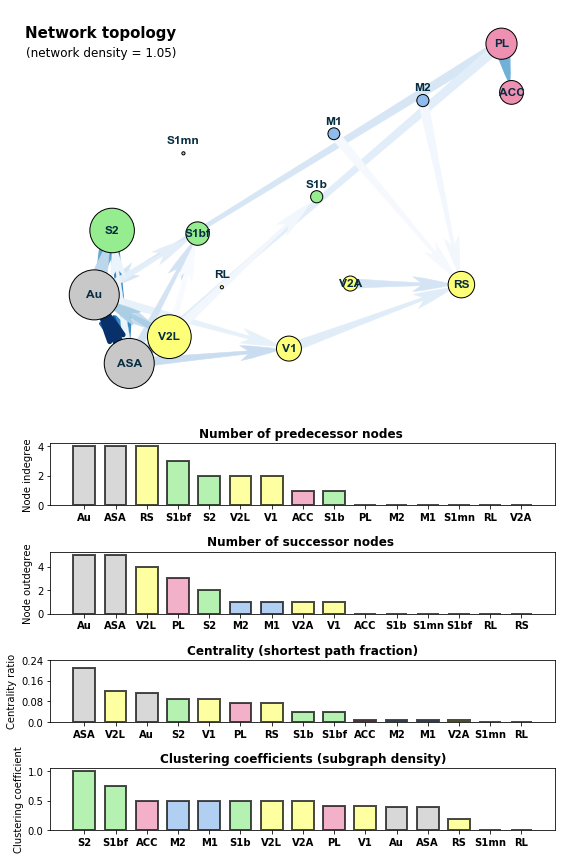

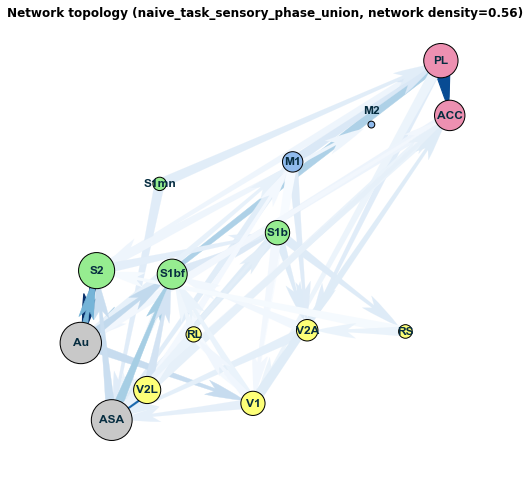

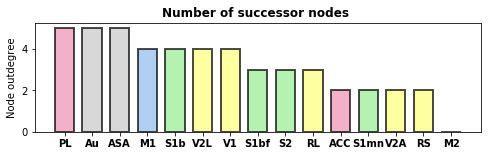

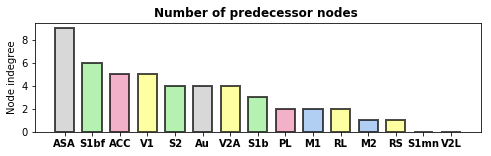

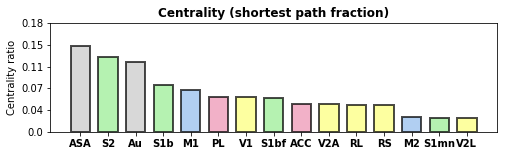

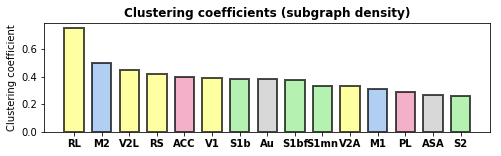

0/15 nodes were larger than max node size.
0.5556723534408525 [0.05643782 0.00506185 0.02192636 0.00898468 0.00542249 0.00529518
 0.00588521 0.01097498 0.00882499 0.00952963 0.00205877 0.00916994
 0.00964661 0.00388085 0.00975038 0.00886412 0.00898682 0.01037634
 0.00441883 0.00554955 0.00467839 0.00821043 0.06272733 0.00385373
 0.00684281 0.01827104 0.0308217  0.01692464 0.0043694  0.00837494
 0.02322308 0.01595295 0.00535987 0.00736636 0.00332524 0.01342313
 0.04950222 0.00453979 0.00593959 0.00300827 0.00406901 0.00781478
 0.00936438 0.00595723 0.00759222 0.00435409 0.00271726 0.00604307]
0/15 nodes were larger than max node size.
0.16807635744690463 [0.00658953 0.01608971 0.00535622 0.0069388  0.00497204 0.01134365
 0.00510914 0.00498075 0.00561365 0.00615022 0.00643527 0.00766406
 0.00618332 0.00587117 0.00928699 0.00648952 0.00868196 0.0053935
 0.00677279 0.00869572 0.00689547 0.00782782 0.00873506]


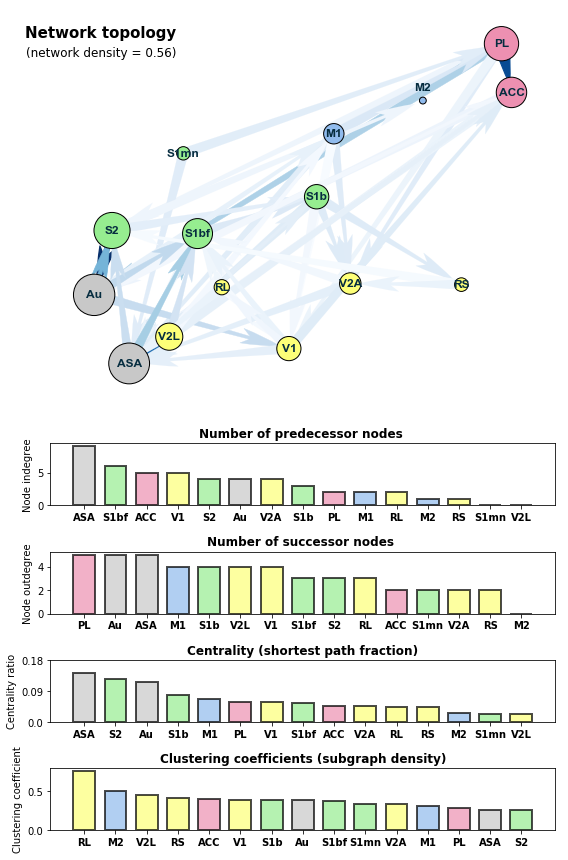

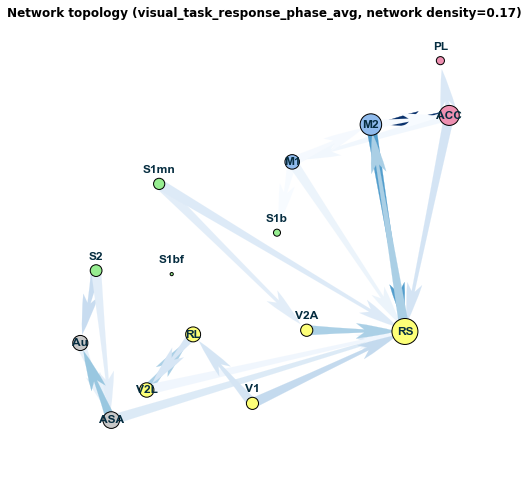

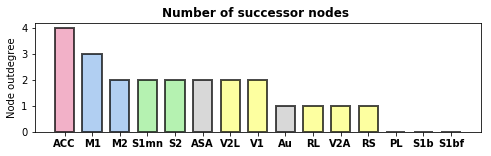

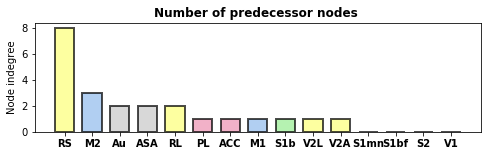

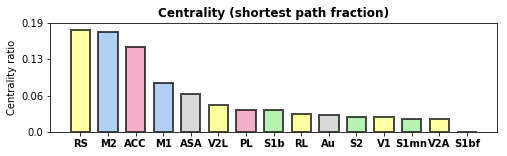

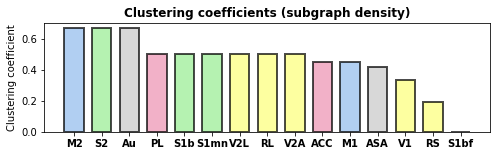

0/15 nodes were larger than max node size.
0.16807635744690463 [0.00658953 0.01608971 0.00535622 0.0069388  0.00497204 0.01134365
 0.00510914 0.00498075 0.00561365 0.00615022 0.00643527 0.00766406
 0.00618332 0.00587117 0.00928699 0.00648952 0.00868196 0.0053935
 0.00677279 0.00869572 0.00689547 0.00782782 0.00873506]
0/15 nodes were larger than max node size.
0.06459257648757655 [0.00366167 0.00393717 0.00498075 0.00180146 0.00643527 0.00766406
 0.00618332 0.00341941 0.00928699 0.00216368 0.00873506 0.00170728
 0.00252033 0.00209613]


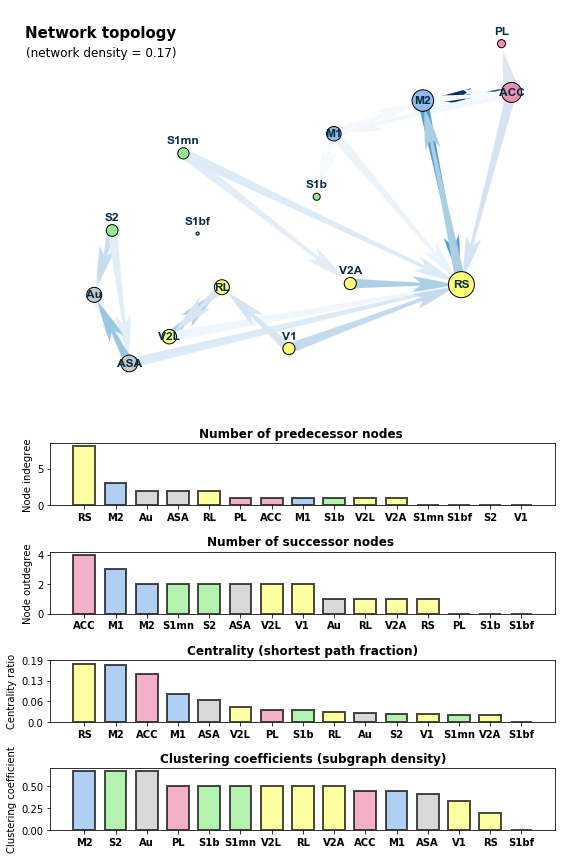

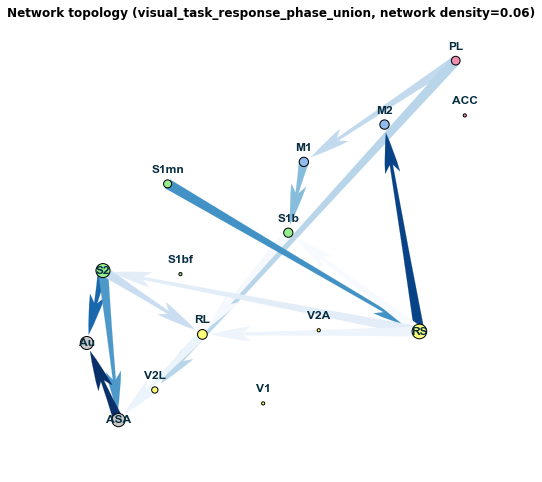

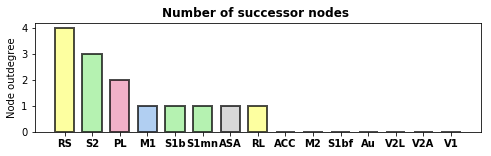

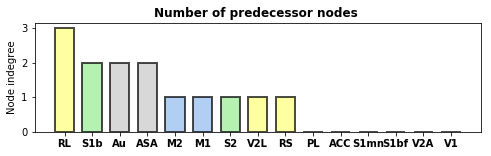

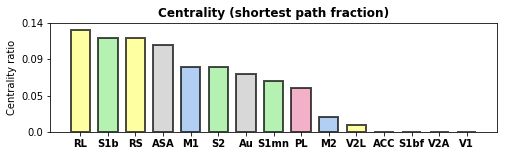

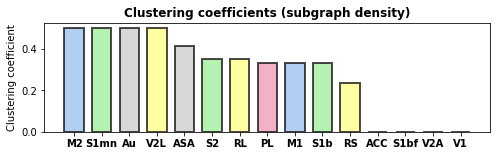

0/15 nodes were larger than max node size.
0.06459257648757655 [0.00366167 0.00393717 0.00498075 0.00180146 0.00643527 0.00766406
 0.00618332 0.00341941 0.00928699 0.00216368 0.00873506 0.00170728
 0.00252033 0.00209613]
0/15 nodes were larger than max node size.
0.22752567877352137 [0.01840202 0.0113689  0.01104595 0.00676306 0.01405435 0.0139951
 0.0068937  0.01200002 0.00887151 0.01049788 0.01262368 0.00887785
 0.01199892 0.00806353 0.00897155 0.0062866  0.01037227 0.00751656
 0.00723296 0.00776376 0.00888449 0.00619326 0.00884776]


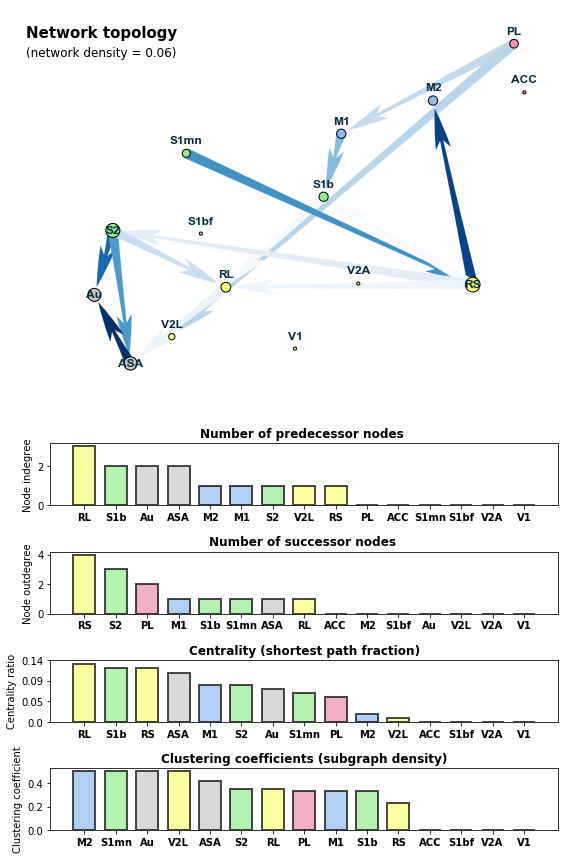

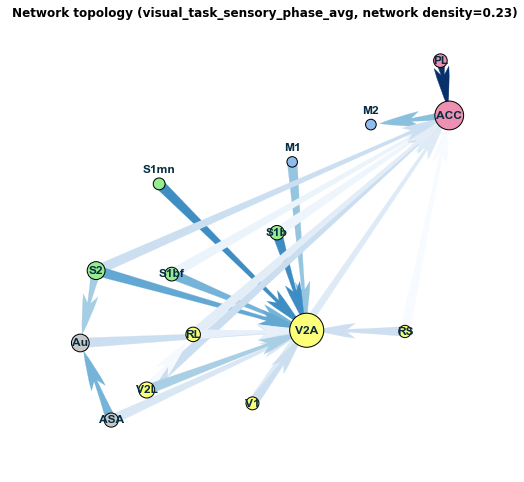

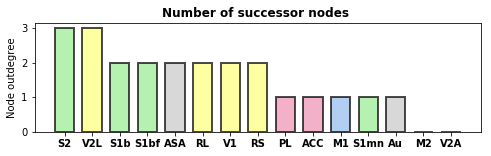

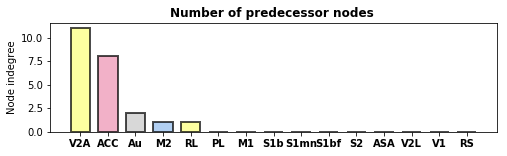

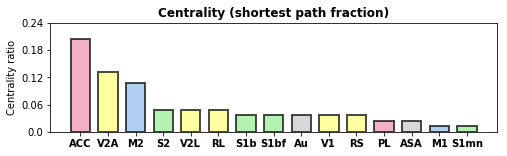

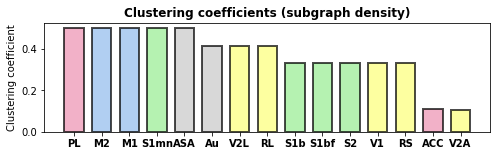

0/15 nodes were larger than max node size.
0.22752567877352137 [0.01840202 0.0113689  0.01104595 0.00676306 0.01405435 0.0139951
 0.0068937  0.01200002 0.00887151 0.01049788 0.01262368 0.00887785
 0.01199892 0.00806353 0.00897155 0.0062866  0.01037227 0.00751656
 0.00723296 0.00776376 0.00888449 0.00619326 0.00884776]
0/15 nodes were larger than max node size.
0.12427975847022044 [0.01840202 0.00306674 0.00311281 0.00454155 0.00341141 0.00250519
 0.00676306 0.0033344  0.00618445 0.00264553 0.01049788 0.00510844
 0.01199892 0.00207578 0.00351887 0.00382721 0.00751656 0.00392794
 0.00378293 0.00367101 0.00536463 0.00282917 0.00619326]


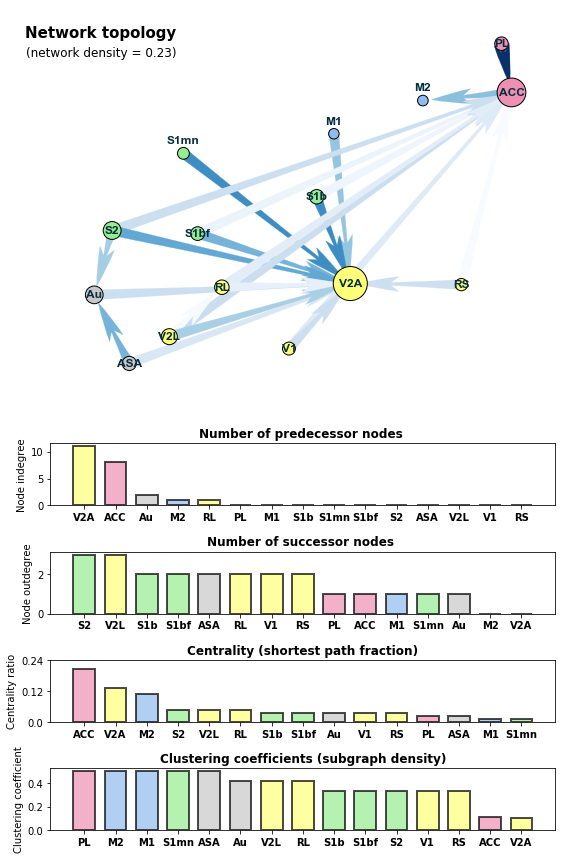

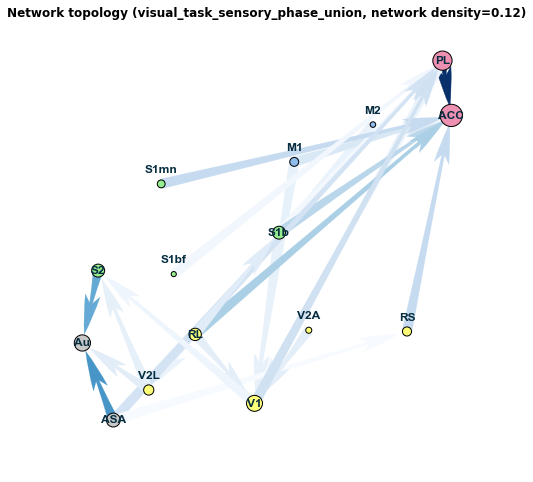

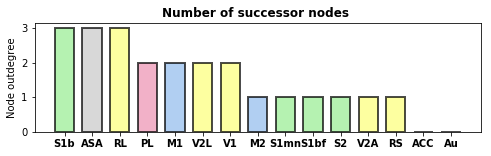

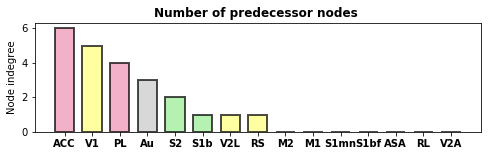

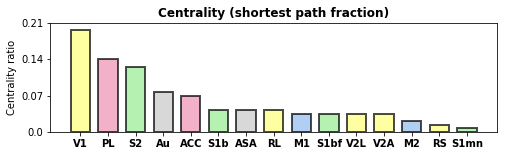

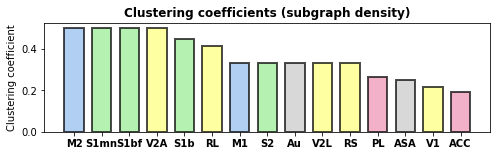

0/15 nodes were larger than max node size.
0.12427975847022044 [0.01840202 0.00306674 0.00311281 0.00454155 0.00341141 0.00250519
 0.00676306 0.0033344  0.00618445 0.00264553 0.01049788 0.00510844
 0.01199892 0.00207578 0.00351887 0.00382721 0.00751656 0.00392794
 0.00378293 0.00367101 0.00536463 0.00282917 0.00619326]


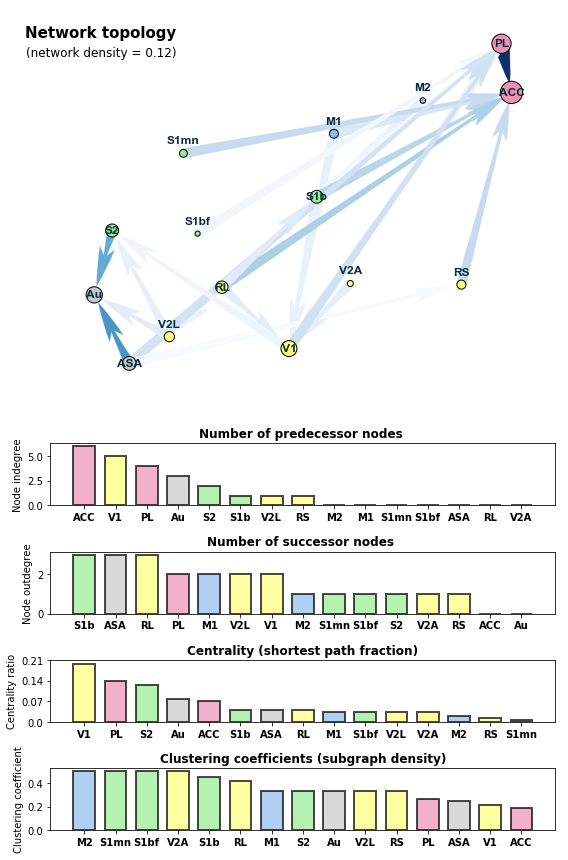

In [163]:
# Deprecated code to perform average analysis for a specific task only 

plot_params = {
    'figsize': (8,8),
    'bar_figsize': (8, 2),
    'edge_scaler' : 20,
    'default_edge_width' : 5.0,
    'default_node_size' : 50000,
    'min_node_size' : 10,
    'max_node_size': 2500,
    'thresh_to_move_node_label' : 150,
    'move_node_label' : -8,
    'node_percentile': 90,
    'node_color': 'red',
    'edge_color': 'black',
    'label_font_size': 12,
    'label_font_color':'#062D40',
    'label_font_type': 'arial',
    'label_font_weight':'bold',
    'x_label_font_weight': 'bold',
    'y_label_font_weight': 'normal',
    'title_font_weight': 'bold',
    'title_font_size': 15,
    'cmap': cmap,
    'network_arrow_style': ArrowStyle.Fancy(head_length=4, head_width=1.5, tail_width=1),
    'edge_color_map': plt.cm.Blues,
    'theta': 2e-4
}

root = '/Users/jannisborn/Desktop/HIFO/gc_results/{}/{}_{}'
root_sp = '/Users/jannisborn/Desktop/HIFO/gc_results/averages/{}_{}_{}'
directed = True


mice = ["1113rr", "1110r", "5212r", "5627rr"]
tasks = ["sensory_task", "naive_task", "visual_task"]
stim = ["V", "S", "N", "V+S"]
behs = ["H", "M", "FA", "CR", "EL"]
phases = ["response_phase", "sensory_phase"]
modes = ['avg', 'union']

        

for task in tasks:
    for phase in phases:

        # Stim data first 
        for mode in modes:

            if mode == 'avg':
                avg_data = []
                for mouse in mice:
                    p  = root.format(mouse, task, phase)
                    try:
                        data = scipy.io.loadmat(p+'/data.mat')
                    except TypeError:
                        continue
                    d = np.nan_to_num(data['results']['F'][0][0])
                    theta = plot_params.get('theta', 2e-4)
                    d[d<theta]=0
                    avg_data.append(d)
                avg_data = np.mean(np.stack(avg_data, axis=2), axis=2)
                theta_all = np.percentile(avg_data,plot_params.get('node_percentile', 95))
                avg_data[avg_data<theta_all] = 0



            elif mode == 'union':
                avg_data, mask = [], np.ones((15,15))
                for mouse in mice:
                    p  = root.format(mouse, task, phase)
                    try:
                        data = scipy.io.loadmat(p+'/data.mat')
                    except TypeError:
                        continue
                    d = np.nan_to_num(data['results']['F'][0][0])
                    theta = plot_params.get('theta', 2e-4)
                    m = d>theta
                    mask *= m 
                    avg_data.append(d)
                avg_data = np.mean(np.stack(avg_data, axis=2), axis=2)
                avg_data = np.multiply(avg_data,mask)





            sp = root_sp.format(task, phase, mode)
            os.makedirs(sp, exist_ok=True)  
            np.save(sp+'/data.npy', avg_data)

            plot_params.update({'save_path':sp})


            G = (
                nx.from_numpy_matrix(avg_data, create_using=nx.DiGraph())
                if directed else
                nx.from_numpy_matrix(avg_data, create_using=nx.Graph())
            )
            plot_network_topology(G, brain_reg, brain_pos, plot_params)
            plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params)
            plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params)
            plot_node_centrality(G, brain_reg, plot_p=plot_params)
            plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params)


            # PLOT ALL
            plot_params['save_plot']=False
            fig = plt.figure(figsize=(8, 12))

            ax0 = plt.subplot2grid((8, 1), (0, 0), rowspan=4)
            plot_network_topology(G, brain_reg, brain_pos, plot_params, ax=ax0)

            ax1 = plt.subplot2grid((8, 1), (4, 0))
            plot_node_degree(G, brain_reg, out_degree=False, plot_p=plot_params, ax=ax1)

            ax2 = plt.subplot2grid((8, 1), (5, 0))
            plot_node_degree(G, brain_reg, out_degree=True, plot_p=plot_params, ax=ax2)

            ax3 = plt.subplot2grid((8, 1), (6, 0))
            plot_node_centrality(G, brain_reg, plot_p=plot_params, ax=ax3)

            ax4 = plt.subplot2grid((8, 1), (7, 0))
            plot_clustering_coefficient(G, brain_reg, mode='both', plot_p=plot_params,ax=ax4)
            fig.tight_layout()
            fig.savefig(plot_params['save_path']+'/overview.eps')

            plot_params['save_plot']=True


